#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params_2048":{
        "linear_filters":[1024,1024,1024,2048],
        "input_feat":36,
        "dropout":0.1,
    },
    "model_params_400":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [4]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [5]:
model = SOTAEmbedding(
    linear_filters=config["model_params_2048"]["linear_filters"],
    input_feat=config["model_params_2048"]["input_feat"],
    dropout=config["model_params_2048"]["dropout"]
)

In [6]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 2048])

In [7]:
emb

tensor([[1.3405, 1.1106, 0.0000,  ..., 0.0000, 0.5485, 0.0000],
        [0.0000, 0.0000, 0.3258,  ..., 0.0911, 0.0000, 0.0000],
        [0.0000, 0.0000, 1.1483,  ..., 0.1267, 0.3664, 0.1834],
        ...,
        [1.3317, 0.0000, 0.0000,  ..., 0.0000, 0.2488, 1.4884],
        [1.0291, 0.6102, 0.6448,  ..., 1.7054, 0.3644, 0.0000],
        [0.5814, 0.1146, 0.0000,  ..., 0.2465, 1.1798, 0.0000]],
       grad_fn=<ReluBackward0>)

---

In [8]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [9]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [10]:
dataReader.data.shape

(124,)

In [11]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [12]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_2048.npz')
video_classes_2048, video_feat_2048 = video_data['activity'], video_data['features']
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_400.npz')
video_classes_400, video_feat_400 = video_data['activity'], video_data['features']

In [13]:
video_feat_2048.shape

(180, 2048)

In [14]:
np.unique(video_classes_2048, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [15]:
vid_cls_name = np.unique(video_classes_2048)

In [16]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [17]:
selecting_video_prototypes(video_feat_2048,video_classes_2048,vid_cls_name).shape

torch.Size([18, 2048])

In [18]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [19]:
np.unique(video_classes_2048)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [20]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes_2048):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [21]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [22]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [23]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 36), (16752,))

In [24]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [25]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [26]:
from numpy import random
import numpy as np
import torch
from torch.utils.data import Dataset


class PAMAP2Dataset(Dataset):
    def __init__(self, data, actions, attributes_2048, attributes_400, attribute_dict, action_classes, seq_len=120):
        super(PAMAP2Dataset, self).__init__()
        self.data = torch.from_numpy(data)
        self.actions = actions
        self.attribute_dict = attribute_dict
        self.seq_len = seq_len
        self.attributes_2048 = torch.from_numpy(attributes_2048)
        self.attributes_400 = torch.from_numpy(attributes_400)
        self.action_classes = action_classes
        # build action to id mapping dict
        self.n_action = len(self.actions)
        self.action2Id = dict(zip(action_classes, range(self.n_action)))

    def __getitem__(self, ind):
        x = self.data[ind, ...]
        target = self.actions[ind]
        y = torch.from_numpy(np.array([self.action2Id[target]]))
        # extraction semantic space generation skeleton sequences
        vid_idx = random.choice(self.attribute_dict[target])
        y_feat = self.attributes_2048[vid_idx, ...]
        return x, y, y_feat

    def __len__(self):
        return self.data.shape[0]

    def getClassAttrs(self):
        sampling_idx = [random.choice(self.attribute_dict[i]) for i in self.action_classes]
        ft_mat = self.attributes_2048[sampling_idx, ...]
        return ft_mat

    def getClassFeatures(self):
        cls_feat_2048 = []
        cls_feat_400 = []
        for cls in self.action_classes:
            idx = self.attribute_dict[cls]
            cls_feat_2048.append(torch.mean(self.attributes_2048[idx, ...], dim=0))
            cls_feat_400.append(torch.mean(self.attributes_400[idx, ...], dim=0))

        cls_feat_2048 = torch.vstack(cls_feat_2048)
        cls_feat_400 = torch.vstack(cls_feat_400)
        return cls_feat_2048, cls_feat_400


In [27]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [28]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [29]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [30]:
r,r1 = sample_dt.getClassFeatures()
r.shape,r1.shape

(torch.Size([14, 2048]), torch.Size([14, 400]))

In [31]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

def predict_class_combine(
        y_pred_2048:torch.Tensor,
        y_pred_400:torch.Tensor,
        selected_features_2048,
        selected_features_400,
        alpha = 0.5
):

    num_classes_2048 = selected_features_2048.size()[0]
    num_classes_400 = selected_features_400.size()[0]

    cosine_sim_comb = []
    for entry in y_pred_2048.unbind():
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes_2048,1),selected_features_2048)
        cosine_sim_comb.append(cosine_sim)

    pred_2048 = torch.stack(cosine_sim_comb)

    cosine_sim_comb = []
    for entry in y_pred_400.unbind():
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes_400,1),selected_features_400)
        cosine_sim_comb.append(cosine_sim)

    pred_400 = torch.stack(cosine_sim_comb)
    distance = pred_2048*alpha +(1-alpha)*pred_400

    pred = []
    for dis in distance.unbind():
        arg_max = torch.argmax(F.softmax(dis,dim=-1),dim=-1)
        pred.append(arg_max)

    pred = torch.stack(pred)
    return pred

In [32]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [33]:
def eval_step(model_2048,model_400, dataloader,dataset, device, class_names,  phase='seen', print_report=True,alpha=0.5):

    model_2048 = model_2048.eval()
    model_400 = model_400.eval()

    random_selected_feat_2048,random_selected_feat_400 = dataset.getClassFeatures()
    random_selected_feat_400 = random_selected_feat_400.to(device)
    random_selected_feat_2048 = random_selected_feat_2048.to(device)

    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, _ = batch
            X = X.float().to(device)
            X = X.float().to(device)
            targets = targets.long().to(device)

            # forward
            out_2048 = model_2048(X)
            out_400 = model_400(X)

            class_output = predict_class_combine(out_2048,out_400,random_selected_feat_2048,random_selected_feat_400,alpha=alpha)

            # convert feature vector into action class
            # using cosine
            pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

In [34]:
model_2048_w = torch.load(f"model_saves/SORTModel_feature/fold_1.pt")["model_state_dict"]
model2048 = SOTAEmbedding(
        linear_filters=config["model_params_2048"]["linear_filters"],
        input_feat=config["model_params_2048"]["input_feat"],
        dropout=config["model_params_2048"]["dropout"]
    ).load_state_dict(model_2048_w)

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


seen: 100%|██████████| 65/65 [00:27<00:00,  2.40batch/s]


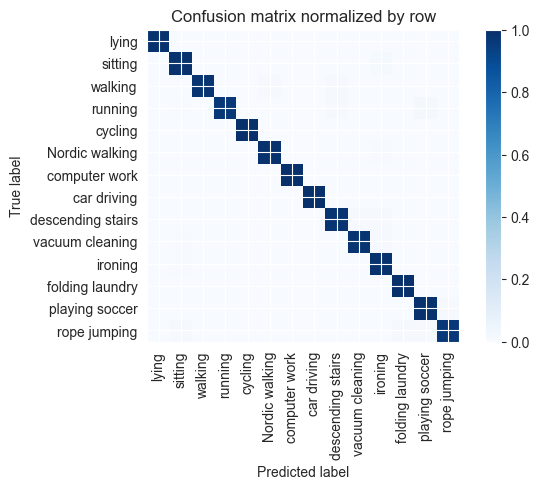

Overall accuracy: 0.988

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.997      0.998      0.146        606|	 ironing: 0.002,	sitting: 0.002,	
          walking       0.998      0.977      0.987      0.115        477|	 descending stairs: 0.010,	Nordic walking: 0.008,	
          ironing       0.974      0.991      0.983      0.110        456|	 sitting: 0.004,	descending stairs: 0.002,	
   Nordic walking       0.987      0.992      0.990      0.092        381|	 ironing: 0.005,	sitting: 0.003,	
            lying       1.000      0.989      0.995      0.091        379|	 playing soccer: 0.003,	vacuum cleaning: 0.003,	
          sitting       0.974      0.985      0.979      0.081        337|	 ironing: 0.012,	vacuum cleaning: 0.003,	
          cycling       0.997      0.997      0.997      0.078        326|	 Nordic walking: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.987      0.984      0.986      

unseen: 100%|██████████| 87/87 [00:05<00:00, 16.90batch/s]


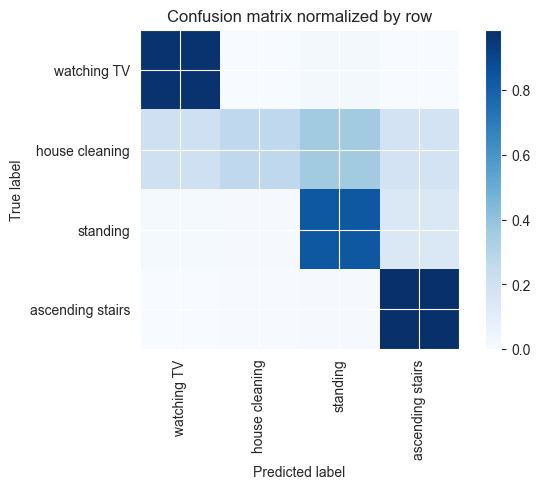

Overall accuracy: 0.696

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.694      0.834      0.757      0.331       1841|	 ascending stairs: 0.144,	watching TV: 0.012,	
  house cleaning       0.951      0.263      0.412      0.328       1829|	 standing: 0.355,	watching TV: 0.203,	
ascending stairs       0.640      0.985      0.776      0.193       1073|	 standing: 0.009,	house cleaning: 0.006,	
     watching TV       0.671      0.973      0.794      0.148        825|	 standing: 0.022,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.764      0.696      0.653        1.0       5568|	      

{'accuracy': 0.6961206896551724, 'precision': 0.7387239321187133, 'recall': 0.7637982734645328, 'f1': 0.6848277801823144}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 'sitting', 'descending 

seen: 100%|██████████| 65/65 [00:03<00:00, 17.19batch/s]


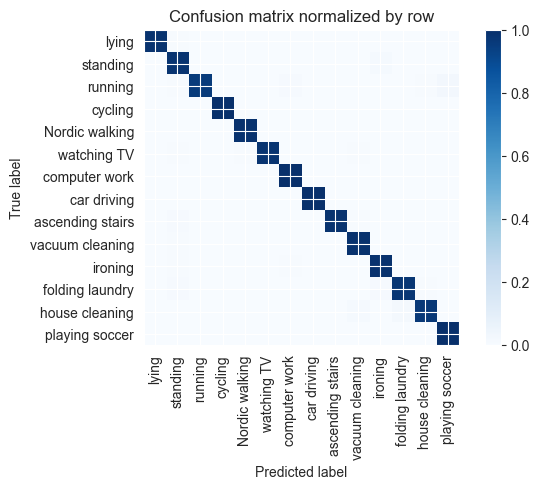

Overall accuracy: 0.987

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.992      1.000      0.996      0.148        616|	 playing soccer: 0.000,	house cleaning: 0.000,	
         ironing       0.981      0.989      0.985      0.110        459|	 standing: 0.007,	computer work: 0.004,	
           lying       1.000      0.987      0.994      0.096        398|	 standing: 0.008,	folding laundry: 0.003,	
  Nordic walking       0.997      0.992      0.994      0.087        360|	 house cleaning: 0.003,	ironing: 0.003,	
 vacuum cleaning       0.978      0.992      0.985      0.085        354|	 standing: 0.006,	ironing: 0.003,	
  house cleaning       0.991      0.966      0.978      0.084        350|	 folding laundry: 0.017,	vacuum cleaning: 0.014,	
        standing       0.958      0.983      0.970      0.084        350|	 ironing: 0.014,	folding laundry: 0.003,	
         cycling       1.000      1.000      1.000      0.079    

unseen: 100%|██████████| 86/86 [00:05<00:00, 16.61batch/s]


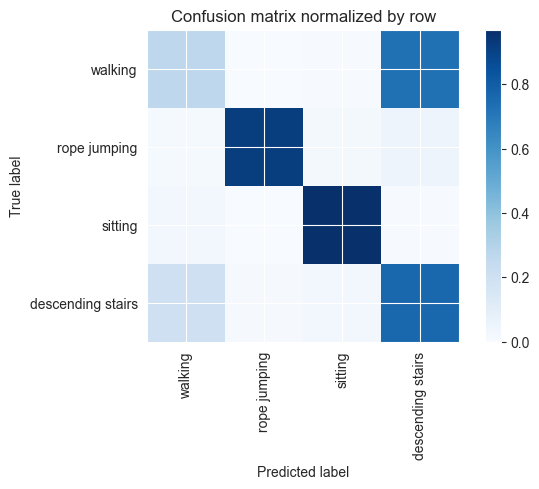

Overall accuracy: 0.634

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.721      0.268      0.390      0.420       2314|	 descending stairs: 0.729,	sitting: 0.004,	
          sitting       0.975      0.969      0.972      0.325       1787|	 walking: 0.024,	descending stairs: 0.007,	
descending stairs       0.294      0.761      0.424      0.172        944|	 walking: 0.202,	sitting: 0.029,	
     rope jumping       0.981      0.919      0.949      0.083        459|	 descending stairs: 0.048,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.752      0.634      0.631        1.0       5504|	      

{'accuracy': 0.6340843023255814, 'precision': 0.7427614524732095, 'recall': 0.7290369805669378, 'f1': 0.6839191951927103}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum cleaning', 'com

seen: 100%|██████████| 60/60 [00:03<00:00, 16.99batch/s]


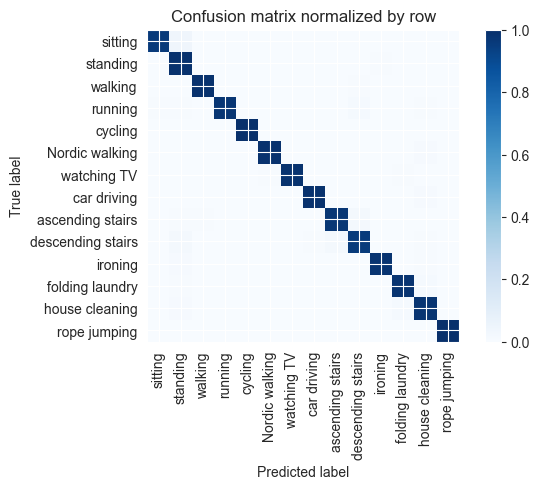

Overall accuracy: 0.982

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.993      0.984      0.988      0.113        435|	 standing: 0.009,	house cleaning: 0.005,	
          walking       0.998      0.991      0.994      0.113        434|	 descending stairs: 0.005,	ascending stairs: 0.002,	
         standing       0.928      0.990      0.958      0.101        389|	 ironing: 0.008,	sitting: 0.003,	
          sitting       0.994      0.958      0.976      0.093        359|	 standing: 0.042,	rope jumping: 0.000,	
   Nordic walking       0.997      0.989      0.993      0.093        358|	 house cleaning: 0.008,	standing: 0.003,	
   house cleaning       0.968      0.977      0.973      0.090        344|	 folding laundry: 0.015,	standing: 0.009,	
          cycling       1.000      1.000      1.000      0.081        311|	 rope jumping: 0.000,	house cleaning: 0.000,	
          running       1.000      0.974      0.987      

unseen: 100%|██████████| 111/111 [00:06<00:00, 16.59batch/s]


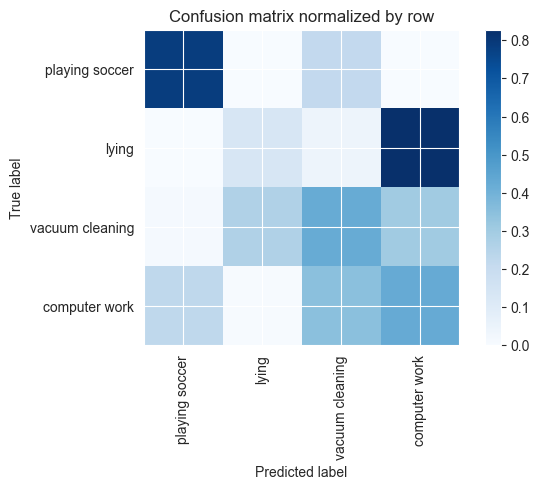

Overall accuracy: 0.370

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.386      0.424      0.404      0.432       3066|	 vacuum cleaning: 0.346,	playing soccer: 0.226,	
          lying       0.349      0.132      0.192      0.264       1876|	 computer work: 0.827,	vacuum cleaning: 0.040,	
vacuum cleaning       0.368      0.421      0.393      0.240       1704|	 computer work: 0.303,	lying: 0.264,	
 playing soccer       0.335      0.784      0.469      0.064        458|	 vacuum cleaning: 0.216,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.369      0.370      0.350 0.9999999999999999       7104|	      

{'accuracy': 0.3696509009009009, 'precision': 0.3594978414134558, 'recall': 0.4404329588850806, 'f1': 0.36452646241607656}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walkin

seen: 100%|██████████| 69/69 [00:04<00:00, 16.75batch/s]


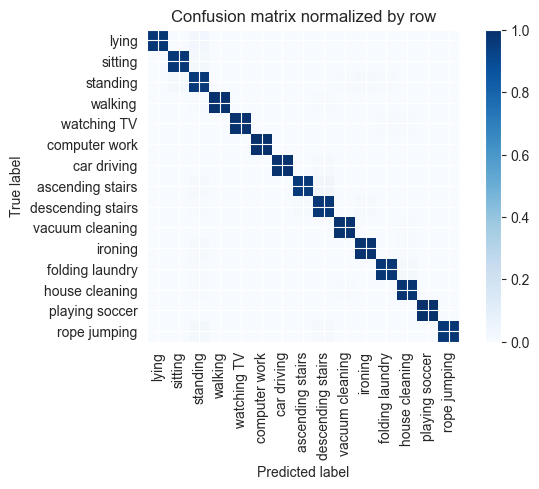

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.997      0.998      0.147        650|	 standing: 0.002,	lying: 0.002,	
          walking       1.000      0.989      0.995      0.107        471|	 standing: 0.006,	descending stairs: 0.004,	
          ironing       0.985      0.985      0.985      0.105        465|	 standing: 0.009,	house cleaning: 0.004,	
            lying       0.997      0.973      0.985      0.082        364|	 standing: 0.025,	ironing: 0.003,	
         standing       0.911      0.959      0.934      0.082        363|	 sitting: 0.017,	ironing: 0.008,	
   house cleaning       0.969      0.980      0.974      0.079        347|	 vacuum cleaning: 0.006,	standing: 0.006,	
          sitting       0.982      0.971      0.977      0.078        345|	 standing: 0.023,	house cleaning: 0.003,	
  vacuum cleaning       0.985      0.988      0.986      0.074        328|	 house c

unseen: 100%|██████████| 68/68 [00:04<00:00, 16.60batch/s]


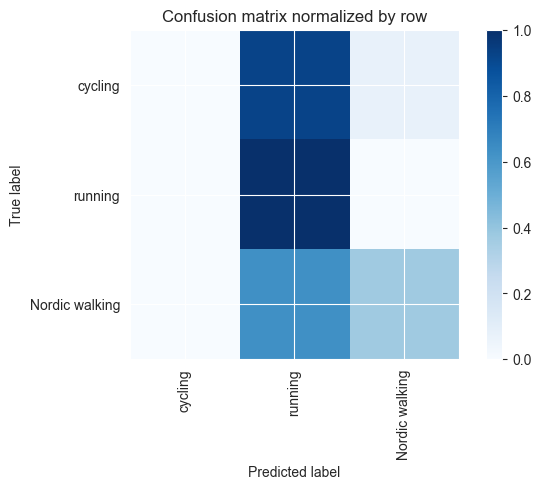

Overall accuracy: 0.371

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.848      0.369      0.514      0.420       1826|	 running: 0.631,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1586|	 running: 0.924,	Nordic walking: 0.076,	
       running       0.264      1.000      0.418      0.216        940|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.413      0.371      0.306        1.0       4352|	      

{'accuracy': 0.3708639705882353, 'precision': 0.37068879446969955, 'recall': 0.45637093829864916, 'f1': 0.3107879994381208}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, '

seen: 100%|██████████| 70/70 [00:04<00:00, 17.20batch/s]


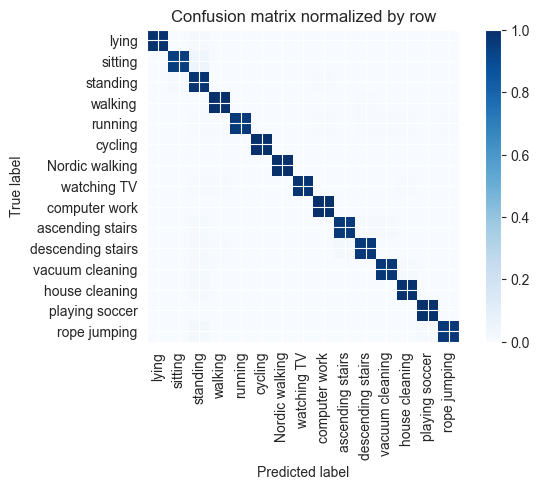

Overall accuracy: 0.984

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      1.000      0.997      0.144        647|	 rope jumping: 0.000,	playing soccer: 0.000,	
          walking       0.992      0.994      0.993      0.106        473|	 descending stairs: 0.004,	Nordic walking: 0.002,	
         standing       0.911      0.984      0.946      0.083        374|	 sitting: 0.011,	computer work: 0.005,	
            lying       1.000      0.987      0.993      0.083        371|	 standing: 0.011,	computer work: 0.003,	
   Nordic walking       0.997      1.000      0.999      0.081        364|	 rope jumping: 0.000,	playing soccer: 0.000,	
          sitting       0.988      0.949      0.968      0.079        352|	 standing: 0.045,	house cleaning: 0.003,	
   house cleaning       0.980      0.988      0.984      0.077        346|	 standing: 0.009,	vacuum cleaning: 0.003,	
          cycling       1.000      1.000      1.

unseen: 100%|██████████| 60/60 [00:03<00:00, 17.10batch/s]


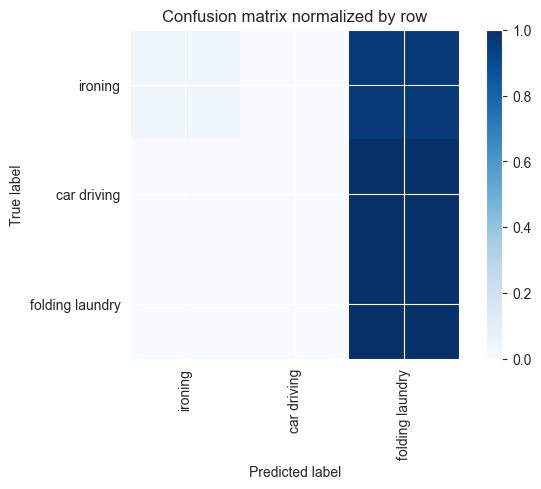

Overall accuracy: 0.275

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.036      0.070      0.607       2332|	 folding laundry: 0.964,	car driving: 0.000,	
folding laundry       0.259      1.000      0.411      0.253        971|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.673      0.275      0.146        1.0       3840|	      

{'accuracy': 0.2747395833333333, 'precision': 0.4195065672701455, 'recall': 0.3453401943967982, 'f1': 0.16012260598665037}
============== Overall Unseen Classes Performance ==============


accuracy     0.469092
precision    0.526236
recall       0.546996
f1           0.440837
dtype: float64

In [35]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model_2048_w = torch.load(f"model_saves/SORTModel_feature/fold_{i}.pt")["model_state_dict"]
    model2048 = SOTAEmbedding(
        linear_filters=config["model_params_2048"]["linear_filters"],
        input_feat=config["model_params_2048"]["input_feat"],
        dropout=config["model_params_2048"]["dropout"]
    )
    model2048.load_state_dict(model_2048_w)

    model_400_w = torch.load(f"model_saves/SORTModel_logits/fold_{i}.pt")["model_state_dict"]
    model400 = SOTAEmbedding(
        linear_filters=config["model_params_400"]["linear_filters"],
        input_feat=config["model_params_400"]["input_feat"],
        dropout=config["model_params_400"]["dropout"]
    )
    model400.load_state_dict(model_400_w)

    model2048.to(device)
    model400.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.MSELoss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    eval_metrics = eval_step(model2048, model400, eval_dl, eval_dt, device,class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True)

    # run evaluation on unseen classes
    test_metrics = eval_step(model2048, model400, test_dl,test_dt, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen')
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()


In [36]:
def run_5fold(alpha):
    fold_metric_scores = []
    for i, cs in enumerate(fold_cls_ids):
        #print("="*16, f'Fold-{i}', "="*16)
        #print(f'Unseen Classes : {fold_classes[i]}')

        data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
        all_classes = dataReader.idToLabel
        seen_classes = data_dict['seen_classes']
        unseen_classes = data_dict['unseen_classes']
        #print("seen classes > ", seen_classes)
        #print("unseen classes > ", unseen_classes)
        train_n, in_ft = data_dict['train']['X'].shape

        #print("Initiate IMU datasets ...")
        # build IMU datasets
        train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
        train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
        # build seen eval_dt
        eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
        eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
        # build unseen test_dt
        test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes_2048=video_feat_2048,attributes_400=video_feat_400, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
        test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)

        # build model
        model_2048_w = torch.load(f"model_saves/SORTModel_feature/fold_{i}.pt")["model_state_dict"]
        model2048 = SOTAEmbedding(
            linear_filters=config["model_params_2048"]["linear_filters"],
            input_feat=config["model_params_2048"]["input_feat"],
            dropout=config["model_params_2048"]["dropout"]
        )
        model2048.load_state_dict(model_2048_w)

        model_400_w = torch.load(f"model_saves/SORTModel_logits/fold_{i}.pt")["model_state_dict"]
        model400 = SOTAEmbedding(
            linear_filters=config["model_params_400"]["linear_filters"],
            input_feat=config["model_params_400"]["input_feat"],
            dropout=config["model_params_400"]["dropout"]
        )
        model400.load_state_dict(model_400_w)

        model2048.to(device)
        model400.to(device)
        # define run parameters
        optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
        loss_module = {'class': nn.CrossEntropyLoss(), 'feature': nn.MSELoss(reduction="sum")}
        best_acc = 0.0
        # train the model
        eval_metrics = eval_step(model2048, model400, eval_dl, eval_dt, device,class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=False,alpha=alpha)

        # run evaluation on unseen classes
        test_metrics = eval_step(model2048, model400, test_dl,test_dt, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen',alpha=alpha)
        fold_metric_scores.append(test_metrics)
        print(test_metrics)
        print("="*40)

    print("="*14, "Overall Unseen Classes Performance", "="*14)
    seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
    return seen_score_df.mean()


  0%|          | 0/19 [00:00<?, ?it/s]

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>



seen: 100%|██████████| 65/65 [00:03<00:00, 16.89batch/s]


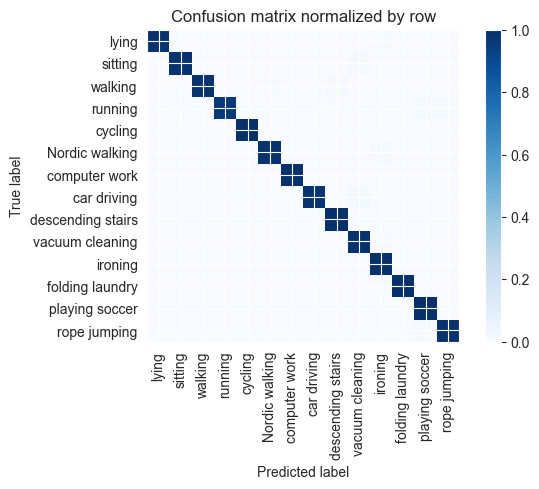

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.88batch/s]


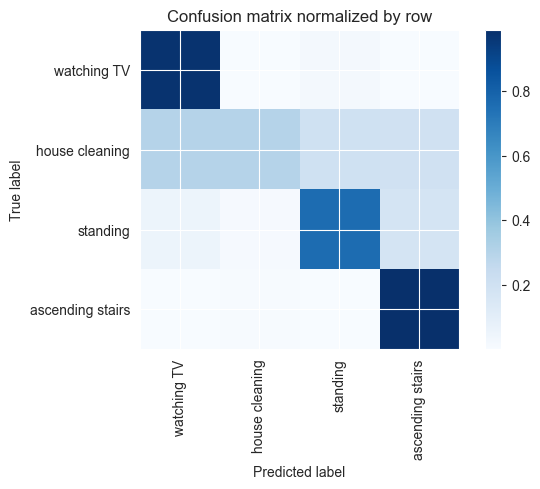

Overall accuracy: 0.686

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.784      0.760      0.772      0.331       1841|	 ascending stairs: 0.177,	watching TV: 0.052,	
  house cleaning       0.948      0.302      0.458      0.328       1828|	 watching TV: 0.300,	standing: 0.201,	
ascending stairs       0.607      0.990      0.752      0.193       1074|	 house cleaning: 0.006,	standing: 0.004,	
     watching TV       0.555      0.976      0.708      0.148        825|	 standing: 0.017,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.770      0.686      0.656        1.0       5568|	      

{'accuracy': 0.6858836206896551, 'precision': 0.7236385017424962, 'recall': 0.7568494865586903, 'f1': 0.6724864334340718}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 65/65 [00:03<00:00, 16.81batch/s]


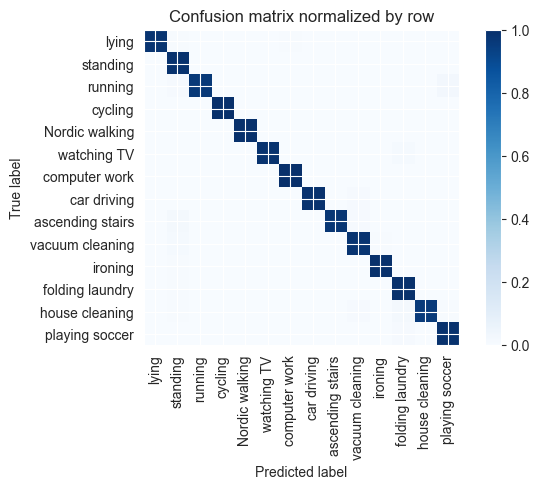

Overall accuracy: 0.987




unseen: 100%|██████████| 86/86 [00:05<00:00, 16.65batch/s]


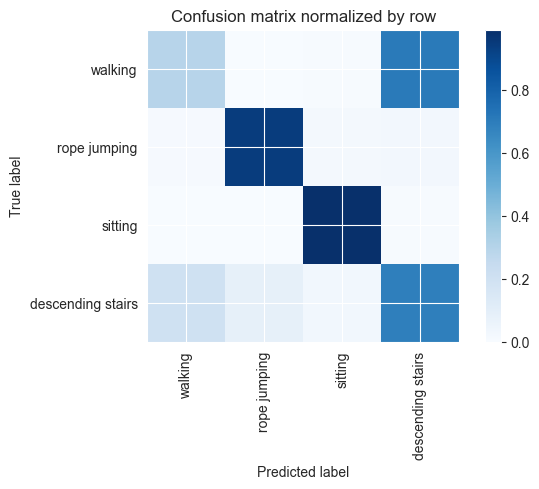

Overall accuracy: 0.640

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.771      0.291      0.422      0.420       2313|	 descending stairs: 0.704,	sitting: 0.004,	
          sitting       0.975      0.989      0.982      0.326       1794|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.281      0.688      0.400      0.171        942|	 walking: 0.201,	rope jumping: 0.082,	
     rope jumping       0.843      0.943      0.890      0.083        455|	 descending stairs: 0.026,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.759      0.640      0.639        1.0       5504|	      

{'accuracy': 0.6402616279069767, 'precision': 0.7174261963758142, 'recall': 0.727674037631318, 'f1': 0.6733864153167457}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'N


seen: 100%|██████████| 60/60 [00:03<00:00, 16.45batch/s]


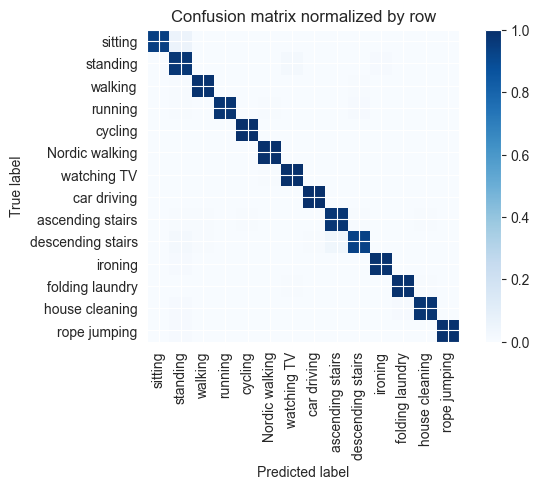

Overall accuracy: 0.979




unseen: 100%|██████████| 111/111 [00:06<00:00, 16.55batch/s]


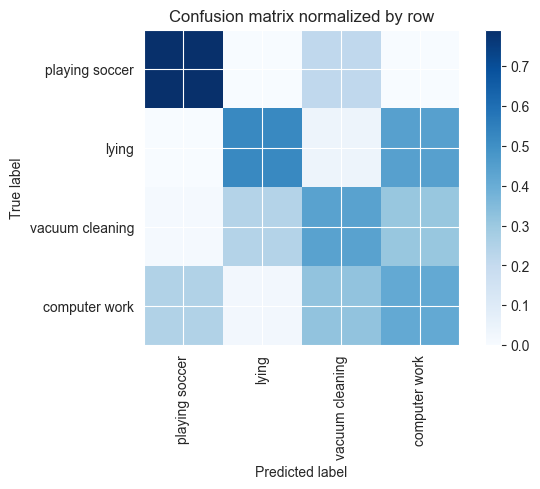

Overall accuracy: 0.471

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.484      0.413      0.446      0.432       3072|	 vacuum cleaning: 0.318,	playing soccer: 0.249,	
          lying       0.671      0.518      0.585      0.264       1873|	 computer work: 0.442,	vacuum cleaning: 0.039,	
vacuum cleaning       0.394      0.437      0.414      0.240       1702|	 computer work: 0.307,	lying: 0.243,	
 playing soccer       0.315      0.790      0.450      0.064        457|	 vacuum cleaning: 0.210,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.501      0.471      0.475        1.0       7104|	      

{'accuracy': 0.47072072072072074, 'precision': 0.4657798126064505, 'recall': 0.539561800933862, 'f1': 0.4736895239934302}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 69/69 [00:04<00:00, 16.31batch/s]


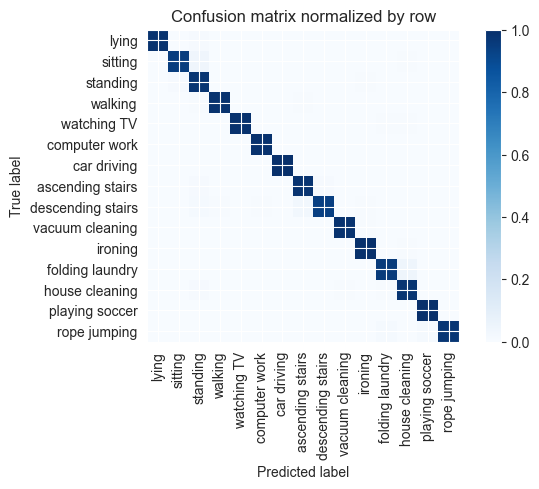

Overall accuracy: 0.981




unseen: 100%|██████████| 68/68 [00:04<00:00, 16.06batch/s]


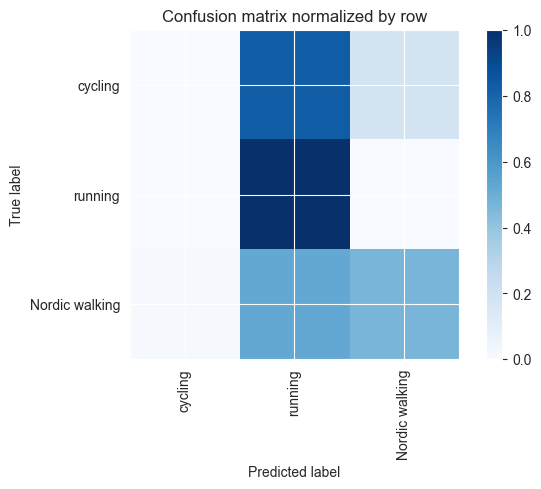

Overall accuracy: 0.412

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.754      0.466      0.576      0.419       1822|	 running: 0.524,	cycling: 0.010,	
       cycling       0.095      0.001      0.002      0.365       1589|	 running: 0.824,	Nordic walking: 0.174,	
       running       0.294      1.000      0.454      0.216        941|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.414      0.412      0.340        1.0       4352|	      

{'accuracy': 0.4117647058823529, 'precision': 0.3809460956633309, 'recall': 0.48907670439172346, 'f1': 0.34413323002188284}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':


seen: 100%|██████████| 70/70 [00:04<00:00, 16.37batch/s]


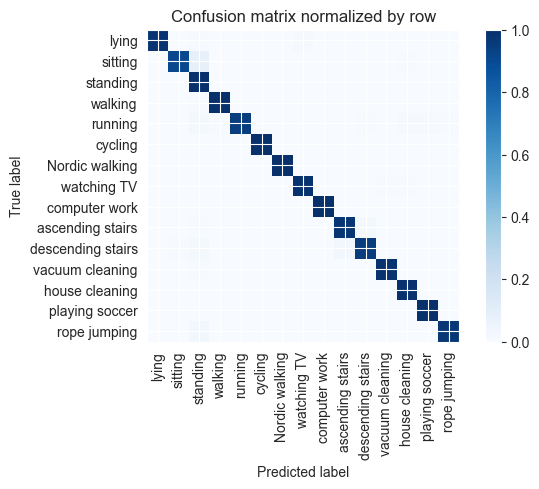

Overall accuracy: 0.981




unseen: 100%|██████████| 60/60 [00:03<00:00, 16.52batch/s]


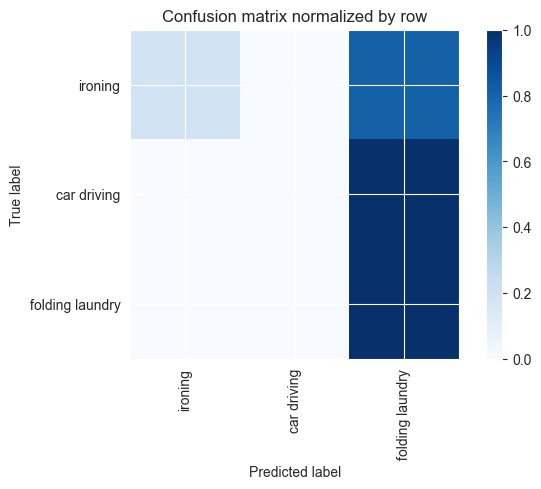

  5%|▌         | 1/19 [01:00<18:02, 60.16s/it]

Overall accuracy: 0.365

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.995      0.185      0.312      0.608       2335|	 folding laundry: 0.815,	car driving: 0.000,	
folding laundry       0.285      0.998      0.443      0.253        971|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.139        534|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.677      0.365      0.302        1.0       3840|	      

{'accuracy': 0.36484375, 'precision': 0.4266577342888271, 'recall': 0.3943169914677687, 'f1': 0.2516320677545798}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 


seen: 100%|██████████| 65/65 [00:03<00:00, 16.50batch/s]


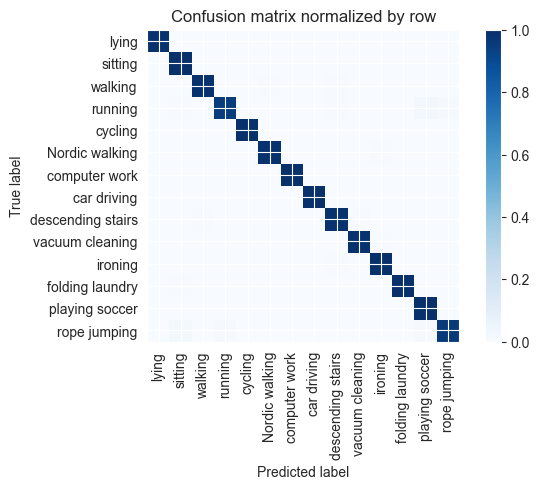

Overall accuracy: 0.992




unseen: 100%|██████████| 87/87 [00:05<00:00, 16.28batch/s]


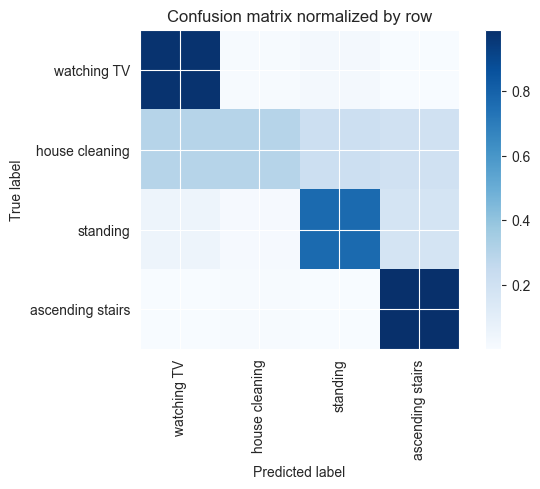

Overall accuracy: 0.686

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.775      0.768      0.771      0.331       1841|	 ascending stairs: 0.174,	watching TV: 0.048,	
  house cleaning       0.949      0.296      0.451      0.329       1831|	 watching TV: 0.295,	standing: 0.214,	
ascending stairs       0.609      0.990      0.754      0.192       1070|	 house cleaning: 0.006,	standing: 0.004,	
     watching TV       0.562      0.976      0.713      0.148        826|	 standing: 0.017,	house cleaning: 0.005,	

----------------------------------------------------------------------------------------------------
     avg / total       0.769      0.686      0.654        1.0       5568|	      

{'accuracy': 0.6860632183908046, 'precision': 0.723737762802846, 'recall': 0.7572593280370961, 'f1': 0.6723856631296755}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic w


seen: 100%|██████████| 65/65 [00:04<00:00, 15.82batch/s]


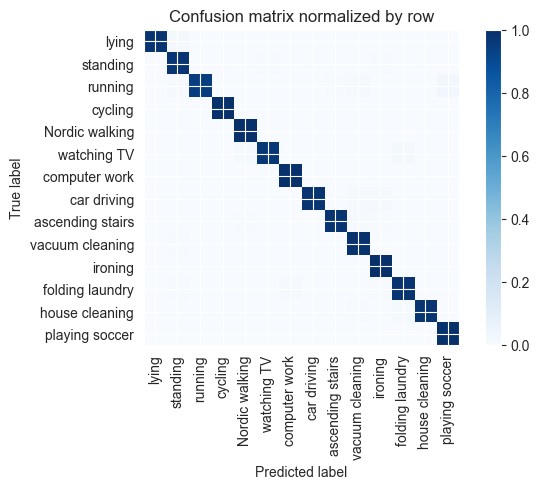

Overall accuracy: 0.987




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.79batch/s]


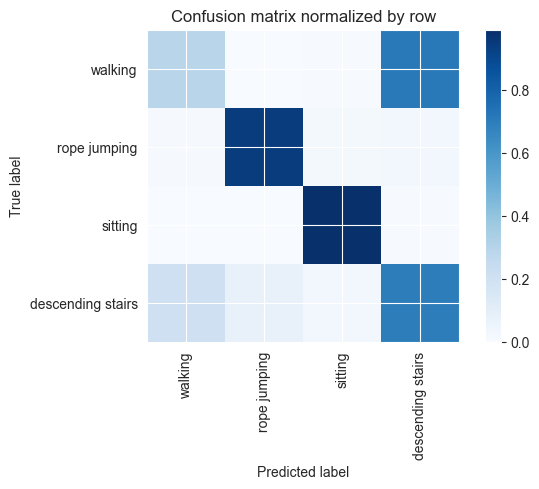

Overall accuracy: 0.639

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.766      0.287      0.417      0.421       2316|	 descending stairs: 0.709,	sitting: 0.004,	
          sitting       0.976      0.990      0.983      0.324       1786|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.283      0.696      0.402      0.172        946|	 walking: 0.203,	rope jumping: 0.074,	
     rope jumping       0.856      0.941      0.897      0.083        456|	 descending stairs: 0.029,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.758      0.639      0.638        1.0       5504|	      

{'accuracy': 0.6393531976744186, 'precision': 0.7202491698635519, 'recall': 0.7282431372267486, 'f1': 0.6747457185833122}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 60/60 [00:03<00:00, 16.32batch/s]


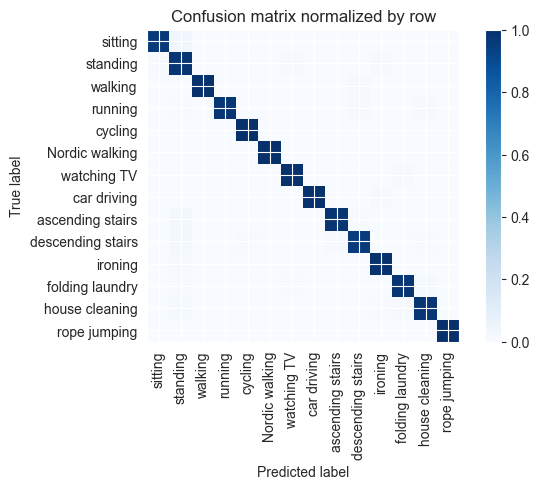

Overall accuracy: 0.983




unseen: 100%|██████████| 111/111 [00:06<00:00, 16.26batch/s]


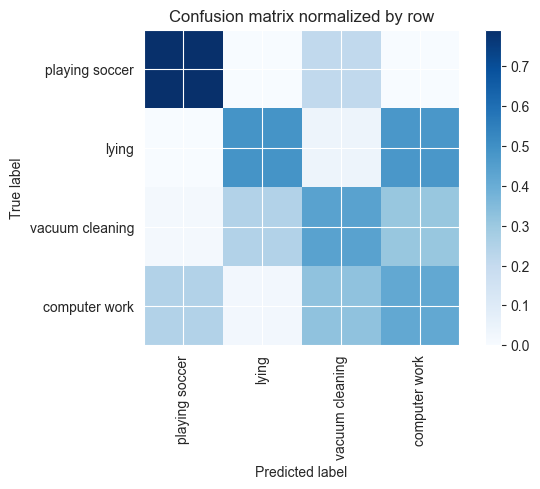

Overall accuracy: 0.462

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.474      0.414      0.442      0.432       3067|	 vacuum cleaning: 0.321,	playing soccer: 0.246,	
          lying       0.657      0.486      0.559      0.264       1875|	 computer work: 0.475,	vacuum cleaning: 0.039,	
vacuum cleaning       0.392      0.436      0.413      0.240       1704|	 computer work: 0.306,	lying: 0.245,	
 playing soccer       0.318      0.790      0.453      0.064        458|	 vacuum cleaning: 0.210,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.492      0.462      0.466        1.0       7104|	      

{'accuracy': 0.4624155405405405, 'precision': 0.45988391198631134, 'recall': 0.5315129793994894, 'f1': 0.46647605816675447}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7,


seen: 100%|██████████| 69/69 [00:04<00:00, 16.33batch/s]


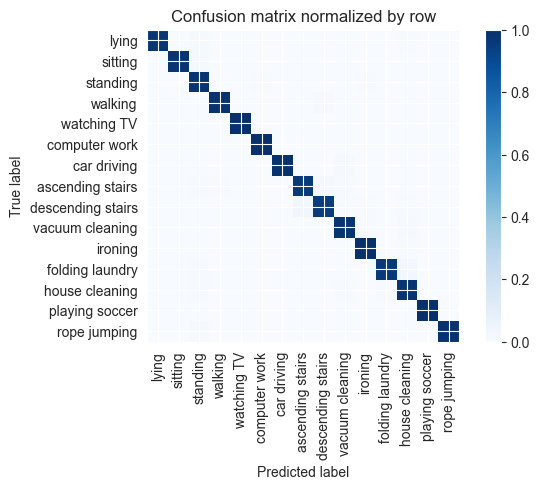

Overall accuracy: 0.984




unseen: 100%|██████████| 68/68 [00:04<00:00, 16.12batch/s]


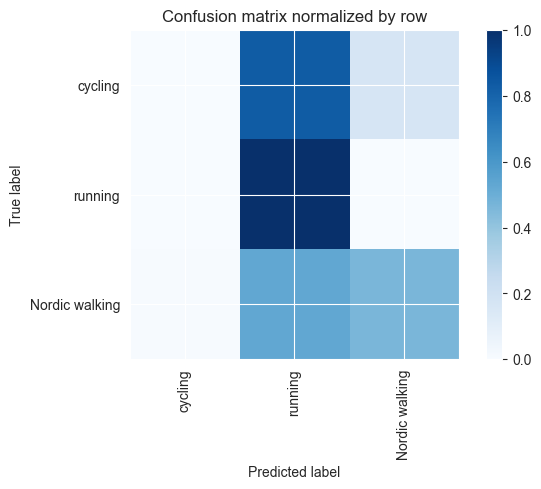

Overall accuracy: 0.411

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.761      0.464      0.576      0.419       1823|	 running: 0.531,	cycling: 0.005,	
       cycling       0.091      0.001      0.001      0.364       1586|	 running: 0.832,	Nordic walking: 0.168,	
       running       0.292      1.000      0.452      0.217        943|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.415      0.411      0.340        1.0       4352|	      

{'accuracy': 0.4110753676470588, 'precision': 0.38114520430371207, 'recall': 0.4880507282016234, 'f1': 0.3430702776170456}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 


seen: 100%|██████████| 70/70 [00:05<00:00, 13.72batch/s]


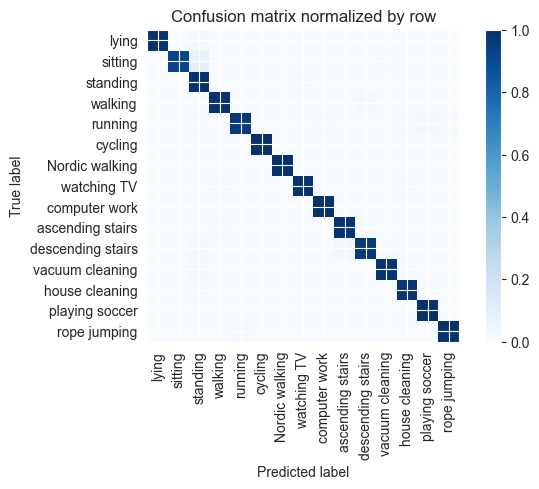

Overall accuracy: 0.982




unseen: 100%|██████████| 60/60 [00:03<00:00, 16.35batch/s]


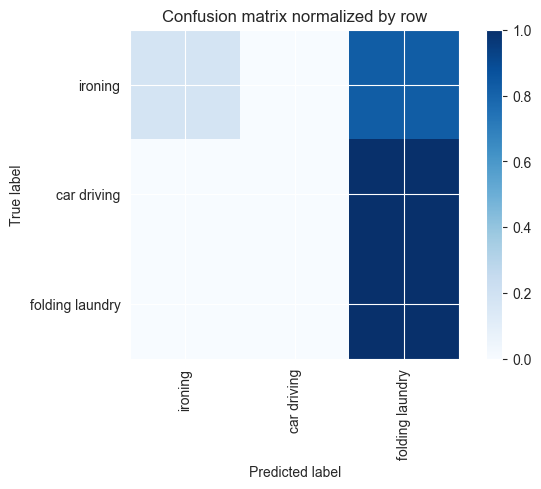

 11%|█         | 2/19 [02:02<17:21, 61.25s/it]

Overall accuracy: 0.357

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.995      0.173      0.294      0.608       2333|	 folding laundry: 0.827,	car driving: 0.000,	
folding laundry       0.282      0.998      0.440      0.253        971|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.676      0.357      0.290        1.0       3840|	      

{'accuracy': 0.3572916666666667, 'precision': 0.4257466487389479, 'recall': 0.39022641015804965, 'f1': 0.24477668452880894}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 16.14batch/s]


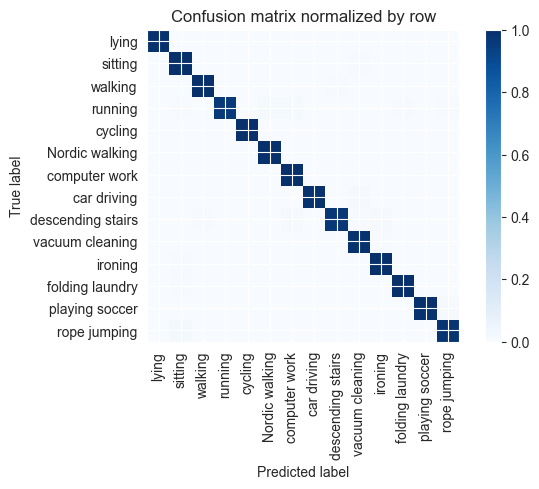

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:05<00:00, 16.18batch/s]


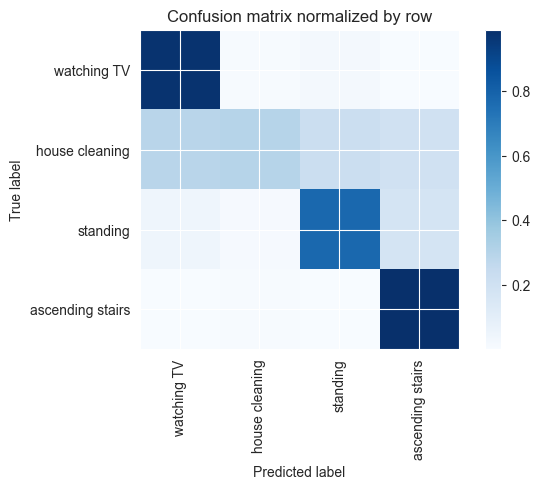

Overall accuracy: 0.689

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.772      0.775      0.773      0.331       1845|	 ascending stairs: 0.172,	watching TV: 0.044,	
  house cleaning       0.952      0.296      0.452      0.328       1828|	 watching TV: 0.288,	standing: 0.221,	
ascending stairs       0.611      0.990      0.755      0.192       1071|	 house cleaning: 0.006,	standing: 0.004,	
     watching TV       0.569      0.975      0.719      0.148        824|	 standing: 0.018,	house cleaning: 0.005,	

----------------------------------------------------------------------------------------------------
     avg / total       0.770      0.689      0.656        1.0       5568|	      

{'accuracy': 0.6885775862068966, 'precision': 0.7259713322128608, 'recall': 0.7588158496909705, 'f1': 0.6746999879515139}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 


seen: 100%|██████████| 65/65 [00:04<00:00, 16.18batch/s]


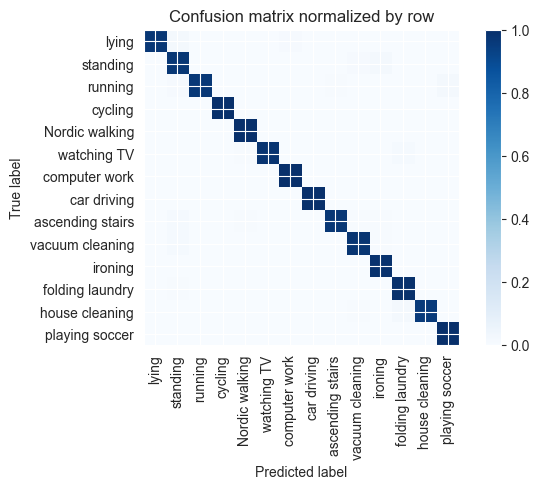

Overall accuracy: 0.984




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.93batch/s]


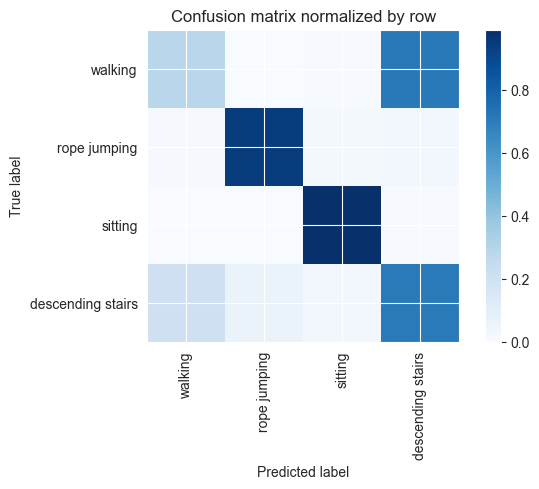

Overall accuracy: 0.640

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.767      0.285      0.415      0.421       2317|	 descending stairs: 0.710,	sitting: 0.004,	
          sitting       0.975      0.989      0.982      0.326       1792|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.284      0.705      0.405      0.171        941|	 walking: 0.202,	rope jumping: 0.064,	
     rope jumping       0.873      0.941      0.906      0.082        454|	 descending stairs: 0.031,	sitting: 0.018,	

----------------------------------------------------------------------------------------------------
      avg / total       0.761      0.640      0.639        1.0       5504|	      

{'accuracy': 0.6400799418604651, 'precision': 0.7247067936245185, 'recall': 0.7298366657880375, 'f1': 0.6769714467515711}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 60/60 [00:03<00:00, 15.98batch/s]


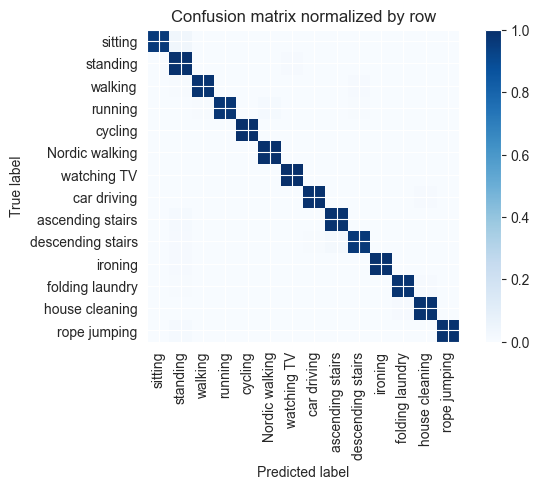

Overall accuracy: 0.985




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.58batch/s]


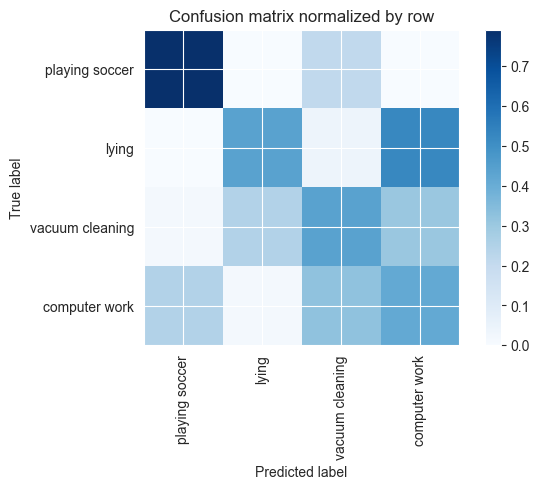

Overall accuracy: 0.449

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.458      0.413      0.435      0.432       3069|	 vacuum cleaning: 0.325,	playing soccer: 0.244,	
          lying       0.634      0.437      0.517      0.264       1876|	 computer work: 0.524,	vacuum cleaning: 0.039,	
vacuum cleaning       0.390      0.436      0.412      0.240       1703|	 computer work: 0.305,	lying: 0.245,	
 playing soccer       0.318      0.792      0.454      0.064        456|	 vacuum cleaning: 0.208,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.479      0.449      0.452        1.0       7104|	      

{'accuracy': 0.44932432432432434, 'precision': 0.4500358758718047, 'recall': 0.5195031172134773, 'f1': 0.45436143803038087}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7,


seen: 100%|██████████| 69/69 [00:04<00:00, 15.89batch/s]


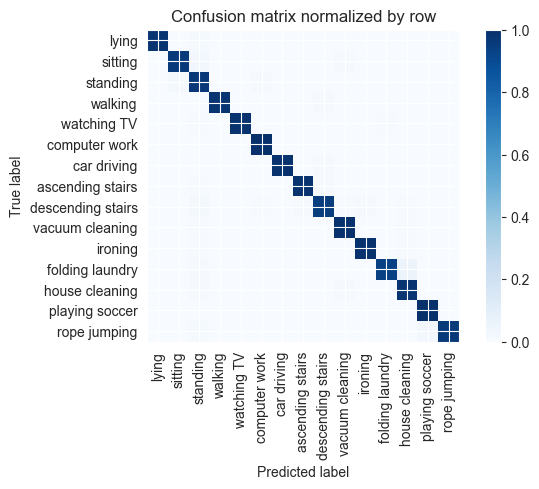

Overall accuracy: 0.979




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.53batch/s]


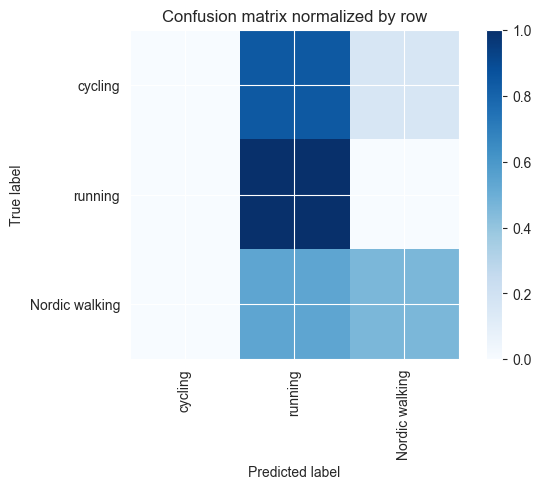

Overall accuracy: 0.409

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.770      0.461      0.576      0.418       1819|	 running: 0.537,	cycling: 0.002,	
       cycling       0.000      0.000      0.000      0.365       1589|	 running: 0.842,	Nordic walking: 0.158,	
       running       0.290      1.000      0.449      0.217        944|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.384      0.409      0.338        1.0       4352|	      

{'accuracy': 0.4094669117647059, 'precision': 0.3530575732310788, 'recall': 0.4868975627634231, 'f1': 0.3418480260655284}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8


seen: 100%|██████████| 70/70 [00:04<00:00, 15.94batch/s]


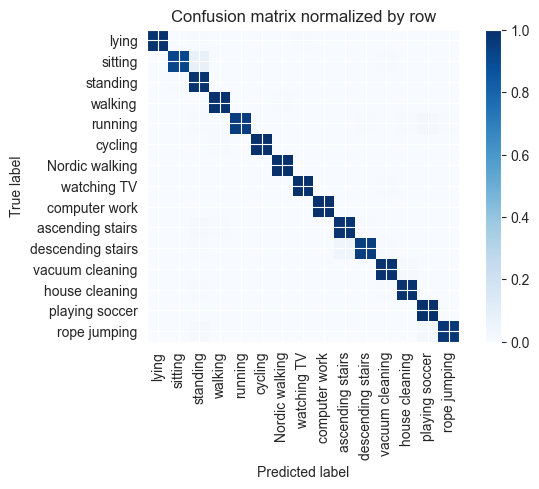

Overall accuracy: 0.981




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.91batch/s]


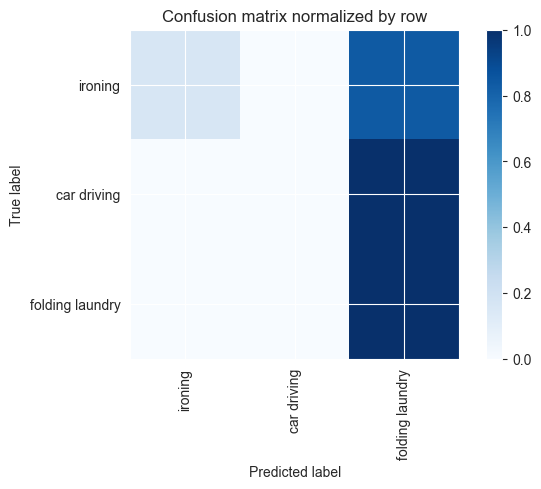

 16%|█▌        | 3/19 [03:04<16:25, 61.62s/it]

Overall accuracy: 0.351

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.995      0.162      0.278      0.606       2328|	 folding laundry: 0.838,	car driving: 0.000,	
folding laundry       0.281      0.998      0.438      0.254        974|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.674      0.351      0.280        1.0       3840|	      

{'accuracy': 0.35104166666666664, 'precision': 0.4251842271682395, 'recall': 0.38648621313368664, 'f1': 0.2387441383894212}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 16.19batch/s]


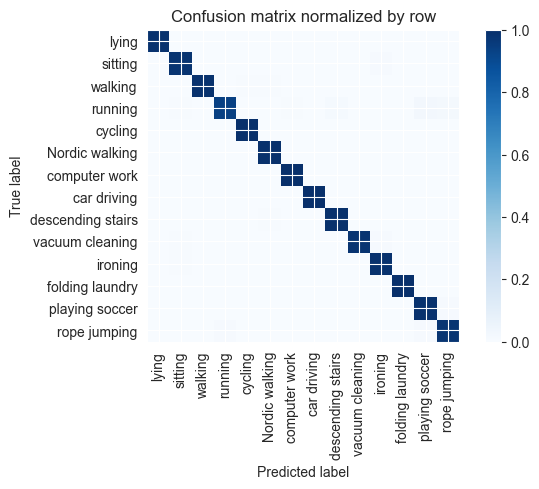

Overall accuracy: 0.990




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.93batch/s]


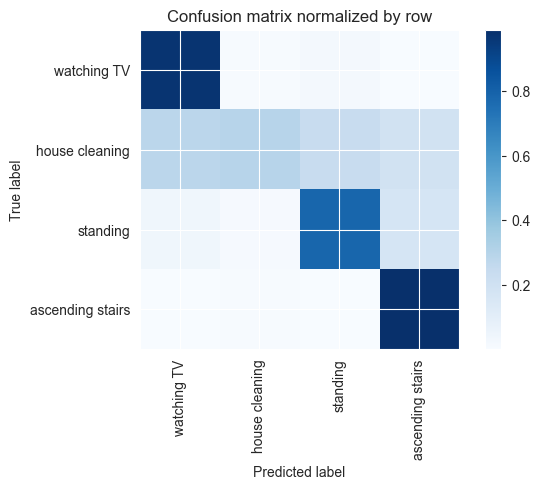

Overall accuracy: 0.689

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.762      0.783      0.772      0.330       1835|	 ascending stairs: 0.169,	watching TV: 0.038,	
  house cleaning       0.952      0.292      0.447      0.329       1834|	 watching TV: 0.282,	standing: 0.234,	
ascending stairs       0.615      0.990      0.758      0.193       1072|	 house cleaning: 0.006,	standing: 0.004,	
     watching TV       0.578      0.973      0.725      0.149        827|	 standing: 0.019,	house cleaning: 0.005,	

----------------------------------------------------------------------------------------------------
     avg / total       0.769      0.689      0.655        1.0       5568|	      

{'accuracy': 0.6892959770114943, 'precision': 0.7265222703322951, 'recall': 0.7594887502869022, 'f1': 0.6755918033378827}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 


seen: 100%|██████████| 65/65 [00:04<00:00, 13.46batch/s]


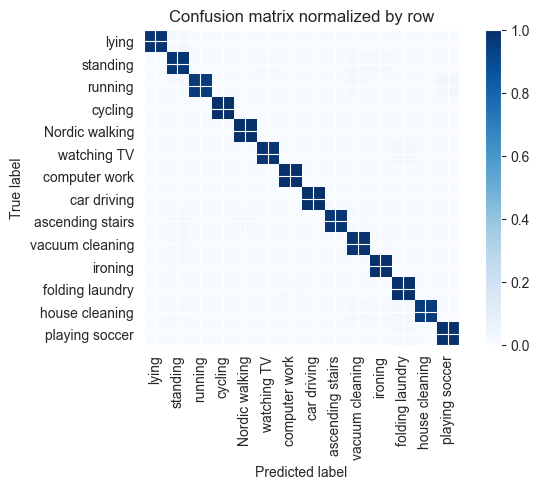

Overall accuracy: 0.985




unseen: 100%|██████████| 86/86 [00:05<00:00, 14.98batch/s]


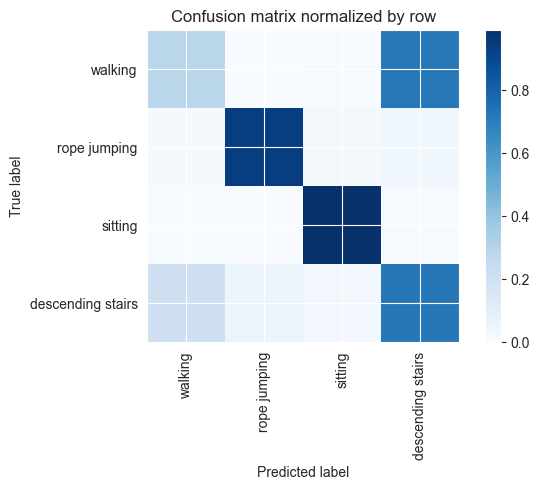

Overall accuracy: 0.641

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.766      0.283      0.413      0.422       2320|	 descending stairs: 0.713,	sitting: 0.004,	
          sitting       0.975      0.989      0.982      0.324       1783|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.287      0.718      0.410      0.171        942|	 walking: 0.202,	rope jumping: 0.051,	
     rope jumping       0.897      0.935      0.916      0.083        459|	 descending stairs: 0.035,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.762      0.641      0.639        1.0       5504|	      

{'accuracy': 0.640625, 'precision': 0.7311232677593541, 'recall': 0.7311990153268894, 'f1': 0.6801905486315752}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic wal


seen: 100%|██████████| 60/60 [00:04<00:00, 14.82batch/s]


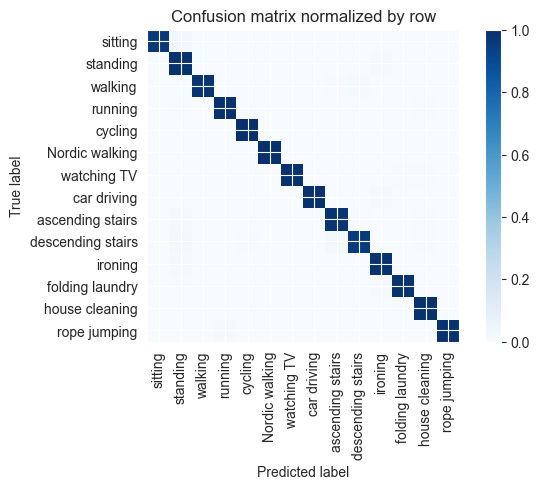

Overall accuracy: 0.985




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.55batch/s]


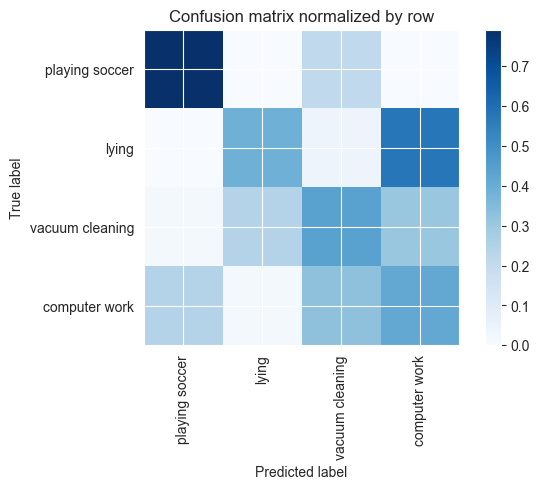

Overall accuracy: 0.438

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.445      0.416      0.430      0.432       3071|	 vacuum cleaning: 0.325,	playing soccer: 0.243,	
          lying       0.609      0.388      0.474      0.264       1872|	 computer work: 0.572,	vacuum cleaning: 0.039,	
vacuum cleaning       0.390      0.436      0.412      0.240       1706|	 computer work: 0.307,	lying: 0.244,	
 playing soccer       0.319      0.791      0.455      0.064        455|	 vacuum cleaning: 0.209,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.467      0.438      0.439        1.0       7104|	      

{'accuracy': 0.43764076576576577, 'precision': 0.4407045954722964, 'recall': 0.5079556093860234, 'f1': 0.44264135631080026}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7,


seen: 100%|██████████| 69/69 [00:04<00:00, 15.82batch/s]


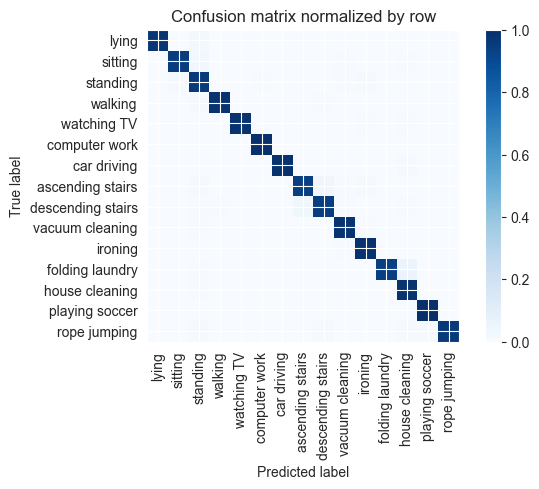

Overall accuracy: 0.975




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.84batch/s]


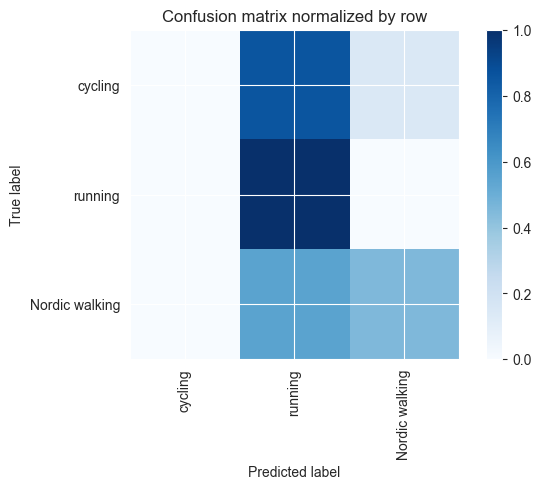

Overall accuracy: 0.404

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.784      0.451      0.572      0.419       1824|	 running: 0.549,	cycling: 0.001,	
       cycling       0.000      0.000      0.000      0.365       1590|	 running: 0.858,	Nordic walking: 0.142,	
       running       0.284      1.000      0.442      0.216        938|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.390      0.404      0.335        1.0       4352|	      

{'accuracy': 0.40441176470588236, 'precision': 0.3561118005914894, 'recall': 0.48355263157894735, 'f1': 0.33825730034677176}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning'


seen: 100%|██████████| 70/70 [00:04<00:00, 15.93batch/s]


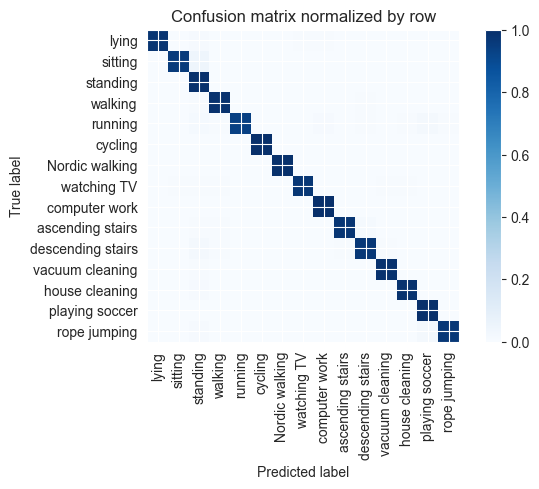

Overall accuracy: 0.983




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.86batch/s]


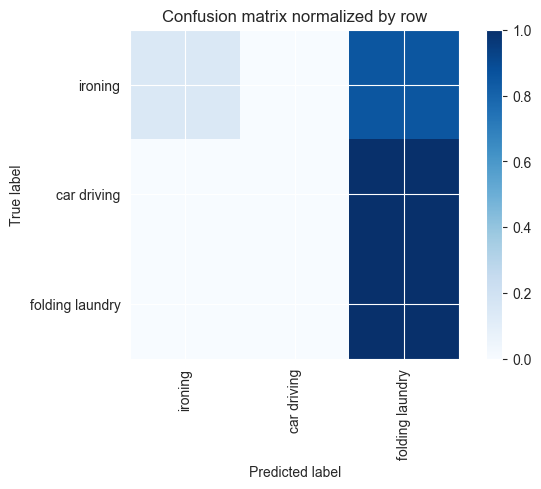

 21%|██        | 4/19 [04:08<15:41, 62.79s/it]

Overall accuracy: 0.342

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.994      0.147      0.257      0.608       2334|	 folding laundry: 0.853,	car driving: 0.000,	
folding laundry       0.277      0.998      0.434      0.253        970|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.674      0.342      0.266        1.0       3840|	      

{'accuracy': 0.3416666666666667, 'precision': 0.42375533945889066, 'recall': 0.3817748684470122, 'f1': 0.23013605806094972}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.82batch/s]


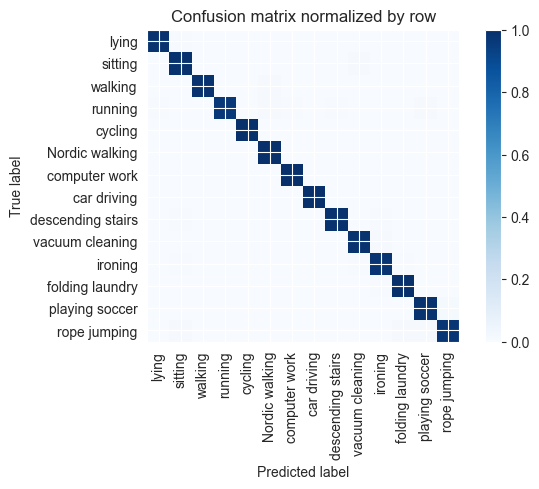

Overall accuracy: 0.989




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.91batch/s]


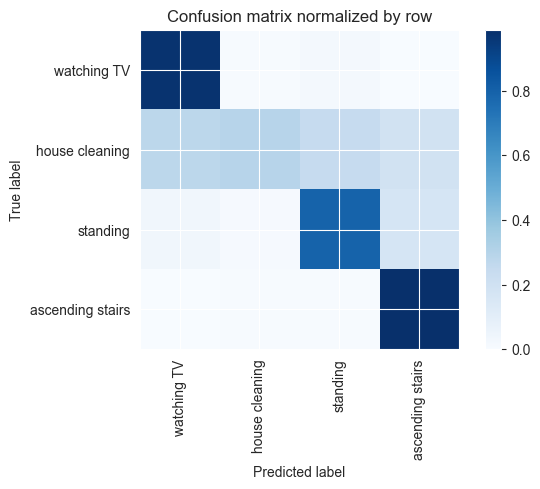

Overall accuracy: 0.692

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.757      0.792      0.774      0.330       1840|	 ascending stairs: 0.167,	watching TV: 0.033,	
  house cleaning       0.953      0.291      0.446      0.329       1830|	 watching TV: 0.274,	standing: 0.244,	
ascending stairs       0.616      0.988      0.759      0.193       1073|	 house cleaning: 0.007,	standing: 0.006,	
     watching TV       0.588      0.973      0.733      0.148        825|	 standing: 0.019,	house cleaning: 0.005,	

----------------------------------------------------------------------------------------------------
     avg / total       0.769      0.692      0.657        1.0       5568|	      

{'accuracy': 0.6918103448275862, 'precision': 0.7287113982125235, 'recall': 0.7609439945235623, 'f1': 0.6779764285457311}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.87batch/s]


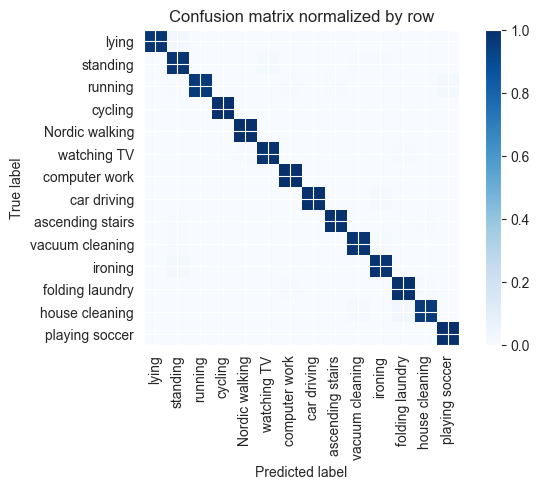

Overall accuracy: 0.985




unseen: 100%|██████████| 86/86 [00:05<00:00, 16.00batch/s]


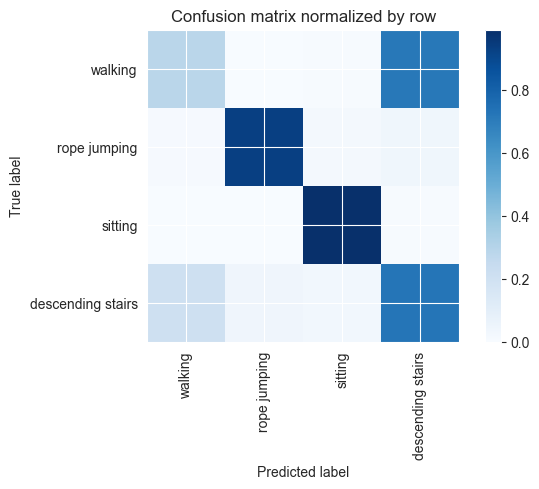

Overall accuracy: 0.642

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.765      0.285      0.415      0.421       2319|	 descending stairs: 0.712,	sitting: 0.004,	
          sitting       0.975      0.990      0.982      0.324       1785|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.290      0.725      0.414      0.172        945|	 walking: 0.203,	rope jumping: 0.042,	
     rope jumping       0.914      0.932      0.923      0.083        455|	 descending stairs: 0.037,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.764      0.642      0.641        1.0       5504|	      

{'accuracy': 0.6424418604651163, 'precision': 0.7357394874403247, 'recall': 0.7328143141247168, 'f1': 0.6834525631300475}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 60/60 [00:03<00:00, 15.87batch/s]


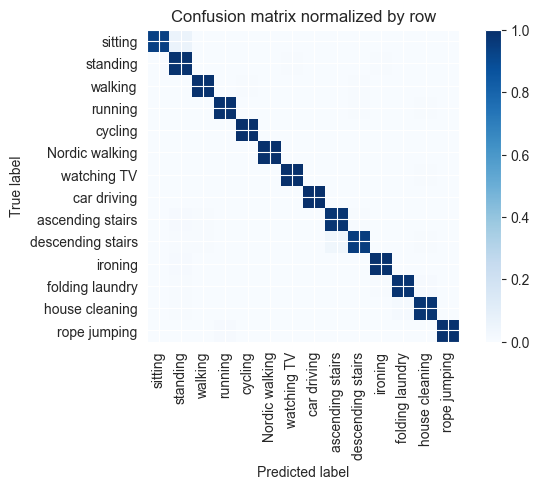

Overall accuracy: 0.982




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.66batch/s]


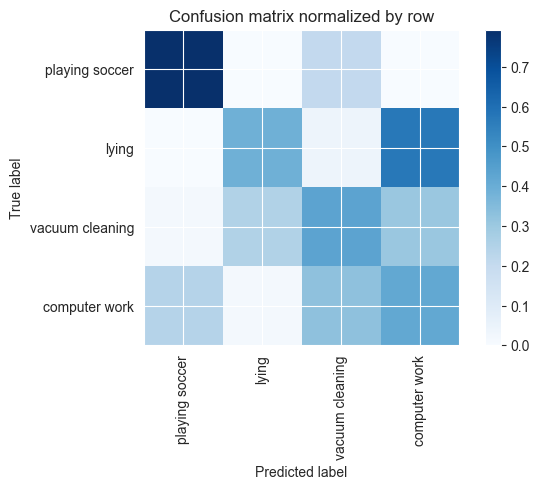

Overall accuracy: 0.438

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.446      0.417      0.431      0.432       3071|	 vacuum cleaning: 0.327,	playing soccer: 0.240,	
          lying       0.605      0.388      0.473      0.263       1869|	 computer work: 0.572,	vacuum cleaning: 0.039,	
vacuum cleaning       0.387      0.433      0.409      0.240       1706|	 computer work: 0.305,	lying: 0.249,	
 playing soccer       0.323      0.793      0.459      0.064        458|	 vacuum cleaning: 0.207,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.466      0.438      0.438        1.0       7104|	      

{'accuracy': 0.4375, 'precision': 0.4402016010433234, 'recall': 0.5076973462526935, 'f1': 0.44290438145074046}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walk


seen: 100%|██████████| 69/69 [00:04<00:00, 15.44batch/s]


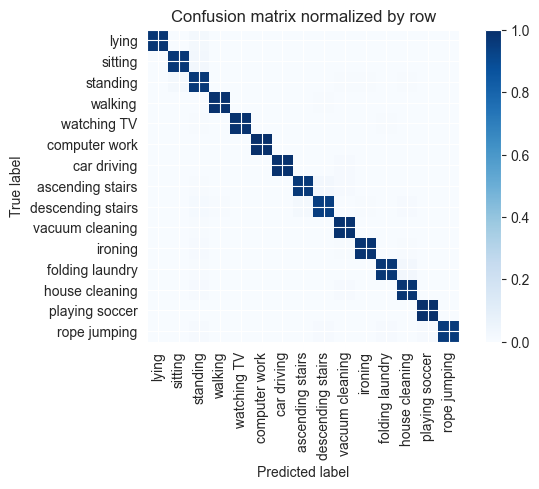

Overall accuracy: 0.979




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.90batch/s]


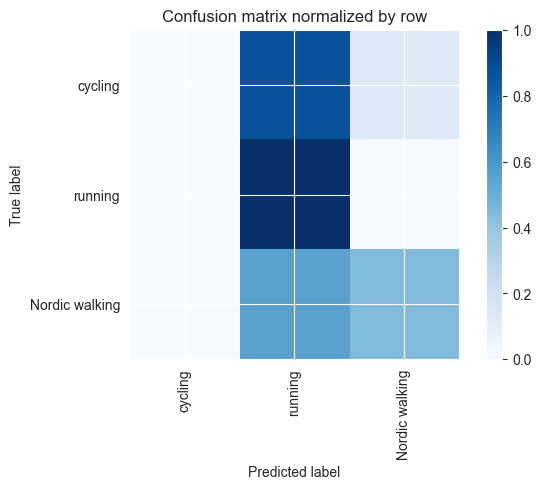

Overall accuracy: 0.402

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.793      0.445      0.570      0.418       1820|	 running: 0.555,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1593|	 running: 0.868,	Nordic walking: 0.132,	
       running       0.282      1.000      0.440      0.216        939|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.393      0.402      0.333        1.0       4352|	      

{'accuracy': 0.40188419117647056, 'precision': 0.35841239700307354, 'recall': 0.4816849816849817, 'f1': 0.33667813309131017}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning'


seen: 100%|██████████| 70/70 [00:04<00:00, 15.46batch/s]


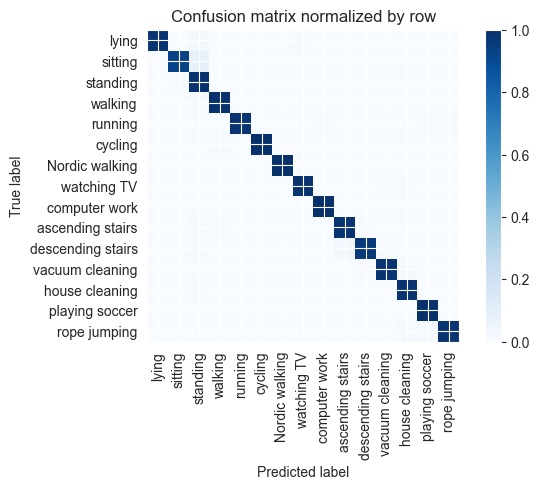

Overall accuracy: 0.982




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.84batch/s]


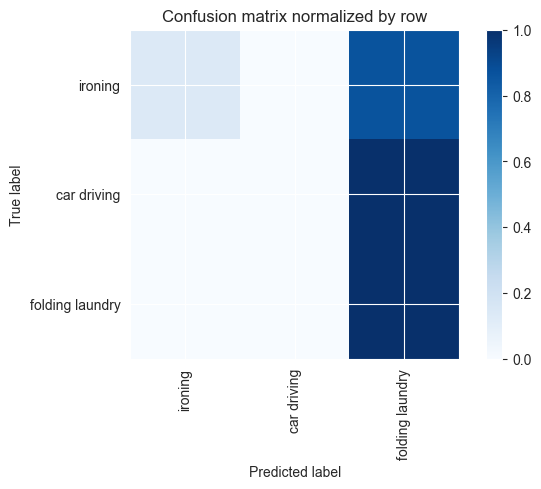

 26%|██▋       | 5/19 [05:12<14:41, 62.95s/it]

Overall accuracy: 0.334

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.994      0.134      0.235      0.607       2329|	 folding laundry: 0.866,	car driving: 0.000,	
folding laundry       0.276      0.998      0.432      0.254        975|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.673      0.334      0.253        1.0       3840|	      

{'accuracy': 0.334375, 'precision': 0.42316068980114757, 'recall': 0.3771608078005673, 'f1': 0.22256001285995863}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.88batch/s]


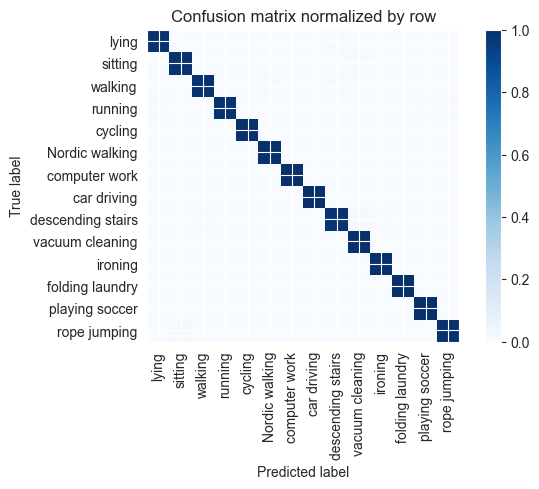

Overall accuracy: 0.993




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.39batch/s]


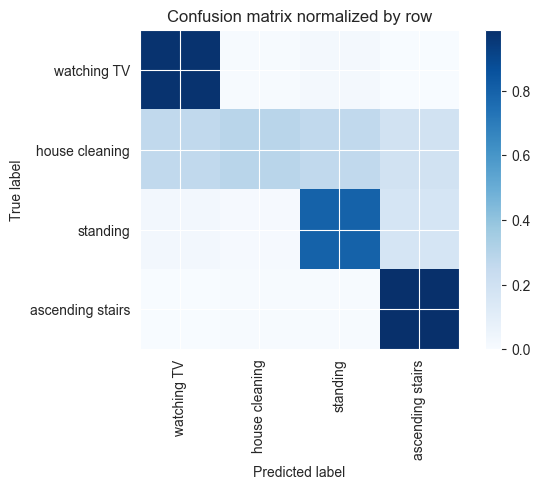

Overall accuracy: 0.693

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.745      0.798      0.771      0.330       1838|	 ascending stairs: 0.168,	watching TV: 0.027,	
  house cleaning       0.953      0.288      0.442      0.329       1832|	 standing: 0.261,	watching TV: 0.260,	
ascending stairs       0.617      0.988      0.759      0.193       1073|	 house cleaning: 0.007,	standing: 0.006,	
     watching TV       0.604      0.973      0.746      0.148        825|	 standing: 0.019,	house cleaning: 0.005,	

----------------------------------------------------------------------------------------------------
     avg / total       0.768      0.693      0.657        1.0       5568|	      

{'accuracy': 0.6925287356321839, 'precision': 0.7297831017125632, 'recall': 0.7616219046330313, 'f1': 0.6793489222064574}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.72batch/s]


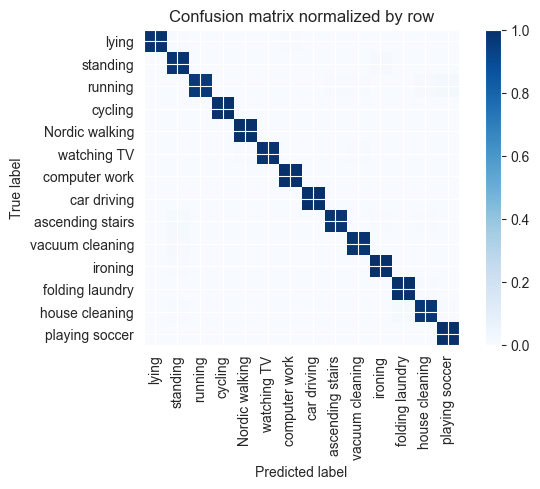

Overall accuracy: 0.988




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.71batch/s]


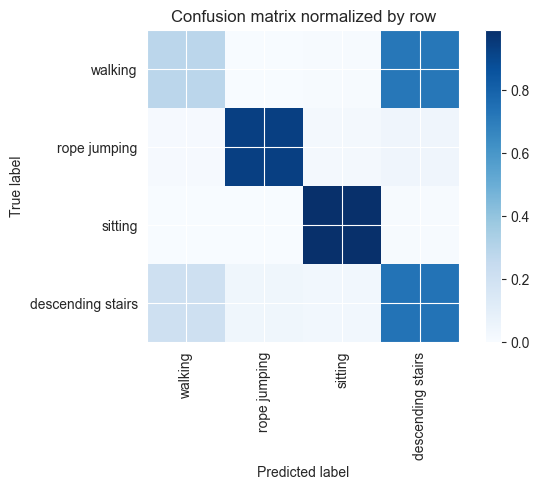

Overall accuracy: 0.641

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.762      0.279      0.409      0.421       2317|	 descending stairs: 0.717,	sitting: 0.004,	
          sitting       0.975      0.989      0.982      0.324       1785|	 descending stairs: 0.007,	walking: 0.003,	
descending stairs       0.289      0.731      0.415      0.171        942|	 walking: 0.203,	rope jumping: 0.037,	
     rope jumping       0.924      0.930      0.927      0.084        460|	 descending stairs: 0.039,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.764      0.641      0.639        1.0       5504|	      

{'accuracy': 0.6413517441860465, 'precision': 0.737751284232345, 'recall': 0.73261335681966, 'f1': 0.6832540536514955}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nor


seen: 100%|██████████| 60/60 [00:03<00:00, 15.77batch/s]


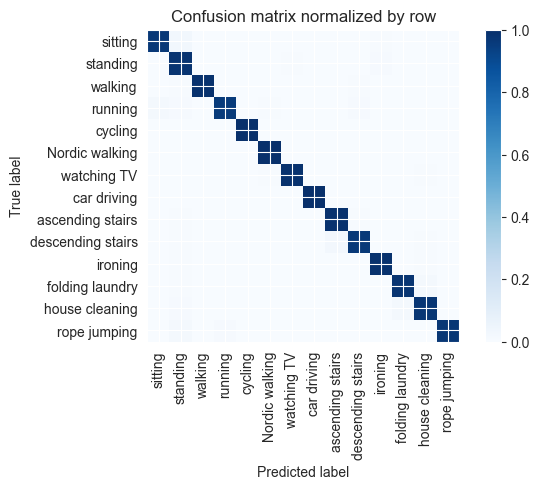

Overall accuracy: 0.984




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.80batch/s]


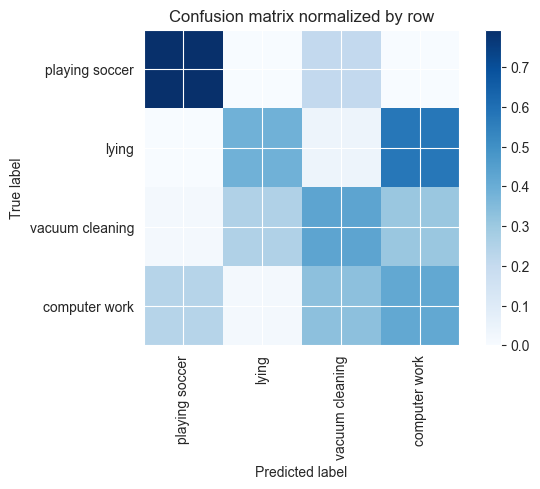

Overall accuracy: 0.436

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.444      0.416      0.430      0.432       3071|	 vacuum cleaning: 0.330,	playing soccer: 0.238,	
          lying       0.602      0.385      0.470      0.264       1875|	 computer work: 0.575,	vacuum cleaning: 0.039,	
vacuum cleaning       0.383      0.430      0.405      0.240       1702|	 computer work: 0.306,	lying: 0.251,	
 playing soccer       0.325      0.794      0.461      0.064        456|	 vacuum cleaning: 0.206,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.464      0.436      0.436        1.0       7104|	      

{'accuracy': 0.43567004504504503, 'precision': 0.4385207941324362, 'recall': 0.5063713224100559, 'f1': 0.4414196909317021}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 


seen: 100%|██████████| 69/69 [00:04<00:00, 15.63batch/s]


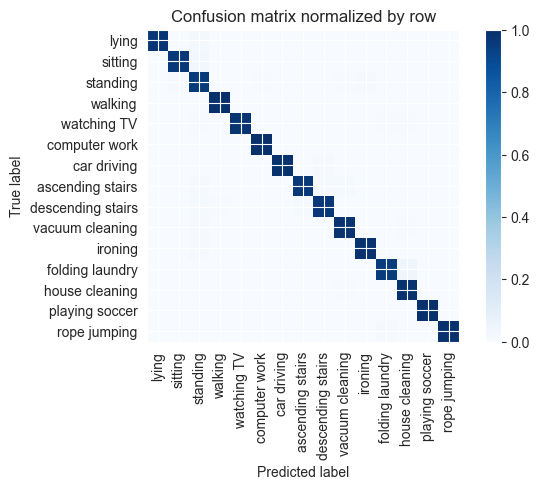

Overall accuracy: 0.981




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.79batch/s]


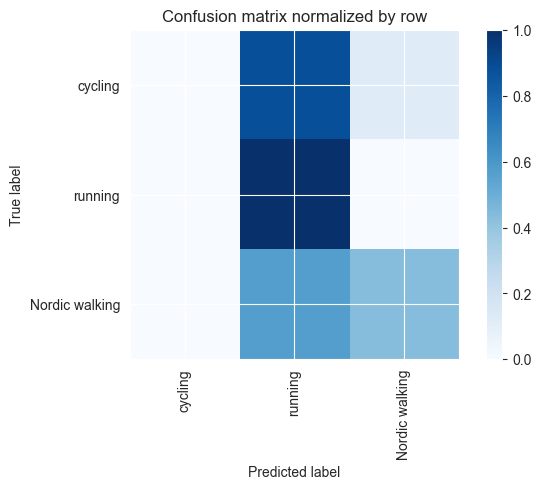

Overall accuracy: 0.398

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.804      0.433      0.563      0.419       1823|	 running: 0.567,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1588|	 running: 0.879,	Nordic walking: 0.121,	
       running       0.279      1.000      0.436      0.216        941|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.397      0.398      0.330        1.0       4352|	      

{'accuracy': 0.3975183823529412, 'precision': 0.3611423332247741, 'recall': 0.4776010239531907, 'f1': 0.3330746252592595}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8


seen: 100%|██████████| 70/70 [00:04<00:00, 15.67batch/s]


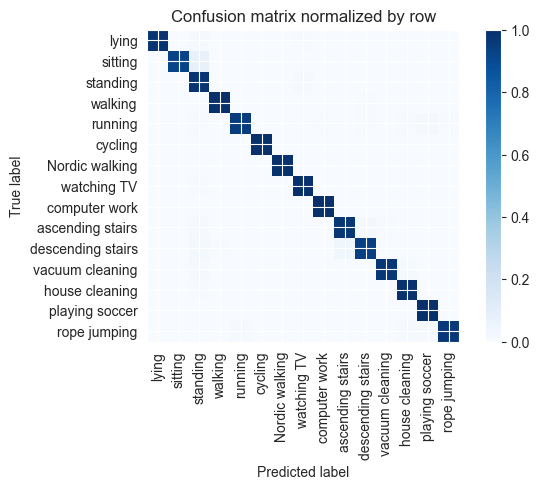

Overall accuracy: 0.980




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.86batch/s]


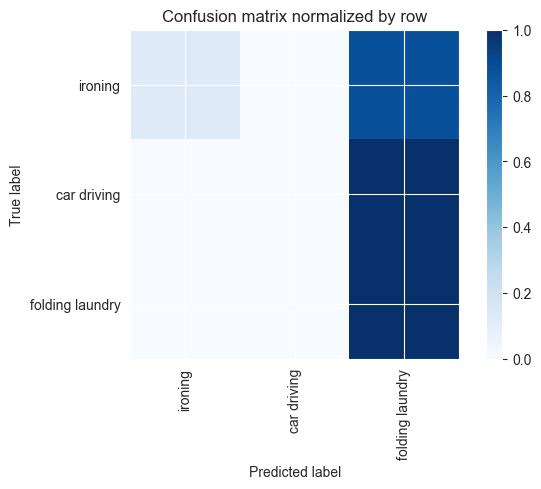

 32%|███▏      | 6/19 [06:15<13:38, 62.95s/it]

Overall accuracy: 0.327

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.993      0.122      0.218      0.606       2328|	 folding laundry: 0.878,	car driving: 0.000,	
folding laundry       0.273      0.998      0.429      0.253        973|	 ironing: 0.002,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        539|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.671      0.327      0.241        1.0       3840|	      

{'accuracy': 0.32708333333333334, 'precision': 0.4221071787333208, 'recall': 0.3734557273179983, 'f1': 0.2156832261838476}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car d


seen: 100%|██████████| 65/65 [00:04<00:00, 15.64batch/s]


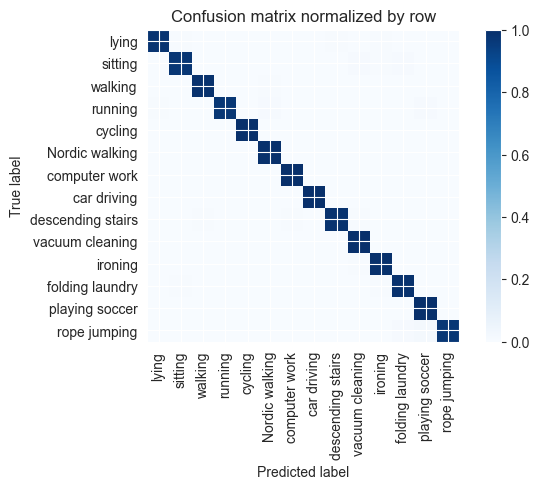

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.58batch/s]


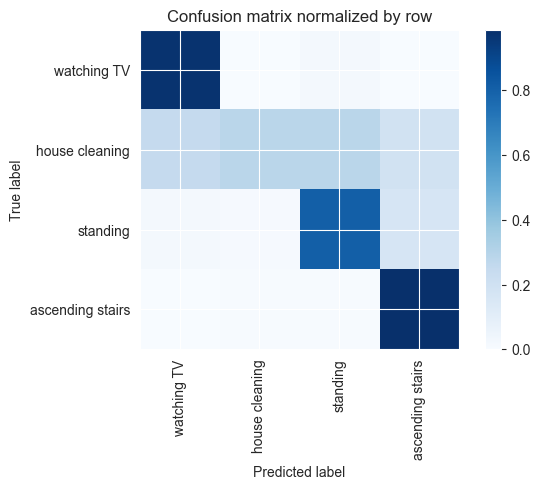

Overall accuracy: 0.695

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.734      0.808      0.769      0.330       1840|	 ascending stairs: 0.162,	watching TV: 0.021,	
  house cleaning       0.950      0.283      0.436      0.328       1826|	 standing: 0.281,	watching TV: 0.248,	
ascending stairs       0.623      0.986      0.764      0.193       1076|	 standing: 0.007,	house cleaning: 0.007,	
     watching TV       0.621      0.973      0.758      0.148        826|	 standing: 0.021,	house cleaning: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.767      0.695      0.657        1.0       5568|	      

{'accuracy': 0.6948635057471264, 'precision': 0.7320484525180522, 'recall': 0.7626774502552107, 'f1': 0.6818186157260436}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.59batch/s]


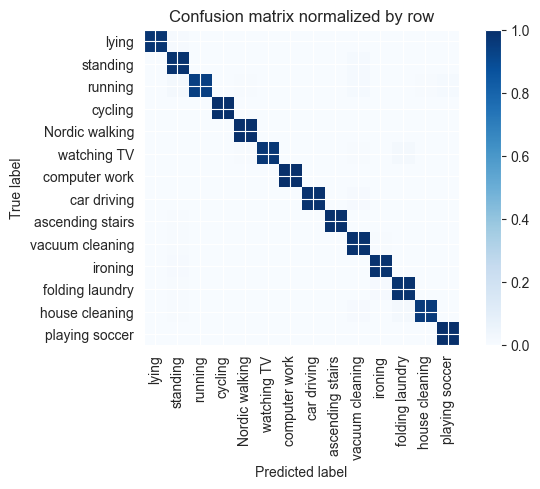

Overall accuracy: 0.985




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.64batch/s]


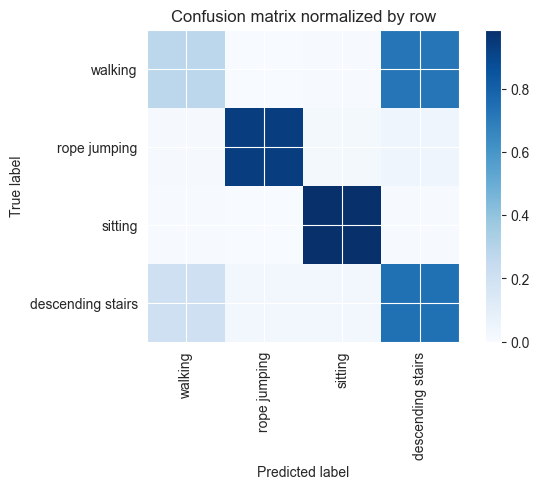

Overall accuracy: 0.642

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.756      0.276      0.404      0.421       2315|	 descending stairs: 0.721,	sitting: 0.004,	
          sitting       0.975      0.988      0.981      0.325       1787|	 descending stairs: 0.007,	walking: 0.006,	
descending stairs       0.292      0.744      0.420      0.172        944|	 walking: 0.202,	sitting: 0.030,	
     rope jumping       0.949      0.930      0.939      0.083        458|	 descending stairs: 0.039,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.763      0.642      0.639        1.0       5504|	      

{'accuracy': 0.6415334302325582, 'precision': 0.742949723746683, 'recall': 0.7342644721662827, 'f1': 0.6860607232030826}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic


seen: 100%|██████████| 60/60 [00:03<00:00, 15.51batch/s]


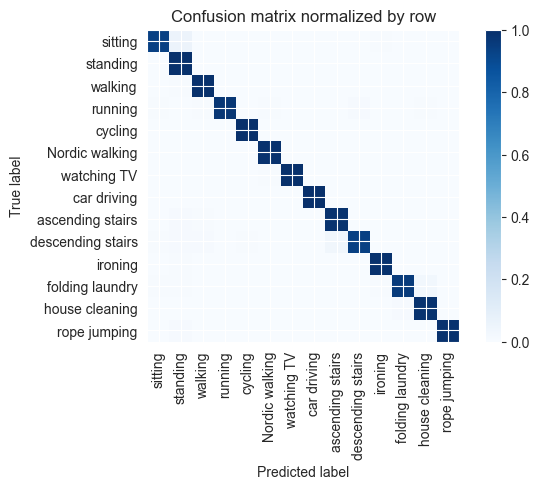

Overall accuracy: 0.982




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.66batch/s]


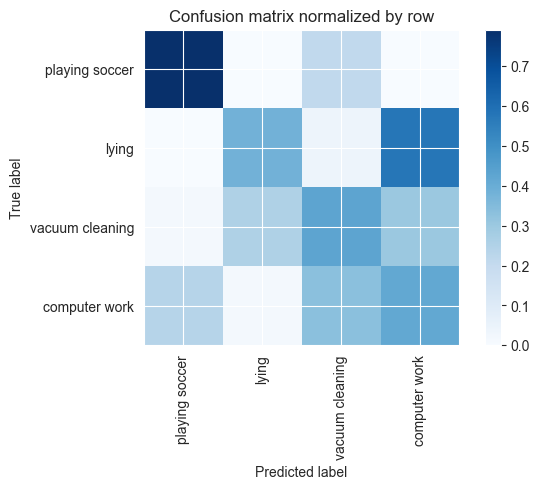

Overall accuracy: 0.435

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.444      0.417      0.430      0.432       3067|	 vacuum cleaning: 0.333,	playing soccer: 0.235,	
          lying       0.597      0.383      0.466      0.264       1874|	 computer work: 0.578,	vacuum cleaning: 0.039,	
vacuum cleaning       0.381      0.429      0.404      0.240       1707|	 computer work: 0.302,	lying: 0.256,	
 playing soccer       0.327      0.792      0.463      0.064        456|	 vacuum cleaning: 0.208,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.462      0.435      0.435        1.0       7104|	      

{'accuracy': 0.4346846846846847, 'precision': 0.4372408969352706, 'recall': 0.5049467638489008, 'f1': 0.44060176502267556}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 


seen: 100%|██████████| 69/69 [00:04<00:00, 15.75batch/s]


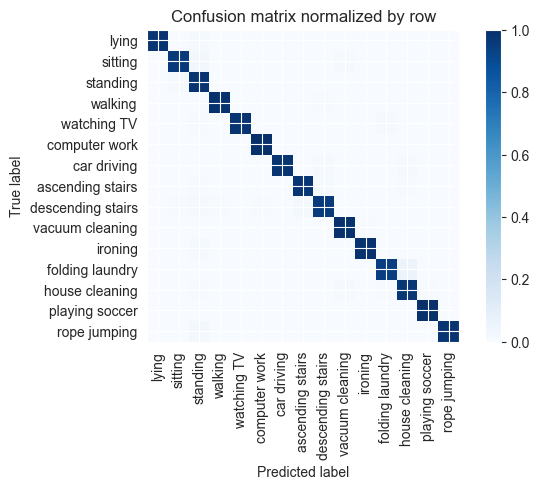

Overall accuracy: 0.980




unseen: 100%|██████████| 68/68 [00:04<00:00, 14.88batch/s]


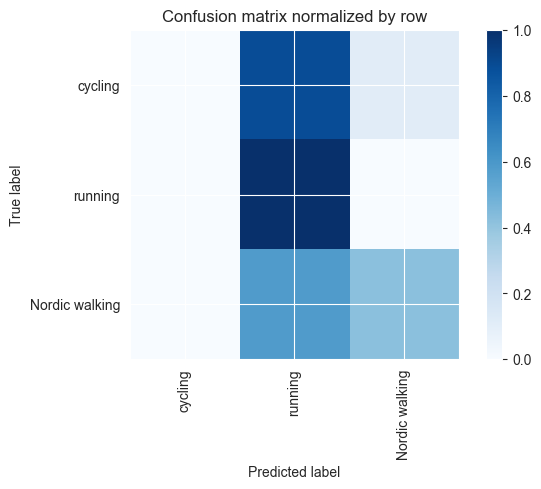

Overall accuracy: 0.391

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.814      0.418      0.552      0.420       1827|	 running: 0.582,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1587|	 running: 0.890,	Nordic walking: 0.110,	
       running       0.275      1.000      0.431      0.216        938|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.401      0.391      0.325        1.0       4352|	      

{'accuracy': 0.39108455882352944, 'precision': 0.36282101647098663, 'recall': 0.4727239554825762, 'f1': 0.3278625065981901}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':


seen: 100%|██████████| 70/70 [00:04<00:00, 15.76batch/s]


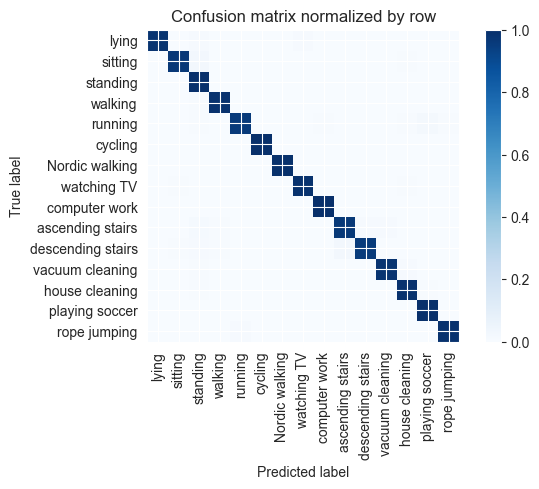

Overall accuracy: 0.986




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.71batch/s]


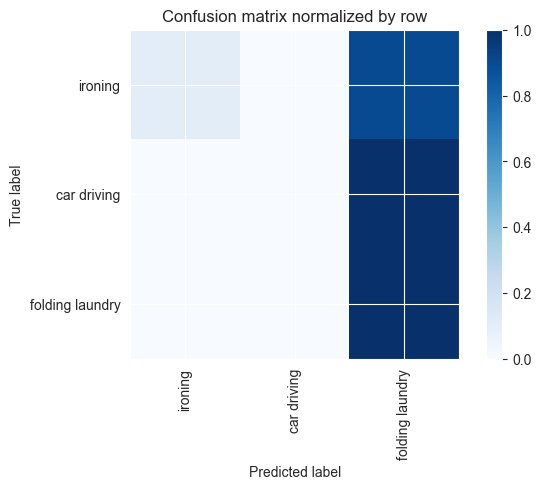

 37%|███▋      | 7/19 [07:18<12:37, 63.09s/it]

Overall accuracy: 0.314

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.996      0.102      0.184      0.607       2332|	 folding laundry: 0.898,	car driving: 0.000,	
folding laundry       0.269      0.999      0.424      0.253        970|	 ironing: 0.001,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.673      0.314      0.219        1.0       3840|	      

{'accuracy': 0.3140625, 'precision': 0.42160517732912156, 'recall': 0.3668661915792824, 'f1': 0.20277343736702172}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving':


seen: 100%|██████████| 65/65 [00:04<00:00, 15.75batch/s]


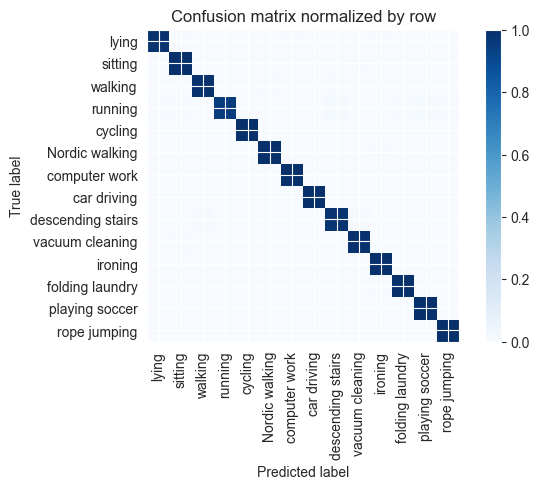

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.58batch/s]


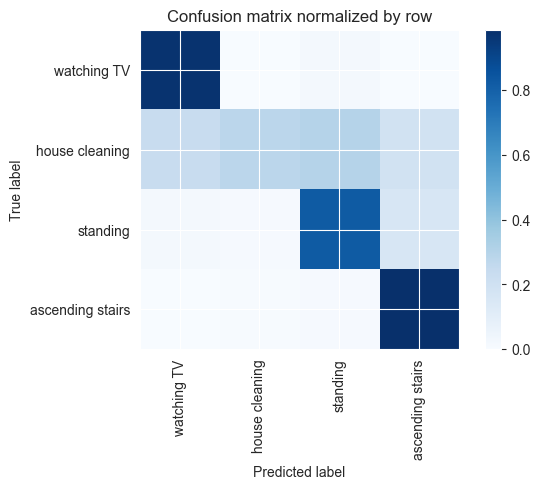

Overall accuracy: 0.696

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.724      0.821      0.769      0.330       1835|	 ascending stairs: 0.154,	watching TV: 0.016,	
  house cleaning       0.951      0.278      0.430      0.329       1834|	 standing: 0.299,	watching TV: 0.238,	
ascending stairs       0.628      0.985      0.767      0.193       1072|	 standing: 0.009,	house cleaning: 0.006,	
     watching TV       0.634      0.973      0.768      0.149        827|	 standing: 0.021,	house cleaning: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.767      0.696      0.657        1.0       5568|	      

{'accuracy': 0.6963002873563219, 'precision': 0.7343097099786459, 'recall': 0.7643153987796165, 'f1': 0.6836146273464326}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.26batch/s]


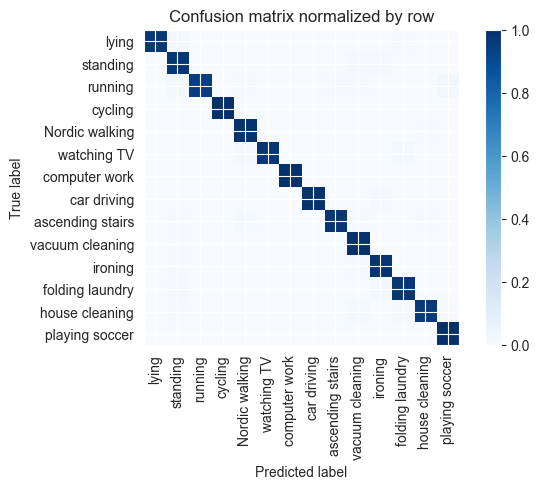

Overall accuracy: 0.982




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.58batch/s]


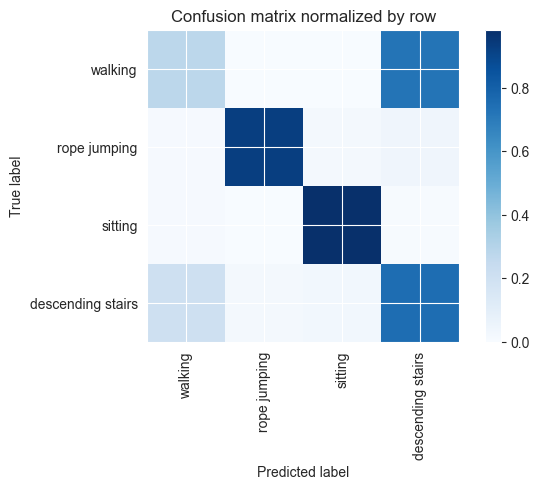

Overall accuracy: 0.640

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.746      0.273      0.400      0.421       2316|	 descending stairs: 0.724,	sitting: 0.003,	
          sitting       0.975      0.983      0.979      0.325       1788|	 walking: 0.010,	descending stairs: 0.007,	
descending stairs       0.293      0.751      0.422      0.171        943|	 walking: 0.204,	sitting: 0.030,	
     rope jumping       0.966      0.928      0.946      0.083        457|	 descending stairs: 0.042,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.761      0.640      0.637        1.0       5504|	      

{'accuracy': 0.6398982558139535, 'precision': 0.7450509155654902, 'recall': 0.7336727570379569, 'f1': 0.6867108021855791}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:04<00:00, 14.92batch/s]


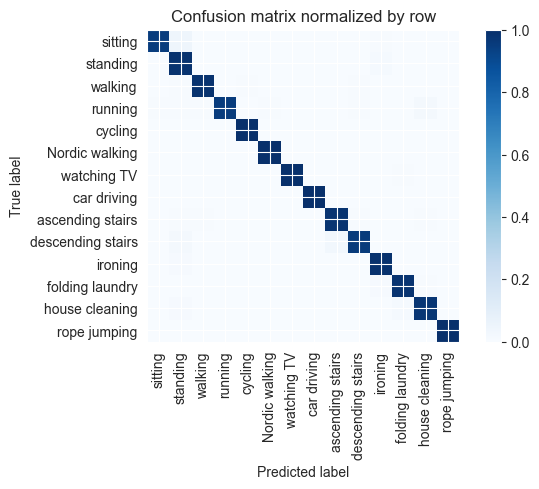

Overall accuracy: 0.983




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.54batch/s]


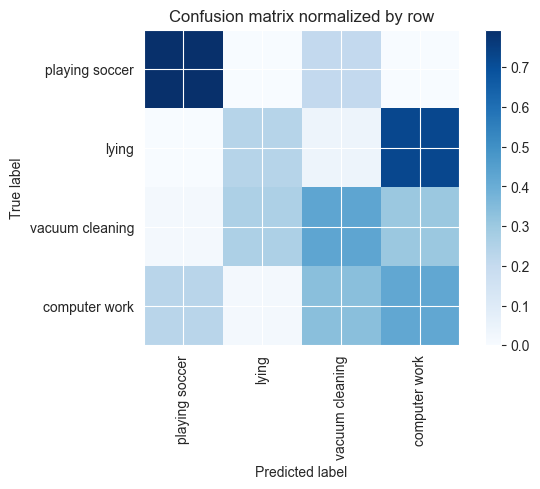

Overall accuracy: 0.398

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.408      0.420      0.414      0.432       3070|	 vacuum cleaning: 0.336,	playing soccer: 0.231,	
          lying       0.481      0.238      0.318      0.264       1873|	 computer work: 0.722,	vacuum cleaning: 0.040,	
vacuum cleaning       0.377      0.427      0.400      0.240       1704|	 computer work: 0.301,	lying: 0.259,	
 playing soccer       0.332      0.794      0.468      0.064        457|	 vacuum cleaning: 0.206,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.415      0.398      0.389        1.0       7104|	      

{'accuracy': 0.3975225225225225, 'precision': 0.39942120695212, 'recall': 0.4696546376424491, 'f1': 0.40012996294479497}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'N


seen: 100%|██████████| 69/69 [00:04<00:00, 15.56batch/s]


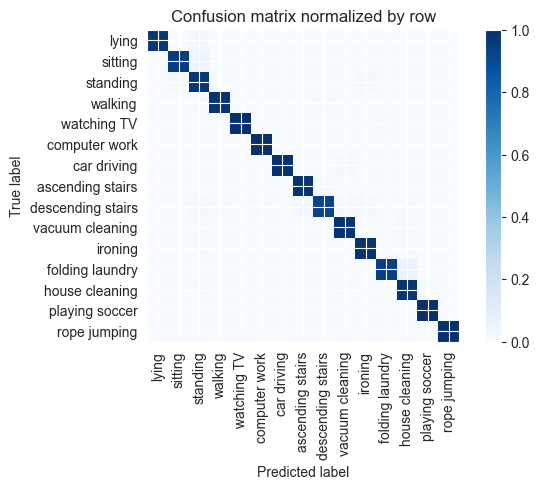

Overall accuracy: 0.978




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.69batch/s]


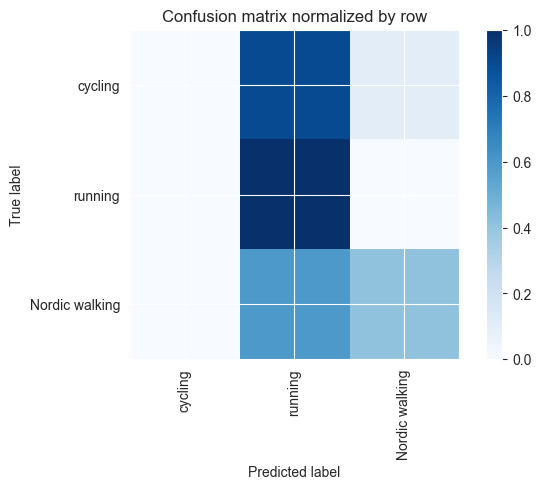

Overall accuracy: 0.386

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.821      0.407      0.544      0.419       1824|	 running: 0.593,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1591|	 running: 0.898,	Nordic walking: 0.102,	
       running       0.272      1.000      0.427      0.215        937|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.403      0.386      0.320        1.0       4352|	      

{'accuracy': 0.3857996323529412, 'precision': 0.36418273343873414, 'recall': 0.4689327485380117, 'f1': 0.3237847634397456}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 


seen: 100%|██████████| 70/70 [00:04<00:00, 15.50batch/s]


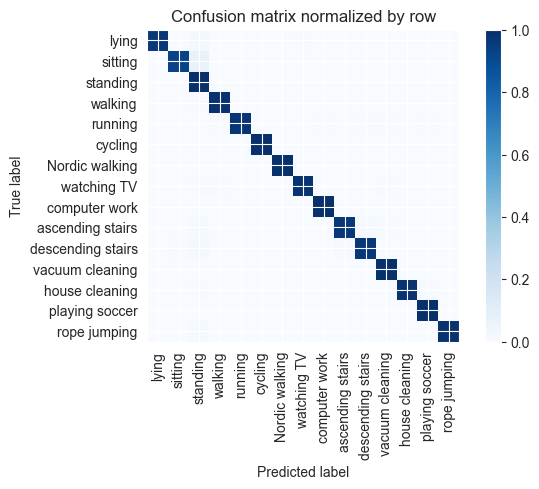

Overall accuracy: 0.983




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.46batch/s]


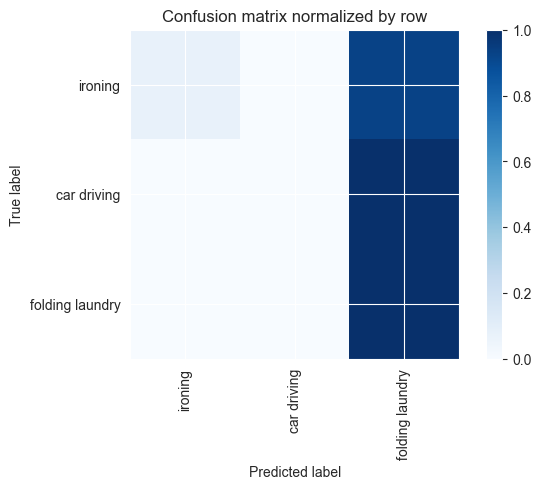

 42%|████▏     | 8/19 [08:22<11:36, 63.31s/it]

Overall accuracy: 0.297

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.994      0.073      0.136      0.607       2329|	 folding laundry: 0.927,	car driving: 0.000,	
folding laundry       0.265      0.999      0.419      0.253        973|	 ironing: 0.001,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.670      0.297      0.189        1.0       3840|	      

{'accuracy': 0.29739583333333336, 'precision': 0.41969145631408394, 'recall': 0.35732165050024634, 'f1': 0.18492833548757717}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'ca


seen: 100%|██████████| 65/65 [00:04<00:00, 15.41batch/s]


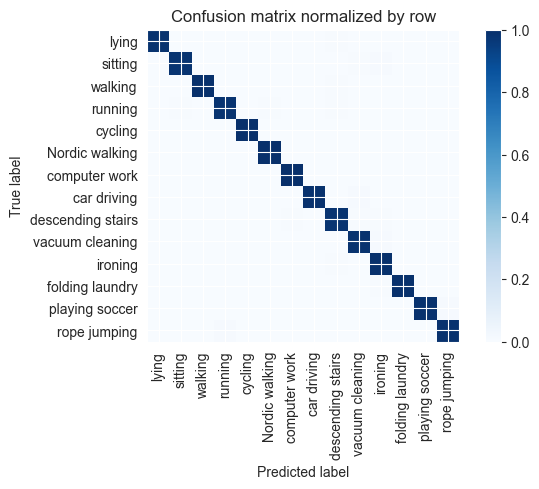

Overall accuracy: 0.992




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.62batch/s]


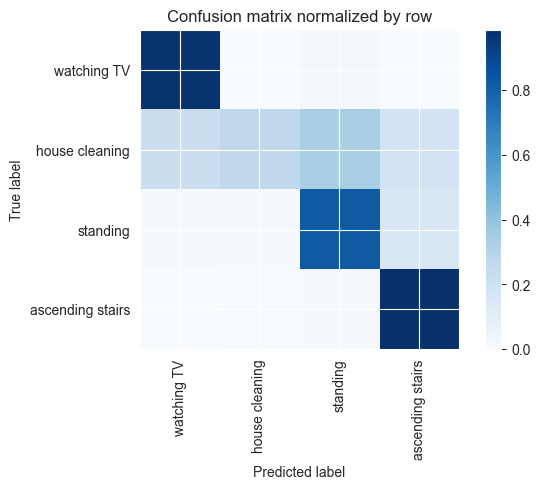

Overall accuracy: 0.695

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.706      0.827      0.762      0.331       1841|	 ascending stairs: 0.150,	watching TV: 0.014,	
  house cleaning       0.951      0.268      0.418      0.328       1828|	 standing: 0.332,	watching TV: 0.221,	
ascending stairs       0.635      0.985      0.772      0.192       1071|	 standing: 0.009,	house cleaning: 0.006,	
     watching TV       0.652      0.973      0.781      0.149        828|	 standing: 0.022,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.765      0.695      0.654        1.0       5568|	      

{'accuracy': 0.6954022988505747, 'precision': 0.7360449311130244, 'recall': 0.7631801798214177, 'f1': 0.6830540258968157}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 65/65 [00:04<00:00, 15.63batch/s]


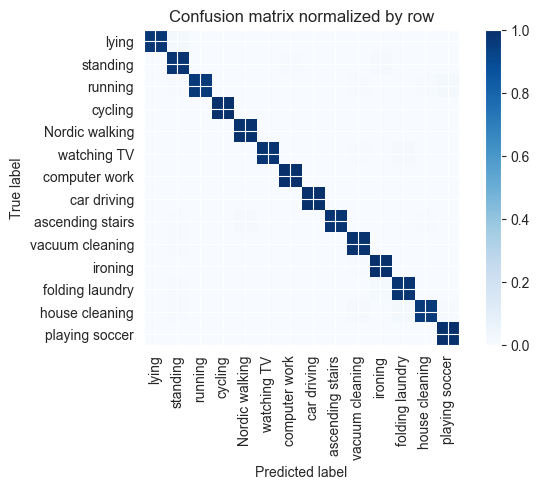

Overall accuracy: 0.986




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.54batch/s]


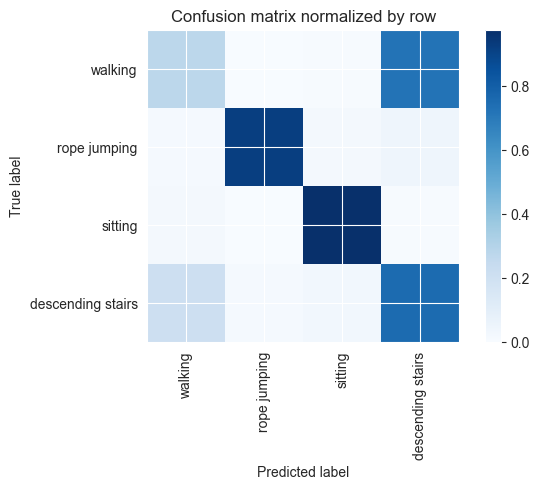

Overall accuracy: 0.638

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.734      0.273      0.398      0.421       2318|	 descending stairs: 0.723,	sitting: 0.004,	
          sitting       0.975      0.976      0.975      0.326       1792|	 walking: 0.017,	descending stairs: 0.007,	
descending stairs       0.291      0.753      0.420      0.170        934|	 walking: 0.207,	sitting: 0.029,	
     rope jumping       0.975      0.922      0.947      0.084        460|	 descending stairs: 0.046,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.758      0.638      0.636        1.0       5504|	      

{'accuracy': 0.6375363372093024, 'precision': 0.7438265903537401, 'recall': 0.7308751239592451, 'f1': 0.6852842613179838}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:03<00:00, 15.60batch/s]


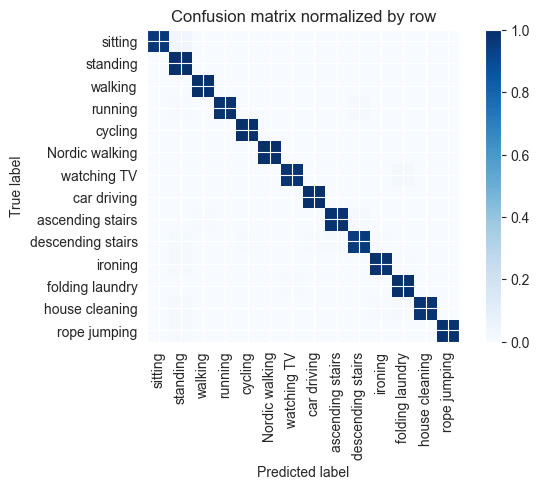

Overall accuracy: 0.986




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.30batch/s]


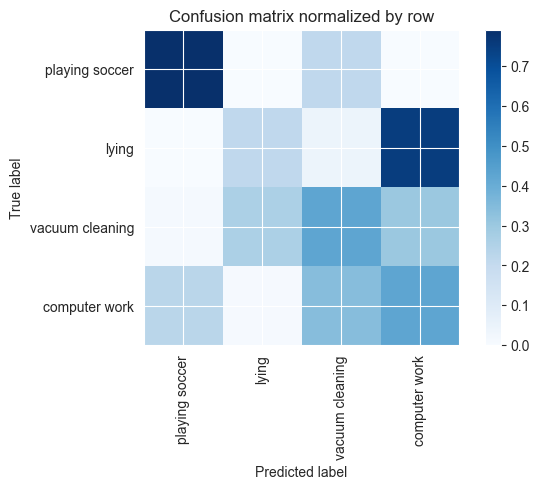

Overall accuracy: 0.391

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.404      0.423      0.413      0.432       3068|	 vacuum cleaning: 0.341,	playing soccer: 0.228,	
          lying       0.458      0.212      0.290      0.264       1873|	 computer work: 0.747,	vacuum cleaning: 0.041,	
vacuum cleaning       0.373      0.424      0.397      0.240       1706|	 computer work: 0.302,	lying: 0.261,	
 playing soccer       0.334      0.790      0.469      0.064        457|	 vacuum cleaning: 0.210,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.406      0.391      0.380        1.0       7104|	      

{'accuracy': 0.39132882882882886, 'precision': 0.3920678653869703, 'recall': 0.46233880653820053, 'f1': 0.392278416851861}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 


seen: 100%|██████████| 69/69 [00:04<00:00, 15.44batch/s]


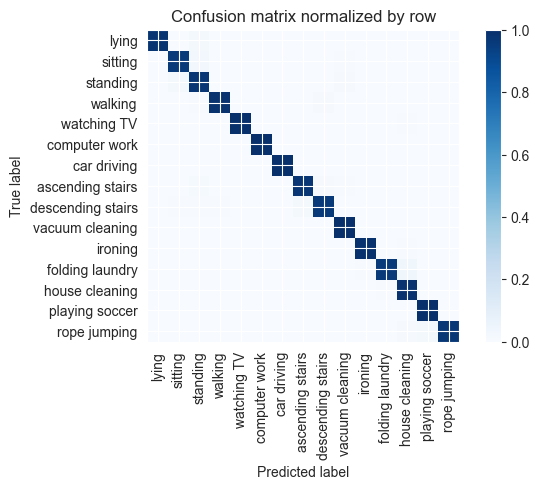

Overall accuracy: 0.983




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.64batch/s]


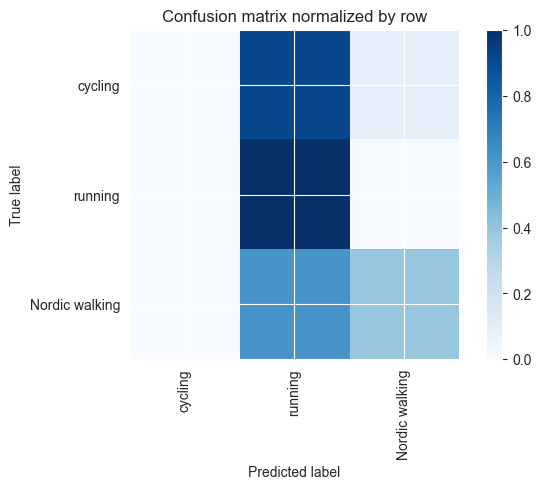

Overall accuracy: 0.381

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.829      0.393      0.533      0.418       1819|	 running: 0.607,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1591|	 running: 0.908,	Nordic walking: 0.092,	
       running       0.270      1.000      0.425      0.216        942|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.405      0.381      0.315        1.0       4352|	      

{'accuracy': 0.38074448529411764, 'precision': 0.3664601324743993, 'recall': 0.4643577056991021, 'f1': 0.3194911062425743}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 


seen: 100%|██████████| 70/70 [00:04<00:00, 15.34batch/s]


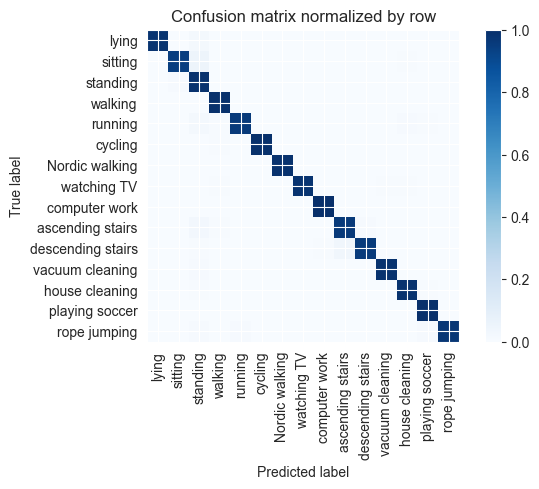

Overall accuracy: 0.982




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.50batch/s]


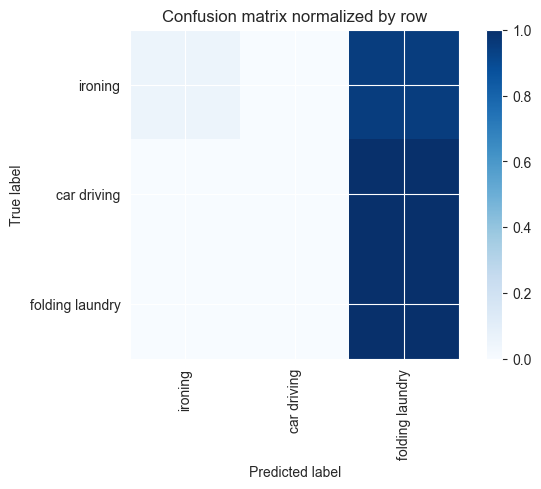

 47%|████▋     | 9/19 [09:26<10:35, 63.51s/it]

Overall accuracy: 0.286

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.054      0.103      0.607       2330|	 folding laundry: 0.946,	car driving: 0.000,	
folding laundry       0.262      1.000      0.416      0.254        974|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.673      0.286      0.168        1.0       3840|	      

{'accuracy': 0.2864583333333333, 'precision': 0.4207503141267277, 'recall': 0.35135908440629465, 'f1': 0.17271162447703012}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.60batch/s]


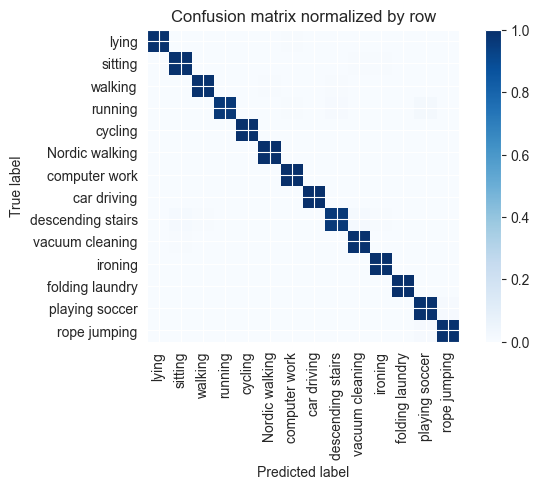

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.43batch/s]


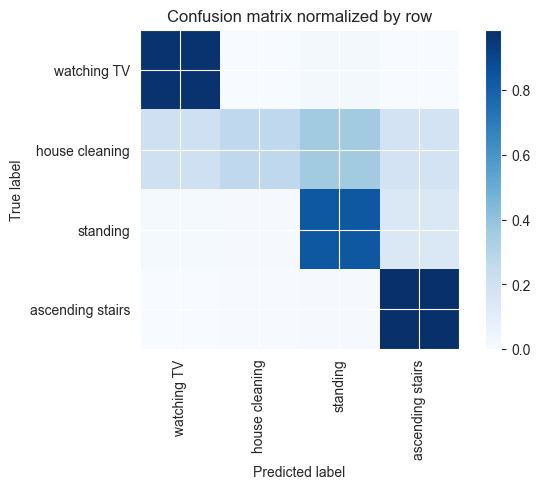

Overall accuracy: 0.697

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.694      0.835      0.758      0.330       1839|	 ascending stairs: 0.144,	watching TV: 0.013,	
  house cleaning       0.951      0.264      0.413      0.328       1828|	 standing: 0.356,	watching TV: 0.203,	
ascending stairs       0.642      0.985      0.777      0.193       1075|	 standing: 0.009,	house cleaning: 0.006,	
     watching TV       0.671      0.973      0.794      0.148        826|	 standing: 0.022,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.765      0.697      0.654 0.9999999999999999       5568|	      

{'accuracy': 0.6968390804597702, 'precision': 0.7393139016316397, 'recall': 0.7642127032770679, 'f1': 0.6855531545661472}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7


seen: 100%|██████████| 65/65 [00:04<00:00, 15.42batch/s]


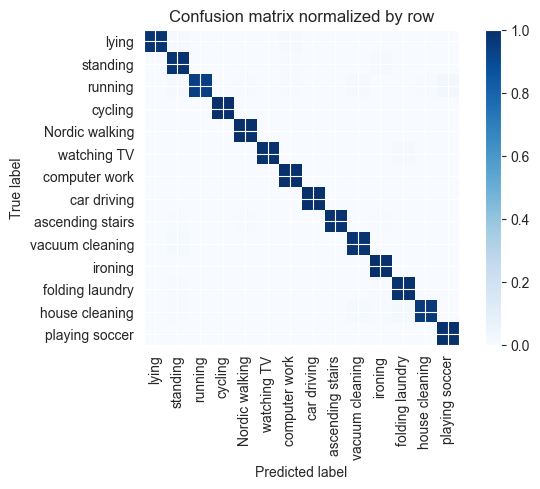

Overall accuracy: 0.986




unseen: 100%|██████████| 86/86 [00:05<00:00, 14.51batch/s]


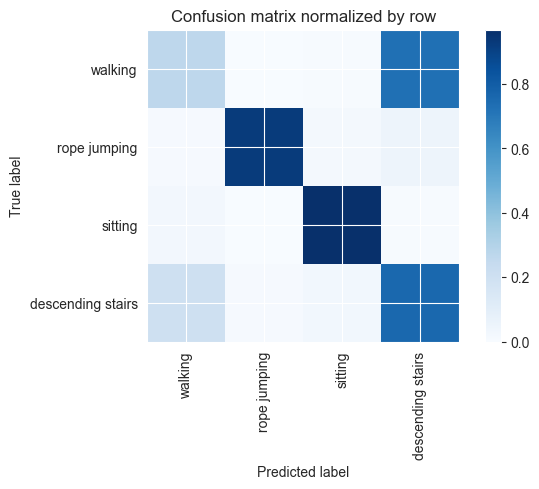

Overall accuracy: 0.634

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.721      0.267      0.390      0.421       2316|	 descending stairs: 0.729,	sitting: 0.004,	
          sitting       0.975      0.969      0.972      0.324       1785|	 walking: 0.024,	descending stairs: 0.007,	
descending stairs       0.294      0.759      0.424      0.171        943|	 walking: 0.204,	sitting: 0.029,	
     rope jumping       0.982      0.924      0.952      0.084        460|	 descending stairs: 0.046,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.752      0.634      0.631        1.0       5504|	      

{'accuracy': 0.6339026162790697, 'precision': 0.7426116369711843, 'recall': 0.7297726371907451, 'f1': 0.6842333841268344}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:04<00:00, 14.12batch/s]


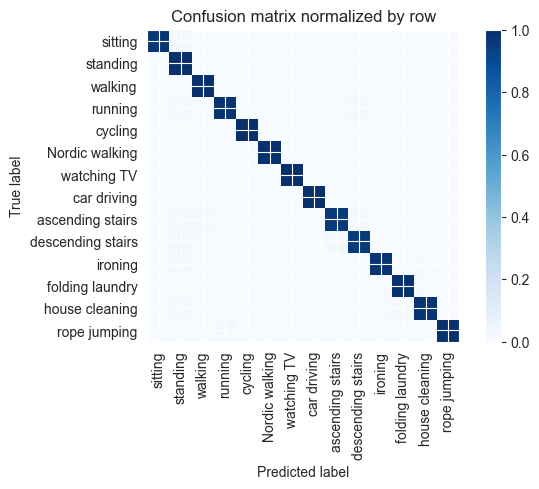

Overall accuracy: 0.985




unseen: 100%|██████████| 111/111 [00:07<00:00, 14.41batch/s]


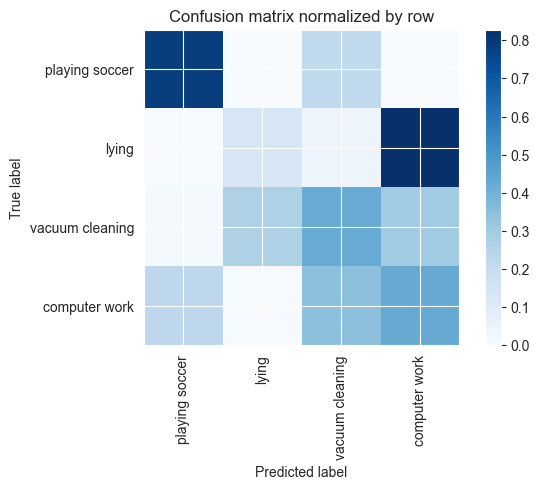

Overall accuracy: 0.370

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.387      0.425      0.405      0.432       3069|	 vacuum cleaning: 0.344,	playing soccer: 0.227,	
          lying       0.348      0.132      0.192      0.264       1877|	 computer work: 0.827,	vacuum cleaning: 0.040,	
vacuum cleaning       0.368      0.421      0.393      0.240       1703|	 computer work: 0.302,	lying: 0.265,	
 playing soccer       0.332      0.782      0.466      0.064        455|	 vacuum cleaning: 0.218,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.369      0.370      0.350        1.0       7104|	      

{'accuracy': 0.3696509009009009, 'precision': 0.35884104965010677, 'recall': 0.4401962456709346, 'f1': 0.36391041012942504}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7,


seen: 100%|██████████| 69/69 [00:05<00:00, 13.80batch/s]


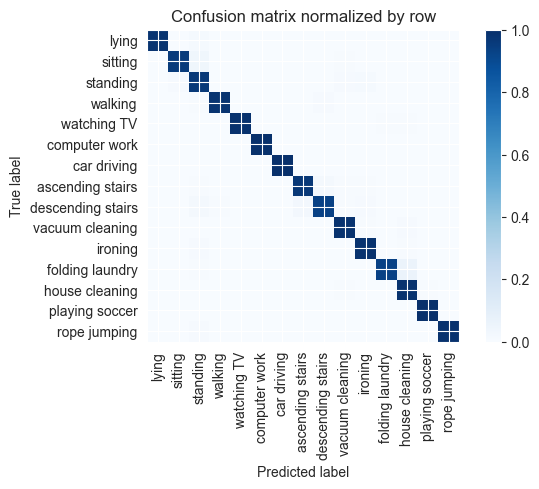

Overall accuracy: 0.978




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.24batch/s]


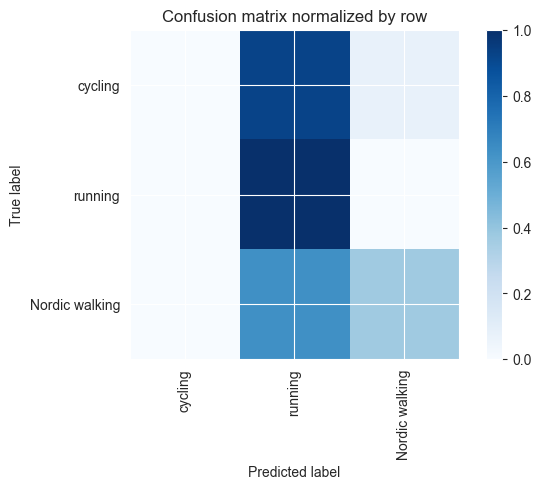

Overall accuracy: 0.370

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.844      0.368      0.513      0.419       1824|	 running: 0.632,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1589|	 running: 0.922,	Nordic walking: 0.078,	
       running       0.264      1.000      0.418      0.216        939|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.411      0.370      0.305        1.0       4352|	      

{'accuracy': 0.3701746323529412, 'precision': 0.3694272826449458, 'recall': 0.456140350877193, 'f1': 0.3102582173577088}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8,


seen: 100%|██████████| 70/70 [00:04<00:00, 14.94batch/s]


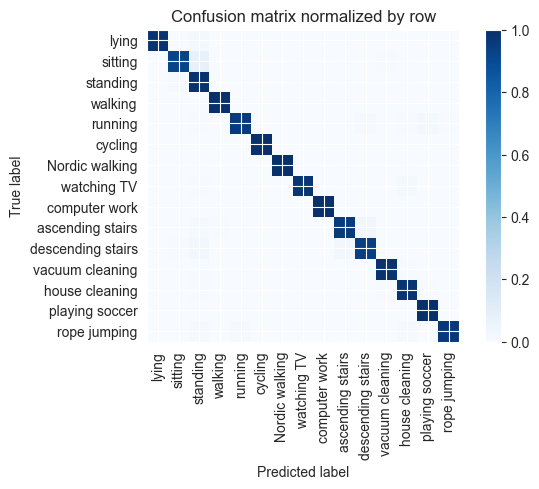

Overall accuracy: 0.978




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.20batch/s]


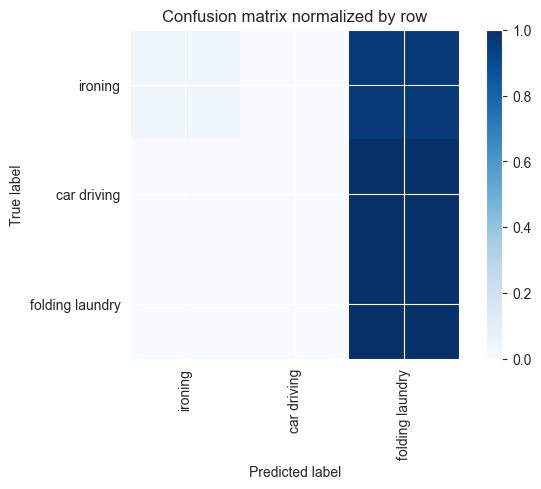

 53%|█████▎    | 10/19 [10:32<09:39, 64.40s/it]

Overall accuracy: 0.274

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.036      0.069      0.608       2333|	 folding laundry: 0.964,	car driving: 0.000,	
folding laundry       0.258      1.000      0.410      0.253        970|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.673      0.274      0.145        1.0       3840|	      

{'accuracy': 0.27421875, 'precision': 0.41939490728418066, 'recall': 0.3451921703100443, 'f1': 0.15970563401921514}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving'


seen: 100%|██████████| 65/65 [00:04<00:00, 15.45batch/s]


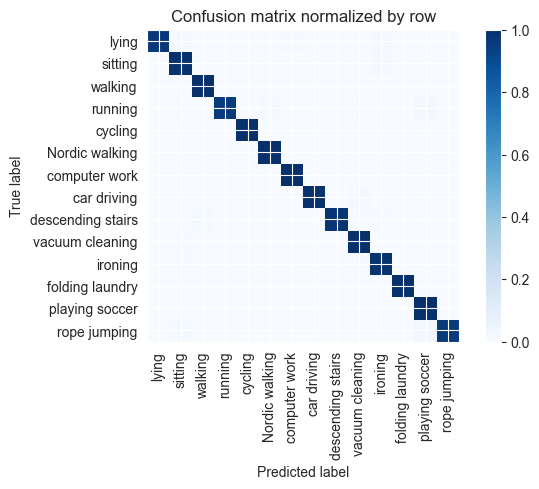

Overall accuracy: 0.988




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.45batch/s]


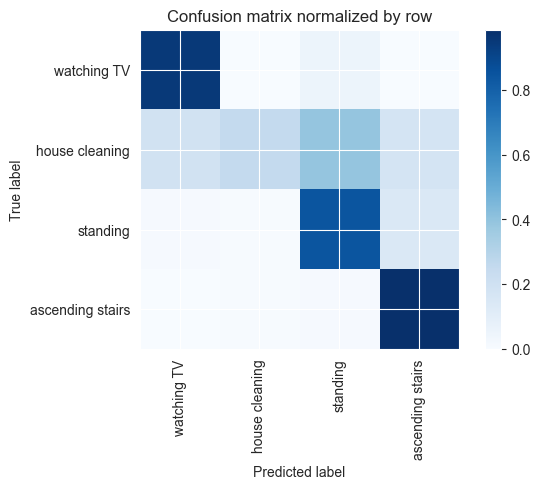

Overall accuracy: 0.690

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.670      0.842      0.746      0.331       1844|	 ascending stairs: 0.139,	watching TV: 0.011,	
  house cleaning       0.956      0.250      0.396      0.328       1828|	 standing: 0.389,	watching TV: 0.186,	
ascending stairs       0.645      0.984      0.779      0.192       1067|	 standing: 0.010,	house cleaning: 0.006,	
     watching TV       0.685      0.946      0.795      0.149        829|	 standing: 0.051,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.761      0.690      0.645        1.0       5568|	      

{'accuracy': 0.6903735632183908, 'precision': 0.7390530303864913, 'recall': 0.7554940251228128, 'f1': 0.6791182744560065}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 65/65 [00:04<00:00, 15.51batch/s]


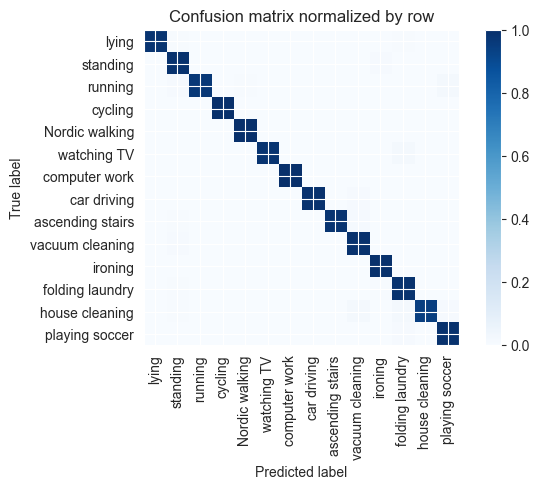

Overall accuracy: 0.986




unseen: 100%|██████████| 86/86 [00:05<00:00, 14.91batch/s]


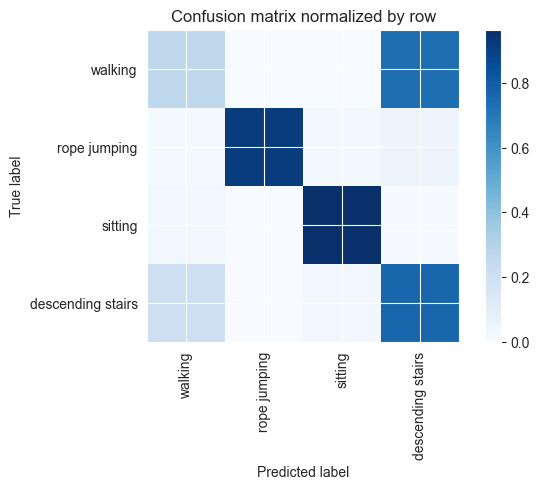

Overall accuracy: 0.631

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.710      0.264      0.385      0.421       2317|	 descending stairs: 0.733,	sitting: 0.003,	
          sitting       0.975      0.965      0.970      0.324       1786|	 walking: 0.028,	descending stairs: 0.007,	
descending stairs       0.294      0.763      0.424      0.172        944|	 walking: 0.206,	sitting: 0.030,	
     rope jumping       0.995      0.919      0.956      0.083        457|	 descending stairs: 0.048,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.748      0.631      0.629 0.9999999999999999       5504|	      

{'accuracy': 0.6311773255813954, 'precision': 0.743241567353373, 'recall': 0.7275444429339442, 'f1': 0.6834162784472965}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7,


seen: 100%|██████████| 60/60 [00:03<00:00, 15.52batch/s]


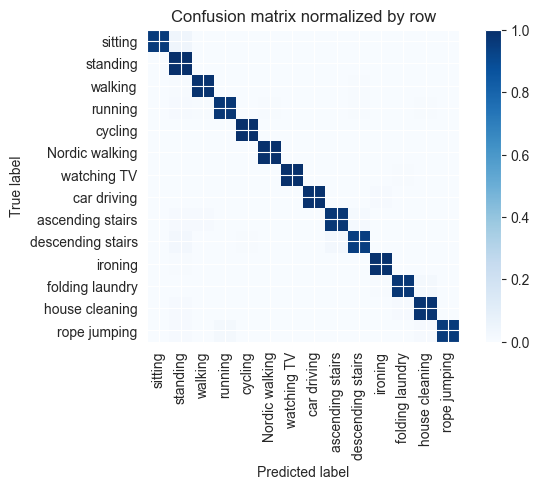

Overall accuracy: 0.981




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.31batch/s]


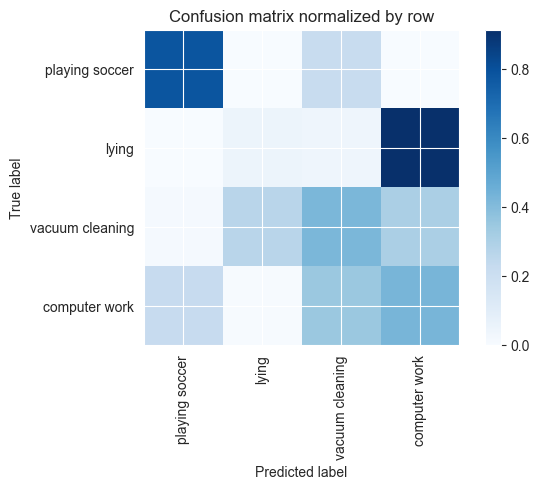

Overall accuracy: 0.347

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.369      0.426      0.396      0.432       3066|	 vacuum cleaning: 0.348,	playing soccer: 0.223,	
          lying       0.159      0.047      0.072      0.264       1878|	 computer work: 0.913,	vacuum cleaning: 0.040,	
vacuum cleaning       0.364      0.418      0.389      0.240       1702|	 computer work: 0.304,	lying: 0.267,	
 playing soccer       0.337      0.782      0.471      0.064        458|	 vacuum cleaning: 0.218,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.310      0.347      0.313        1.0       7104|	      

{'accuracy': 0.3467060810810811, 'precision': 0.30748161143057484, 'recall': 0.418055936269798, 'f1': 0.3321103395560653}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 69/69 [00:04<00:00, 15.51batch/s]


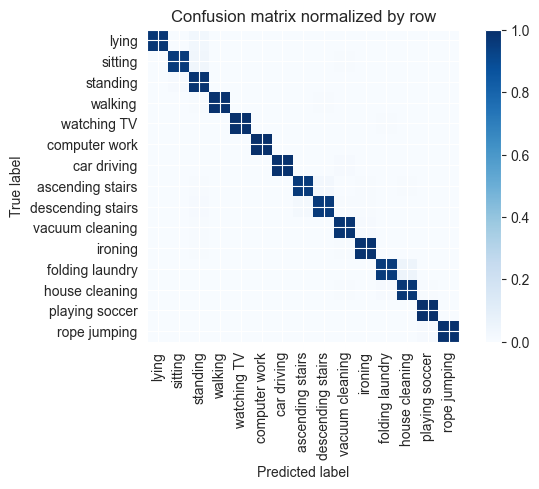

Overall accuracy: 0.979




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.44batch/s]


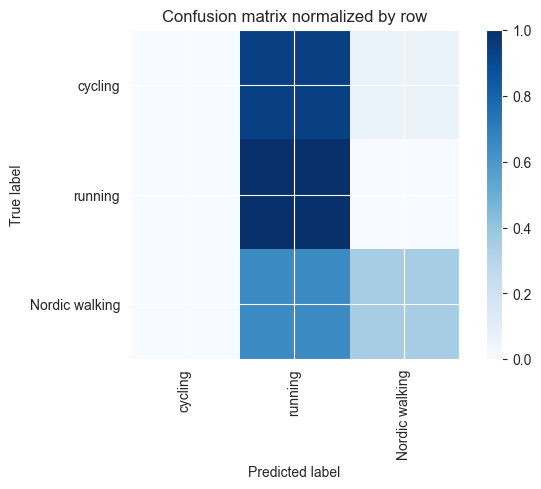

Overall accuracy: 0.361

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.858      0.349      0.496      0.418       1819|	 running: 0.651,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.367       1599|	 running: 0.934,	Nordic walking: 0.066,	
       running       0.259      1.000      0.411      0.215        934|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.414      0.361      0.296        1.0       4352|	      

{'accuracy': 0.36052389705882354, 'precision': 0.3722302036255525, 'recall': 0.4496976360637713, 'f1': 0.30239943435522915}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':


seen: 100%|██████████| 70/70 [00:04<00:00, 15.22batch/s]


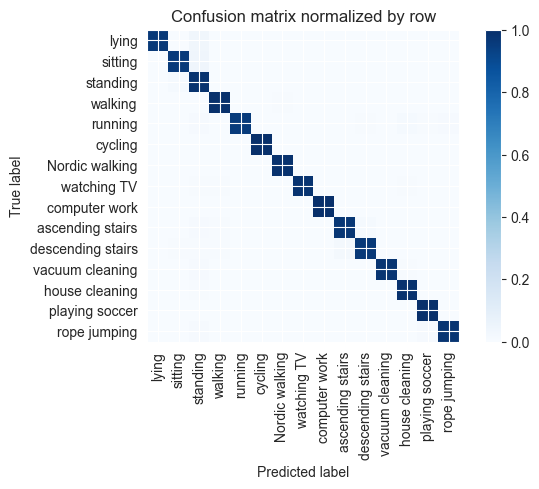

Overall accuracy: 0.982




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.55batch/s]


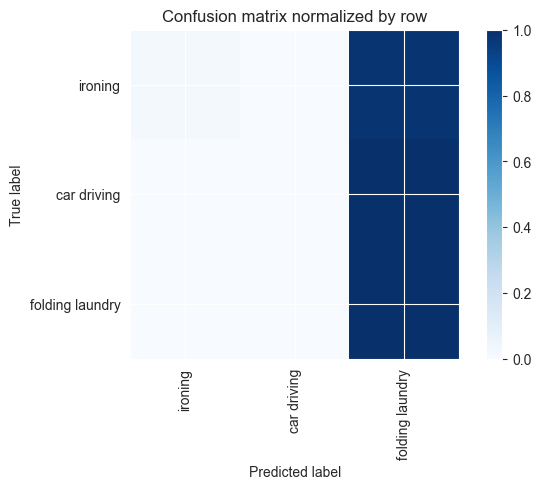

 58%|█████▊    | 11/19 [11:36<08:34, 64.28s/it]

Overall accuracy: 0.265

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.019      0.038      0.607       2331|	 folding laundry: 0.981,	car driving: 0.000,	
folding laundry       0.256      1.000      0.407      0.253        971|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.672      0.265      0.126        1.0       3840|	      

{'accuracy': 0.26458333333333334, 'precision': 0.418620992534036, 'recall': 0.33976833976833976, 'f1': 0.14844945468109547}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 15.32batch/s]


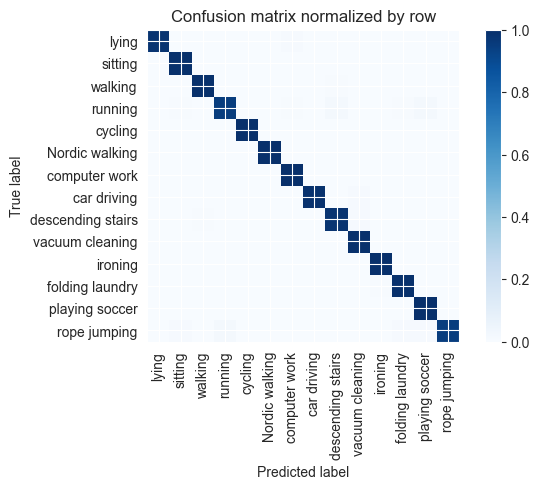

Overall accuracy: 0.992




unseen: 100%|██████████| 87/87 [00:05<00:00, 15.26batch/s]


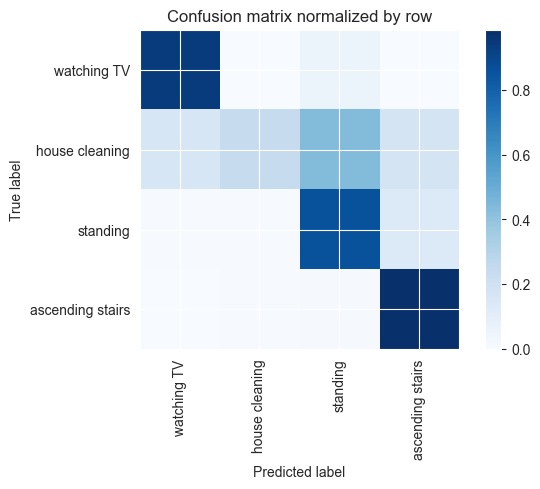

Overall accuracy: 0.689

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.648      0.854      0.737      0.330       1839|	 ascending stairs: 0.132,	watching TV: 0.008,	
  house cleaning       0.963      0.239      0.383      0.329       1834|	 standing: 0.433,	ascending stairs: 0.172,	
ascending stairs       0.653      0.984      0.785      0.192       1070|	 standing: 0.011,	house cleaning: 0.005,	
     watching TV       0.721      0.938      0.816      0.148        825|	 standing: 0.058,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.763      0.689      0.641        1.0       5568|	      

{'accuracy': 0.6891163793103449, 'precision': 0.7461125434682663, 'recall': 0.7539825236732802, 'f1': 0.680159431756996}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'N


seen: 100%|██████████| 65/65 [00:04<00:00, 15.63batch/s]


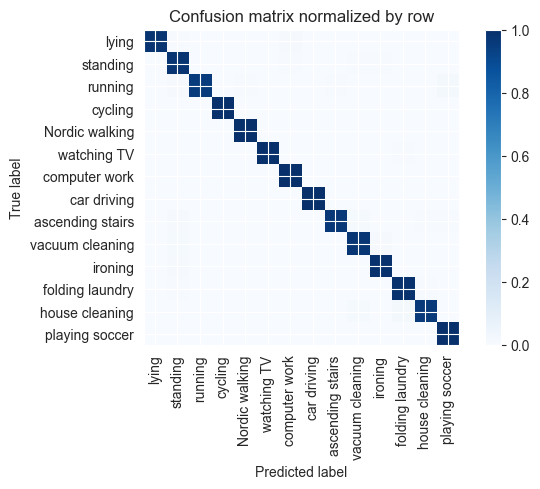

Overall accuracy: 0.985




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.53batch/s]


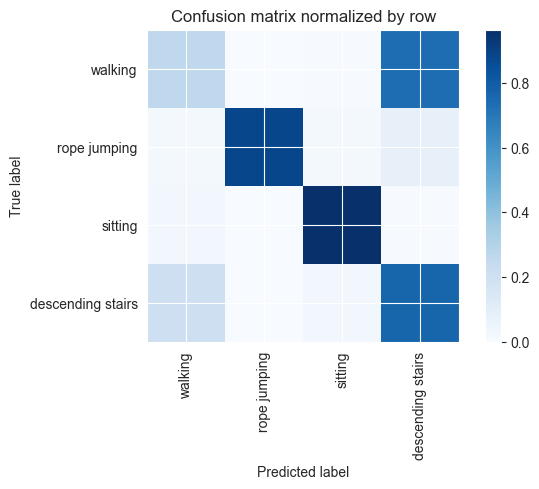

Overall accuracy: 0.627

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.705      0.259      0.379      0.421       2317|	 descending stairs: 0.737,	sitting: 0.004,	
          sitting       0.975      0.965      0.970      0.325       1789|	 walking: 0.027,	descending stairs: 0.007,	
descending stairs       0.291      0.767      0.422      0.171        941|	 walking: 0.205,	sitting: 0.028,	
     rope jumping       1.000      0.882      0.937      0.083        457|	 descending stairs: 0.079,	sitting: 0.020,	

----------------------------------------------------------------------------------------------------
      avg / total       0.746      0.627      0.625        1.0       5504|	      

{'accuracy': 0.6271802325581395, 'precision': 0.7427554620835719, 'recall': 0.7183515626856285, 'f1': 0.6770737892089488}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:03<00:00, 15.44batch/s]


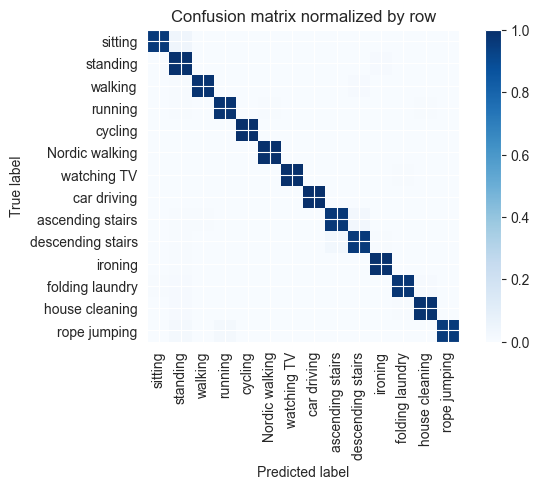

Overall accuracy: 0.983




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.26batch/s]


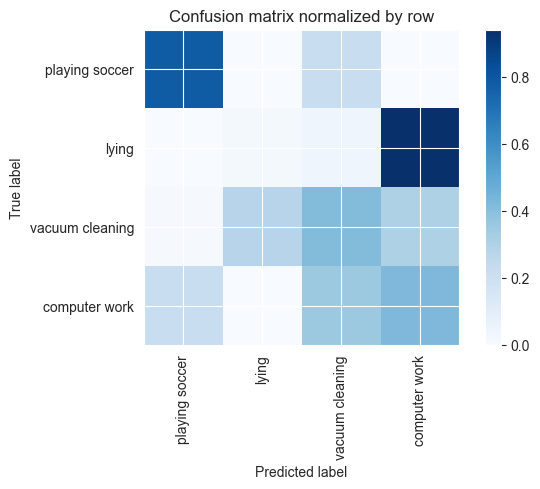

Overall accuracy: 0.338

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.364      0.425      0.392      0.432       3067|	 vacuum cleaning: 0.354,	playing soccer: 0.217,	
          lying       0.075      0.021      0.033      0.264       1878|	 computer work: 0.940,	vacuum cleaning: 0.039,	
vacuum cleaning       0.358      0.412      0.383      0.240       1702|	 computer work: 0.301,	lying: 0.276,	
 playing soccer       0.343      0.781      0.477      0.064        457|	 vacuum cleaning: 0.219,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.285      0.338      0.301        1.0       7104|	      

{'accuracy': 0.33826013513513514, 'precision': 0.28510795800311894, 'recall': 0.40997538879403356, 'f1': 0.32129088989843}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 


seen: 100%|██████████| 69/69 [00:04<00:00, 15.30batch/s]


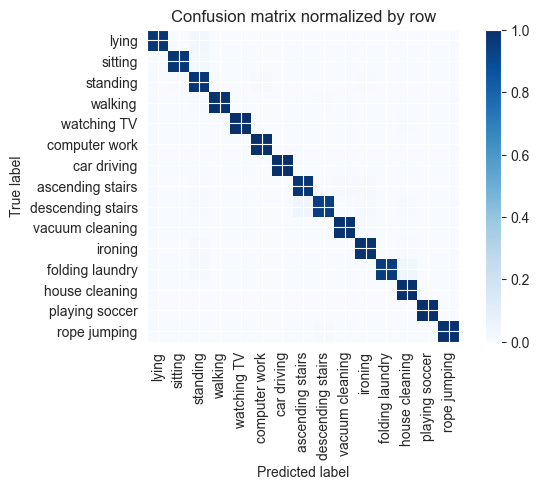

Overall accuracy: 0.982




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.35batch/s]


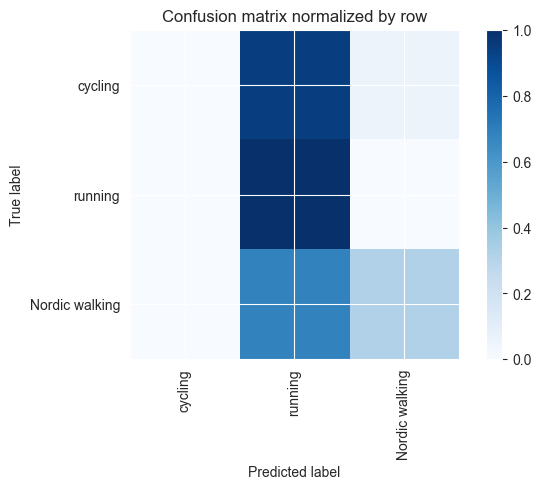

Overall accuracy: 0.350

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.869      0.318      0.466      0.418       1821|	 running: 0.682,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1587|	 running: 0.945,	Nordic walking: 0.055,	
       running       0.256      1.000      0.408      0.217        944|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.419      0.350      0.283        1.0       4352|	      

{'accuracy': 0.3499540441176471, 'precision': 0.3751578491133564, 'recall': 0.43931905546403077, 'f1': 0.2911322027892775}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 


seen: 100%|██████████| 70/70 [00:04<00:00, 15.42batch/s]


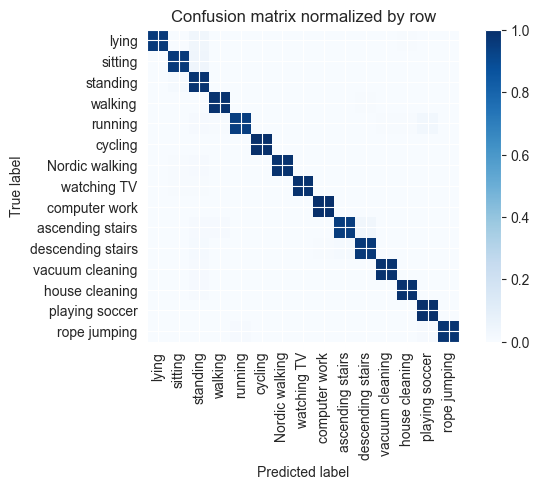

Overall accuracy: 0.980




unseen: 100%|██████████| 60/60 [00:03<00:00, 15.38batch/s]


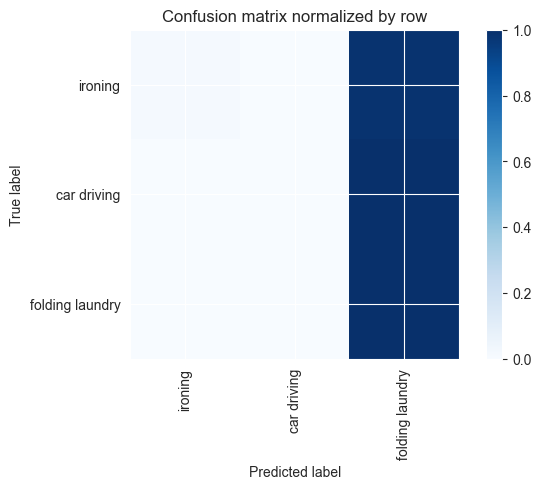

 63%|██████▎   | 12/19 [12:41<07:30, 64.35s/it]

Overall accuracy: 0.260

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.012      0.024      0.607       2332|	 folding laundry: 0.988,	car driving: 0.000,	
folding laundry       0.255      1.000      0.406      0.253        972|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.672      0.260      0.117        1.0       3840|	      

{'accuracy': 0.2604166666666667, 'precision': 0.4183280867436167, 'recall': 0.33733562035448833, 'f1': 0.14336110953649642}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 14.90batch/s]


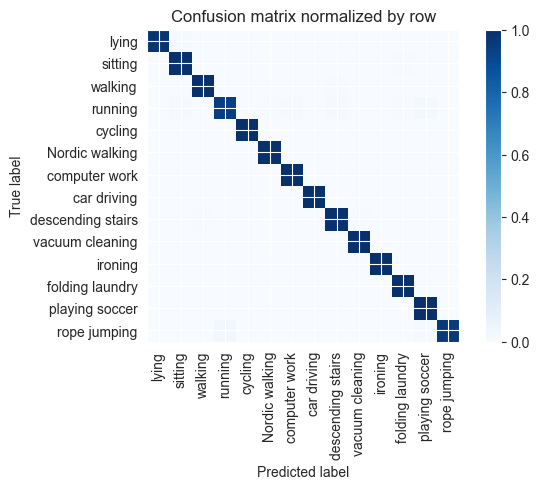

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:05<00:00, 14.88batch/s]


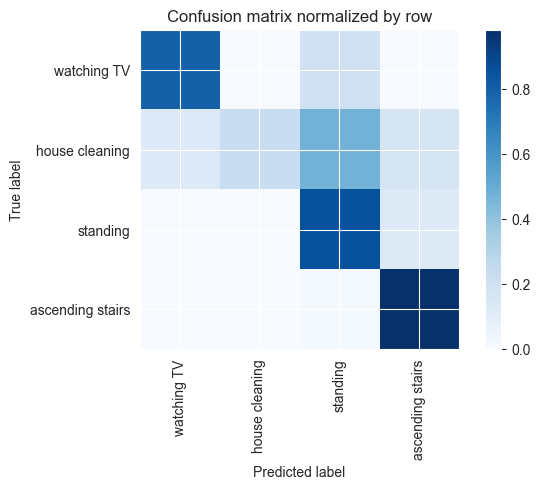

Overall accuracy: 0.667

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.603      0.859      0.709      0.330       1840|	 ascending stairs: 0.129,	watching TV: 0.007,	
  house cleaning       0.972      0.230      0.371      0.329       1830|	 standing: 0.472,	ascending stairs: 0.164,	
ascending stairs       0.661      0.983      0.791      0.193       1074|	 standing: 0.014,	house cleaning: 0.003,	
     watching TV       0.718      0.799      0.756      0.148        824|	 standing: 0.198,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.753      0.667      0.621        1.0       5568|	      

{'accuracy': 0.6672054597701149, 'precision': 0.7384985317942909, 'recall': 0.7176328099850424, 'f1': 0.6566515308437204}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 65/65 [00:04<00:00, 15.33batch/s]


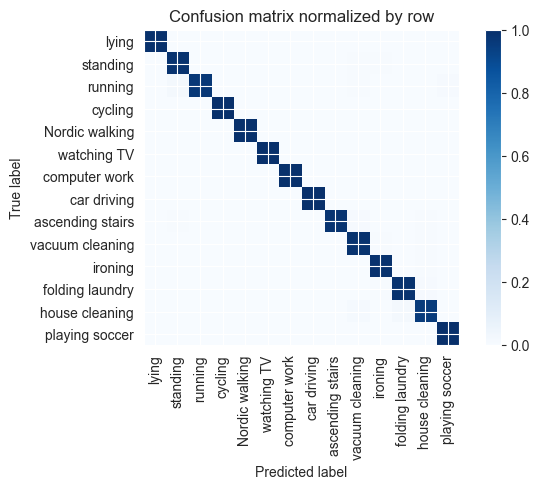

Overall accuracy: 0.988




unseen: 100%|██████████| 86/86 [00:05<00:00, 15.25batch/s]


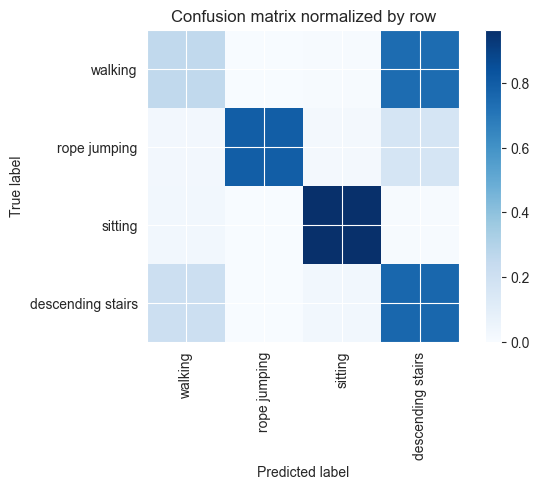

Overall accuracy: 0.616

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.695      0.253      0.371      0.421       2316|	 descending stairs: 0.742,	sitting: 0.005,	
          sitting       0.973      0.965      0.969      0.325       1791|	 walking: 0.027,	descending stairs: 0.007,	
descending stairs       0.284      0.760      0.413      0.171        941|	 walking: 0.210,	sitting: 0.030,	
     rope jumping       1.000      0.794      0.885      0.083        456|	 descending stairs: 0.162,	walking: 0.024,	

----------------------------------------------------------------------------------------------------
      avg / total       0.740      0.616      0.616        1.0       5504|	      

{'accuracy': 0.6164607558139535, 'precision': 0.7378482243182364, 'recall': 0.6931315791425916, 'f1': 0.6597082040581466}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:03<00:00, 15.40batch/s]


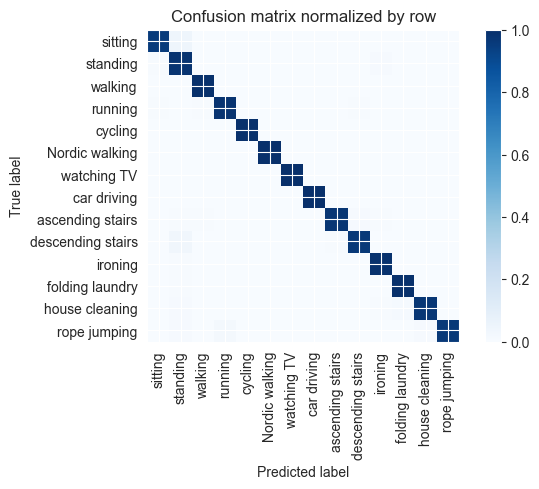

Overall accuracy: 0.985




unseen: 100%|██████████| 111/111 [00:07<00:00, 15.11batch/s]


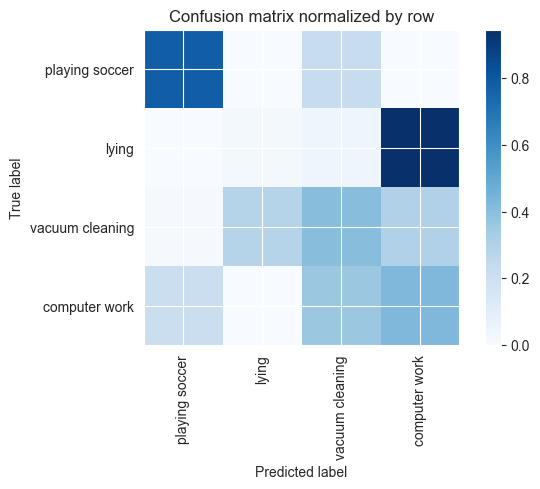

Overall accuracy: 0.335

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.364      0.426      0.393      0.432       3066|	 vacuum cleaning: 0.359,	playing soccer: 0.211,	
          lying       0.061      0.017      0.027      0.264       1876|	 computer work: 0.943,	vacuum cleaning: 0.040,	
vacuum cleaning       0.350      0.404      0.375      0.240       1704|	 computer work: 0.300,	lying: 0.285,	
 playing soccer       0.348      0.775      0.480      0.064        458|	 vacuum cleaning: 0.225,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.280      0.335      0.297 0.9999999999999999       7104|	      

{'accuracy': 0.33530405405405406, 'precision': 0.2805863522426693, 'recall': 0.4055527329238126, 'f1': 0.31858813540334274}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycl


seen: 100%|██████████| 69/69 [00:04<00:00, 15.22batch/s]


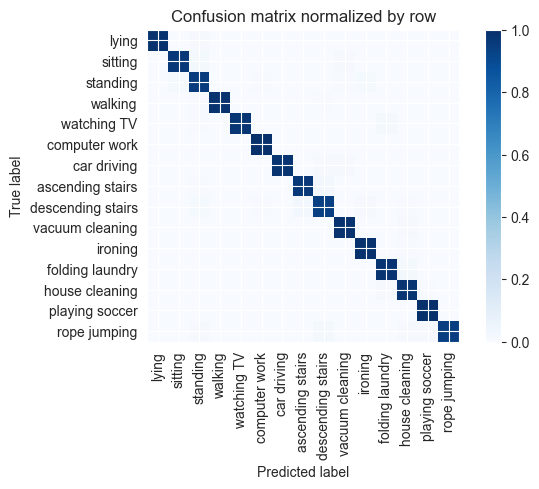

Overall accuracy: 0.979




unseen: 100%|██████████| 68/68 [00:04<00:00, 15.23batch/s]


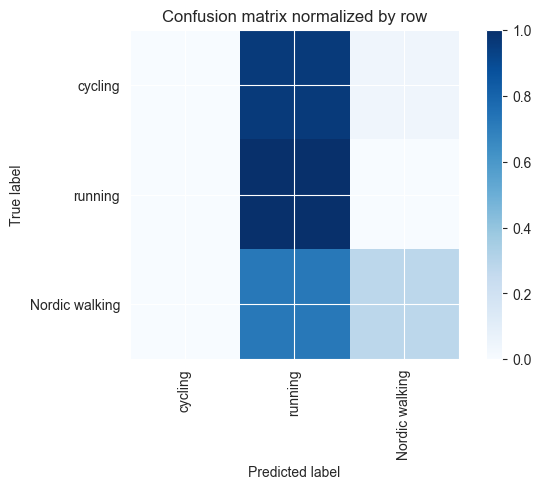

Overall accuracy: 0.333

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.882      0.279      0.424      0.420       1826|	 running: 0.721,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1585|	 running: 0.957,	Nordic walking: 0.043,	
       running       0.249      1.000      0.399      0.216        941|	 Nordic walking: 0.000,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.424      0.333      0.264        1.0       4352|	      

{'accuracy': 0.33340992647058826, 'precision': 0.3772301713478184, 'recall': 0.4264330047462577, 'f1': 0.2744814963160845}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 


seen: 100%|██████████| 70/70 [00:04<00:00, 14.32batch/s]


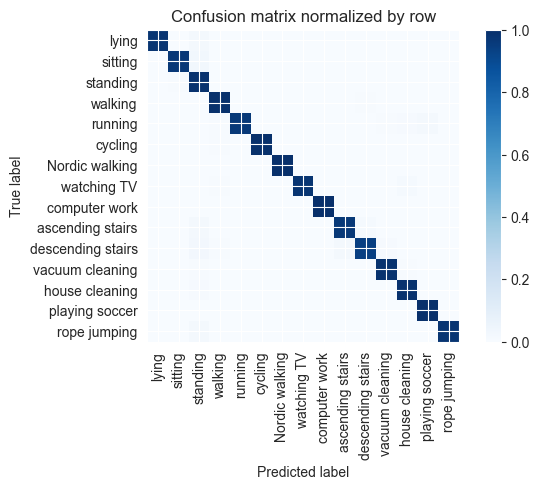

Overall accuracy: 0.984




unseen: 100%|██████████| 60/60 [00:04<00:00, 14.65batch/s]


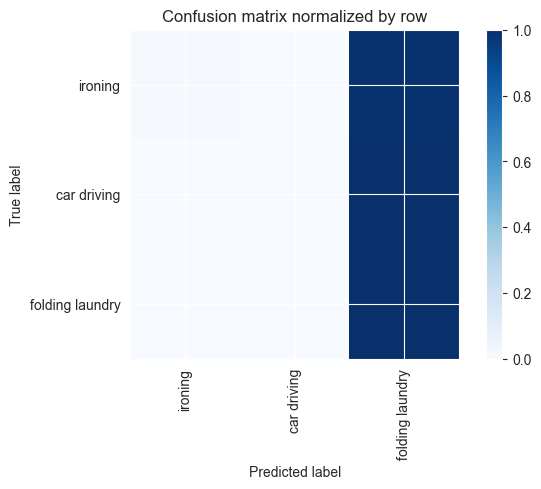

 68%|██████▊   | 13/19 [13:46<06:28, 64.74s/it]

Overall accuracy: 0.259

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.009      0.017      0.607       2330|	 folding laundry: 0.991,	car driving: 0.000,	
folding laundry       0.255      1.000      0.406      0.254        974|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.671      0.259      0.113        1.0       3840|	      

{'accuracy': 0.25885416666666666, 'precision': 0.41832460732984295, 'recall': 0.3361945636623748, 'f1': 0.1411208455013211}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:04<00:00, 14.05batch/s]


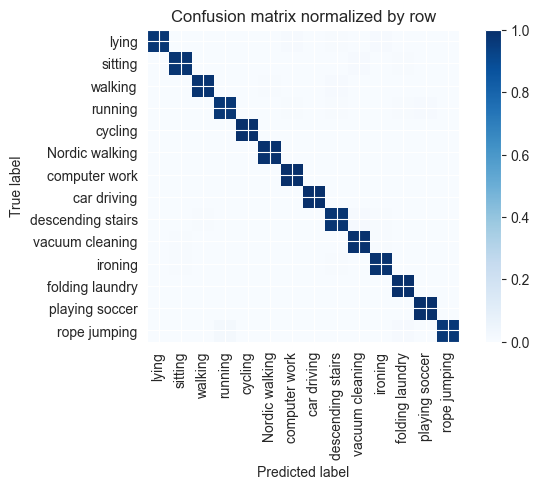

Overall accuracy: 0.988




unseen: 100%|██████████| 87/87 [00:07<00:00, 12.14batch/s]


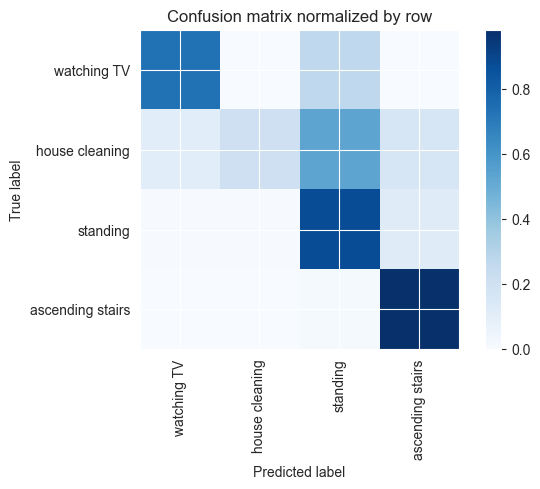

Overall accuracy: 0.655

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.572      0.873      0.692      0.331       1841|	 ascending stairs: 0.116,	watching TV: 0.006,	
  house cleaning       0.966      0.205      0.338      0.328       1828|	 standing: 0.531,	ascending stairs: 0.157,	
ascending stairs       0.678      0.982      0.802      0.193       1075|	 standing: 0.014,	house cleaning: 0.004,	
     watching TV       0.745      0.735      0.740      0.148        824|	 standing: 0.262,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.748      0.655      0.604        1.0       5568|	      

{'accuracy': 0.6546336206896551, 'precision': 0.740530012632707, 'recall': 0.6990857638175589, 'f1': 0.643141537439022}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'No


seen: 100%|██████████| 65/65 [00:04<00:00, 13.42batch/s]


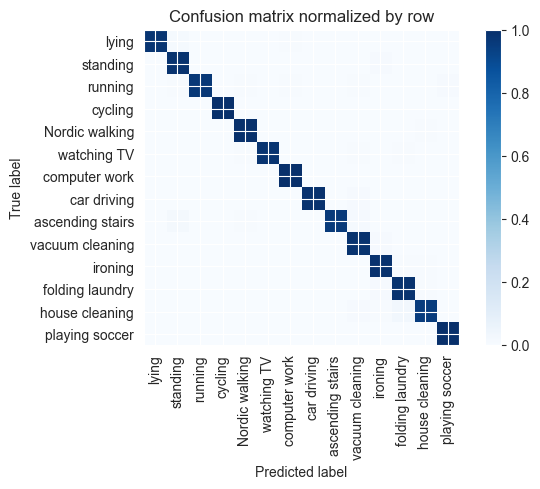

Overall accuracy: 0.985




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.18batch/s]


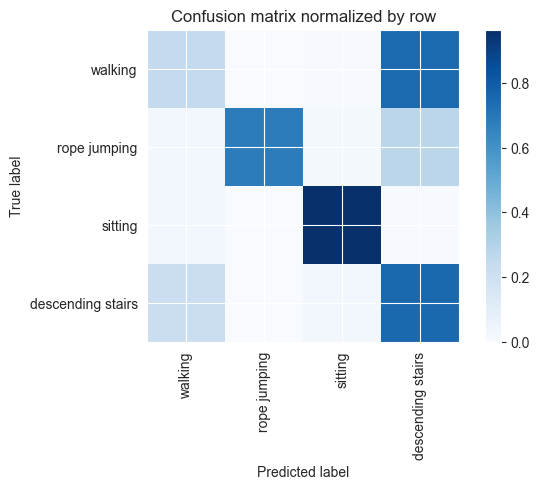

Overall accuracy: 0.604

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.684      0.248      0.364      0.421       2316|	 descending stairs: 0.747,	sitting: 0.005,	
          sitting       0.973      0.965      0.969      0.324       1784|	 walking: 0.027,	descending stairs: 0.007,	
descending stairs       0.277      0.756      0.405      0.172        946|	 walking: 0.215,	sitting: 0.030,	
     rope jumping       1.000      0.679      0.809      0.083        458|	 descending stairs: 0.275,	walking: 0.028,	

----------------------------------------------------------------------------------------------------
      avg / total       0.734      0.604      0.604        1.0       5504|	      

{'accuracy': 0.6035610465116279, 'precision': 0.7335437142008032, 'recall': 0.6619852492309437, 'f1': 0.6367539136037949}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:04<00:00, 13.21batch/s]


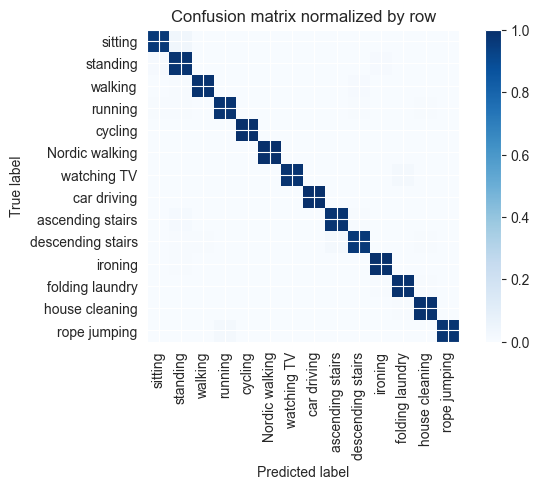

Overall accuracy: 0.985




unseen: 100%|██████████| 111/111 [00:08<00:00, 12.93batch/s]


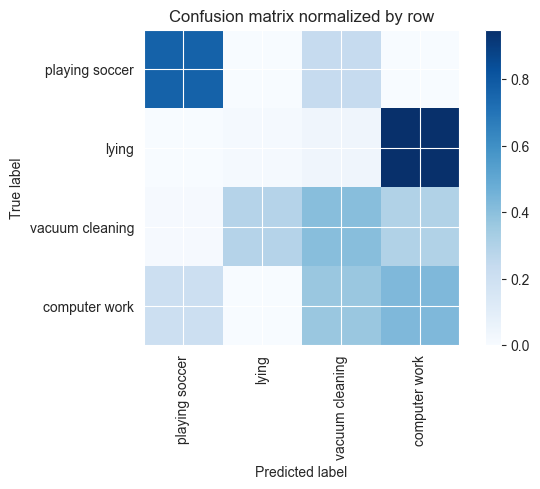

Overall accuracy: 0.334

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.365      0.427      0.394      0.432       3071|	 vacuum cleaning: 0.363,	playing soccer: 0.206,	
          lying       0.042      0.012      0.018      0.263       1870|	 computer work: 0.948,	vacuum cleaning: 0.041,	
vacuum cleaning       0.347      0.405      0.374      0.240       1706|	 computer work: 0.297,	lying: 0.288,	
 playing soccer       0.349      0.764      0.479      0.064        457|	 vacuum cleaning: 0.236,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.275      0.334      0.296        1.0       7104|	      

{'accuracy': 0.33403716216216217, 'precision': 0.2758269615142639, 'recall': 0.40184466565655197, 'f1': 0.31622618364710675}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7


seen: 100%|██████████| 69/69 [00:05<00:00, 13.35batch/s]


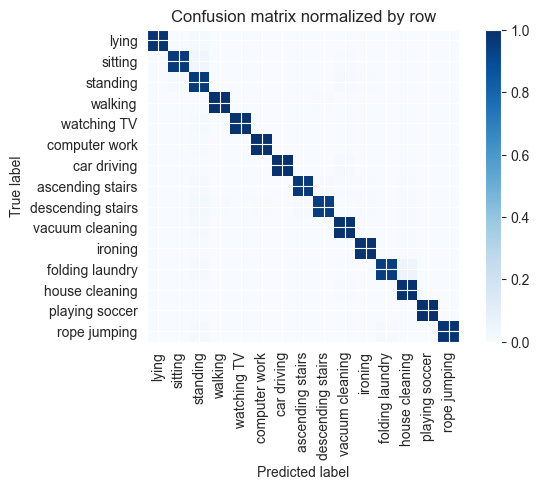

Overall accuracy: 0.979




unseen: 100%|██████████| 68/68 [00:05<00:00, 13.29batch/s]


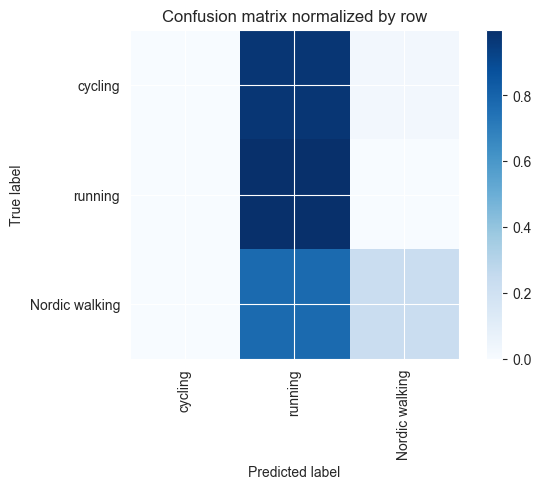

Overall accuracy: 0.311

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.906      0.227      0.363      0.420       1828|	 running: 0.773,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1584|	 running: 0.973,	Nordic walking: 0.027,	
       running       0.241      0.999      0.388      0.216        940|	 Nordic walking: 0.001,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.433      0.311      0.236        1.0       4352|	      

{'accuracy': 0.31112132352941174, 'precision': 0.38241791761146365, 'recall': 0.4086534134115493, 'f1': 0.2505259177453184}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':


seen: 100%|██████████| 70/70 [00:05<00:00, 13.09batch/s]


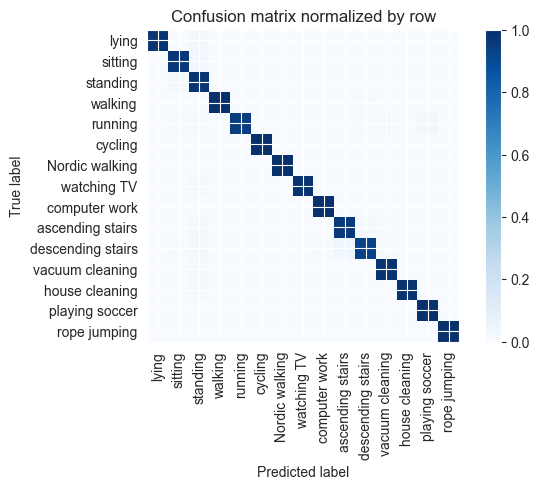

Overall accuracy: 0.982




unseen: 100%|██████████| 60/60 [00:04<00:00, 13.38batch/s]


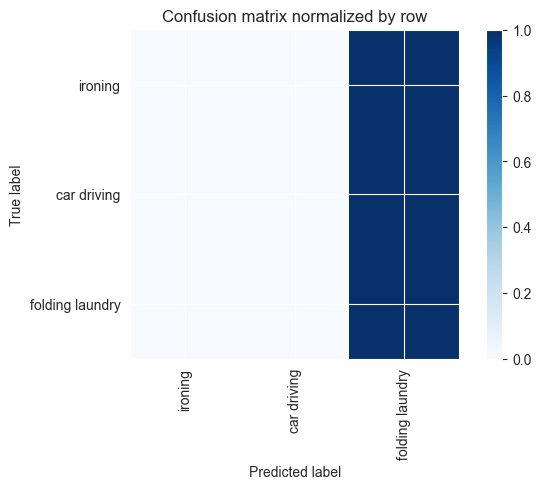

 74%|███████▎  | 14/19 [15:00<05:38, 67.61s/it]

Overall accuracy: 0.255

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.004      0.008      0.607       2331|	 folding laundry: 0.996,	car driving: 0.000,	
folding laundry       0.253      1.000      0.404      0.253        971|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.671      0.255      0.107        1.0       3840|	      

{'accuracy': 0.2552083333333333, 'precision': 0.41781954233011404, 'recall': 0.33462033462033464, 'f1': 0.13736904494921987}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car


seen: 100%|██████████| 65/65 [00:04<00:00, 13.35batch/s]


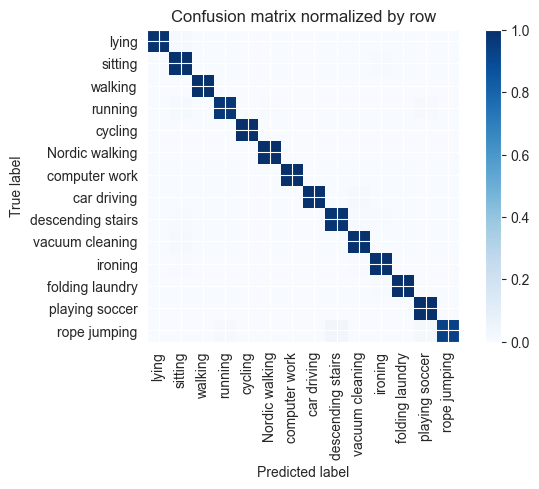

Overall accuracy: 0.991




unseen: 100%|██████████| 87/87 [00:06<00:00, 13.15batch/s]


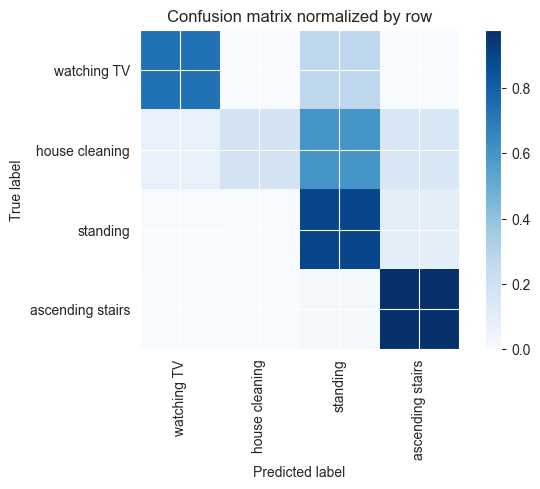

Overall accuracy: 0.650

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.551      0.893      0.681      0.331       1842|	 ascending stairs: 0.097,	watching TV: 0.007,	
  house cleaning       0.976      0.178      0.302      0.329       1833|	 standing: 0.600,	ascending stairs: 0.149,	
ascending stairs       0.697      0.978      0.814      0.192       1070|	 standing: 0.021,	house cleaning: 0.002,	
     watching TV       0.806      0.730      0.766      0.148        823|	 standing: 0.267,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.757      0.650      0.594        1.0       5568|	      

{'accuracy': 0.6499640804597702, 'precision': 0.7574506372165646, 'recall': 0.6948180902481431, 'f1': 0.640765456973839}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'N


seen: 100%|██████████| 65/65 [00:04<00:00, 13.00batch/s]


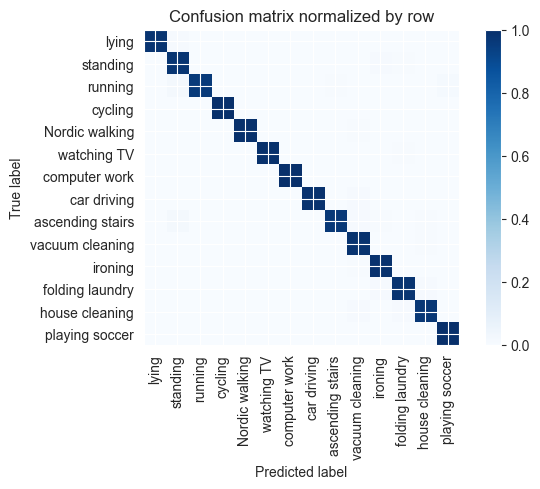

Overall accuracy: 0.986




unseen: 100%|██████████| 86/86 [00:06<00:00, 13.17batch/s]


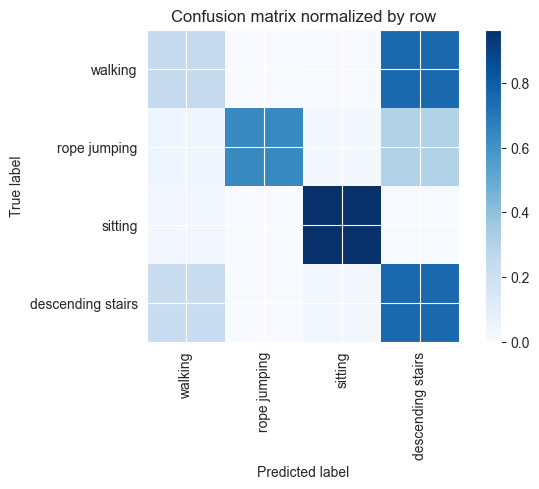

Overall accuracy: 0.596

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.669      0.243      0.357      0.422       2323|	 descending stairs: 0.752,	sitting: 0.005,	
          sitting       0.974      0.965      0.969      0.324       1782|	 walking: 0.029,	descending stairs: 0.006,	
descending stairs       0.272      0.751      0.400      0.172        944|	 walking: 0.220,	sitting: 0.029,	
     rope jumping       1.000      0.635      0.777      0.083        455|	 descending stairs: 0.303,	walking: 0.044,	

----------------------------------------------------------------------------------------------------
      avg / total       0.727      0.596      0.597        1.0       5504|	      

{'accuracy': 0.5962936046511628, 'precision': 0.7286864090645896, 'recall': 0.648522649004132, 'f1': 0.6255981534678439}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic


seen: 100%|██████████| 60/60 [00:04<00:00, 13.00batch/s]


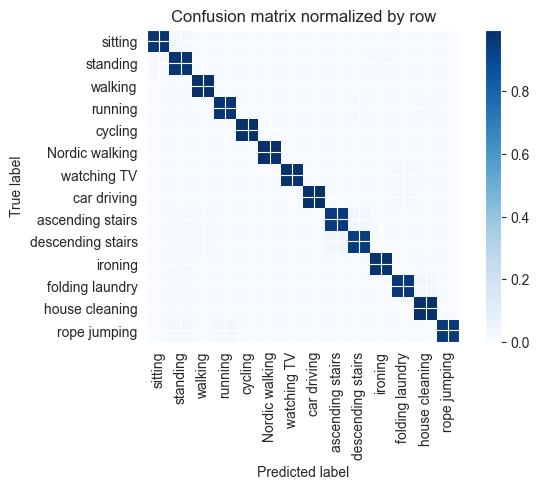

Overall accuracy: 0.981




unseen: 100%|██████████| 111/111 [00:08<00:00, 13.02batch/s]


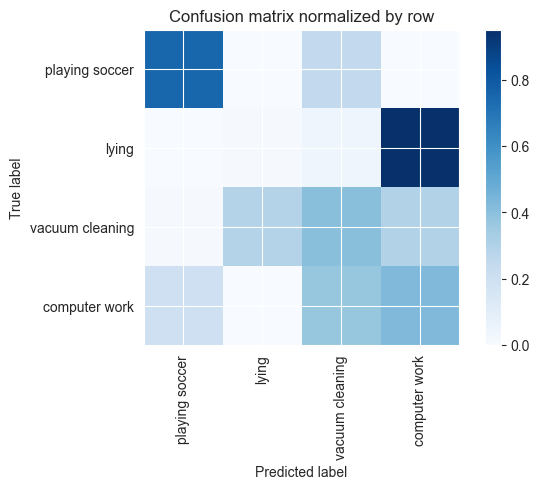

Overall accuracy: 0.331

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.363      0.425      0.391      0.432       3069|	 vacuum cleaning: 0.374,	playing soccer: 0.198,	
          lying       0.036      0.010      0.016      0.264       1874|	 computer work: 0.950,	vacuum cleaning: 0.040,	
vacuum cleaning       0.338      0.401      0.367      0.240       1704|	 computer work: 0.296,	lying: 0.293,	
 playing soccer       0.355      0.753      0.483      0.064        457|	 vacuum cleaning: 0.247,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.270      0.331      0.292        1.0       7104|	      

{'accuracy': 0.33065878378378377, 'precision': 0.273182491585223, 'recall': 0.3970659574857645, 'f1': 0.3142491547946019}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 69/69 [00:05<00:00, 12.95batch/s]


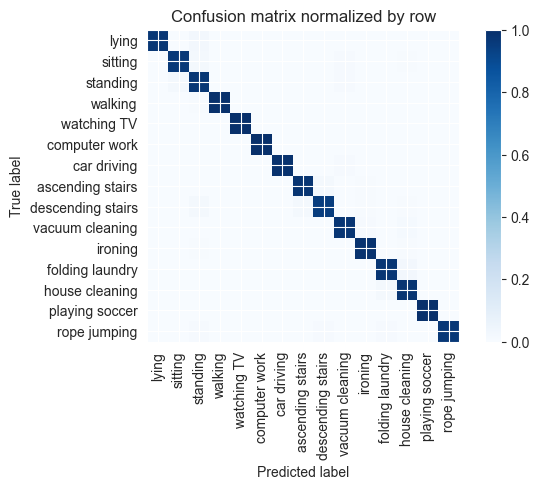

Overall accuracy: 0.981




unseen: 100%|██████████| 68/68 [00:05<00:00, 12.99batch/s]


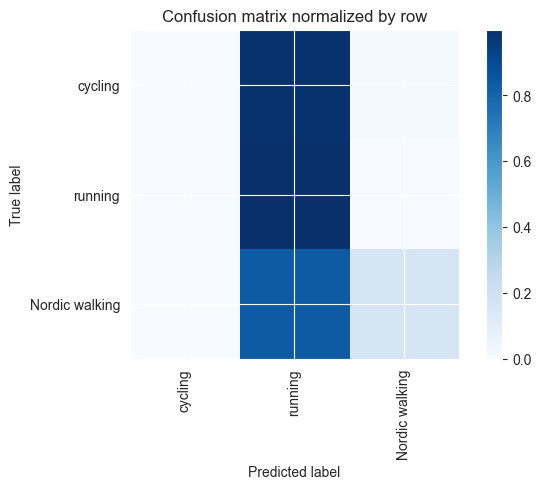

Overall accuracy: 0.286

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.938      0.167      0.284      0.419       1822|	 running: 0.833,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1590|	 running: 0.988,	Nordic walking: 0.012,	
       running       0.233      0.999      0.378      0.216        940|	 Nordic walking: 0.001,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.443      0.286      0.201        1.0       4352|	      

{'accuracy': 0.2858455882352941, 'precision': 0.39054586668194813, 'recall': 0.3887782111466629, 'f1': 0.22073760097187942}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':


seen: 100%|██████████| 70/70 [00:05<00:00, 11.74batch/s]


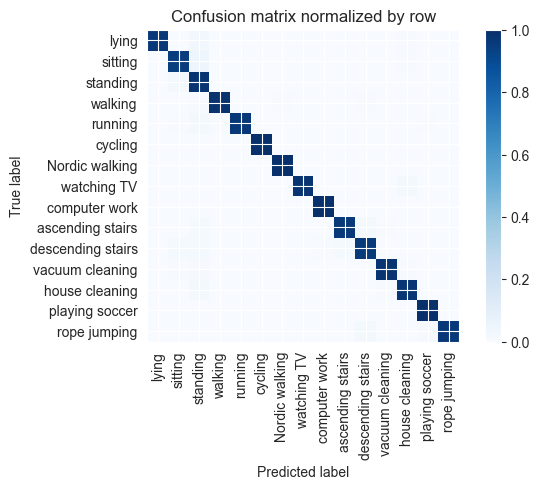

Overall accuracy: 0.980




unseen: 100%|██████████| 60/60 [00:05<00:00, 11.75batch/s]


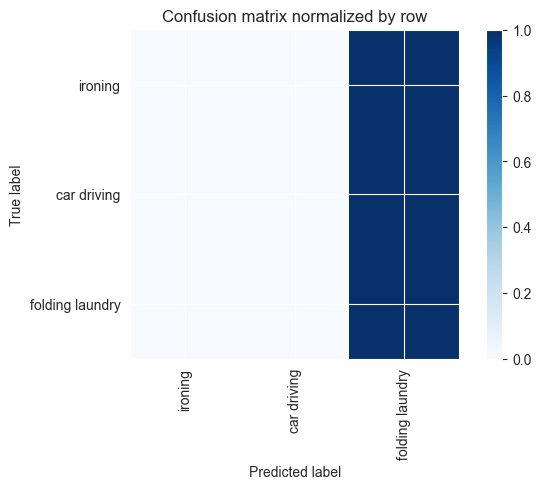

 79%|███████▉  | 15/19 [16:17<04:41, 70.27s/it]

Overall accuracy: 0.254

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       1.000      0.001      0.003      0.607       2330|	 folding laundry: 0.999,	car driving: 0.000,	
folding laundry       0.254      1.000      0.405      0.253        973|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.671      0.254      0.104        1.0       3840|	      

{'accuracy': 0.25416666666666665, 'precision': 0.41786117626618013, 'recall': 0.33376251788268957, 'f1': 0.13571520018155253}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'ca


seen: 100%|██████████| 65/65 [00:05<00:00, 12.45batch/s]


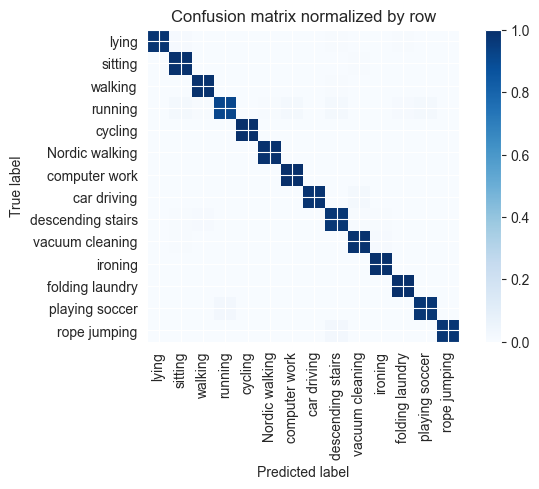

Overall accuracy: 0.987




unseen: 100%|██████████| 87/87 [00:06<00:00, 12.82batch/s]


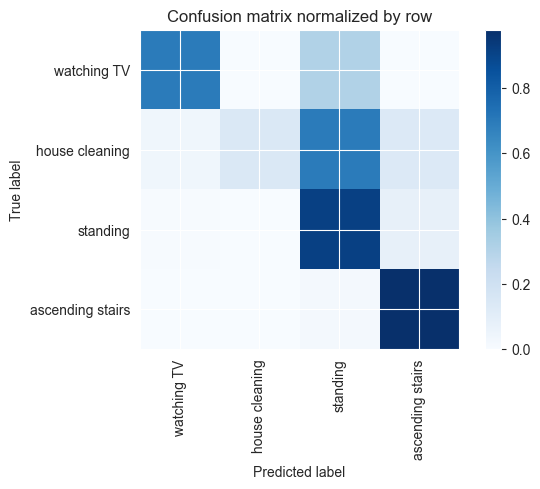

Overall accuracy: 0.639

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.521      0.914      0.664      0.330       1835|	 ascending stairs: 0.080,	watching TV: 0.005,	
  house cleaning       0.992      0.140      0.246      0.329       1831|	 standing: 0.692,	ascending stairs: 0.131,	
ascending stairs       0.731      0.977      0.836      0.193       1074|	 standing: 0.022,	house cleaning: 0.001,	
     watching TV       0.880      0.692      0.775      0.149        828|	 standing: 0.306,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.770      0.639      0.576        1.0       5568|	      

{'accuracy': 0.6388290229885057, 'precision': 0.7809395635968003, 'recall': 0.6808883484387839, 'f1': 0.6300680060474981}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 65/65 [00:05<00:00, 12.88batch/s]


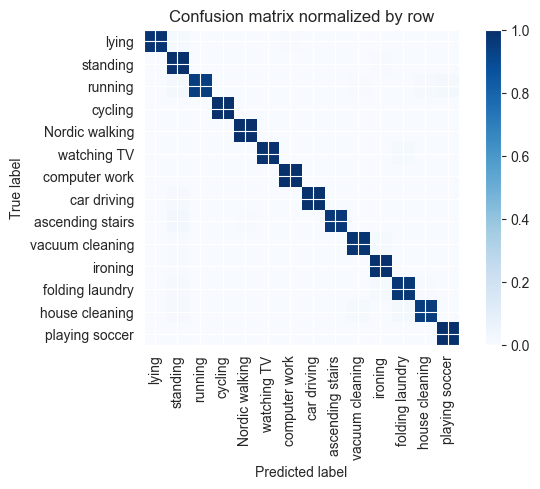

Overall accuracy: 0.983




unseen: 100%|██████████| 86/86 [00:06<00:00, 12.76batch/s]


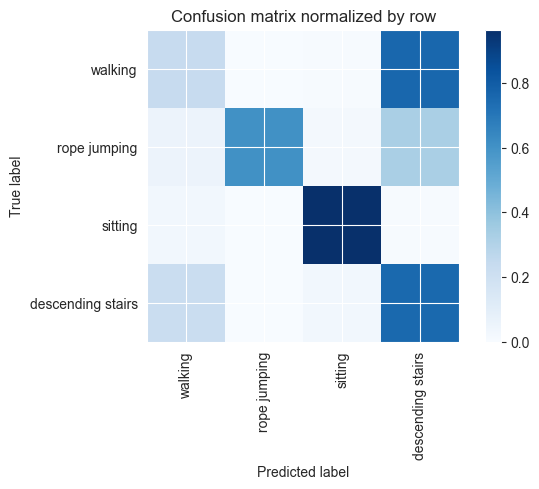

Overall accuracy: 0.591

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.655      0.235      0.346      0.420       2312|	 descending stairs: 0.760,	sitting: 0.005,	
          sitting       0.972      0.964      0.968      0.326       1792|	 walking: 0.030,	descending stairs: 0.007,	
descending stairs       0.270      0.749      0.397      0.172        946|	 walking: 0.221,	sitting: 0.030,	
     rope jumping       1.000      0.604      0.753      0.082        454|	 descending stairs: 0.324,	walking: 0.053,	

----------------------------------------------------------------------------------------------------
      avg / total       0.721      0.591      0.591        1.0       5504|	      

{'accuracy': 0.5910247093023255, 'precision': 0.7243777948420591, 'recall': 0.6378962395289012, 'f1': 0.6159084979605288}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:04<00:00, 12.95batch/s]


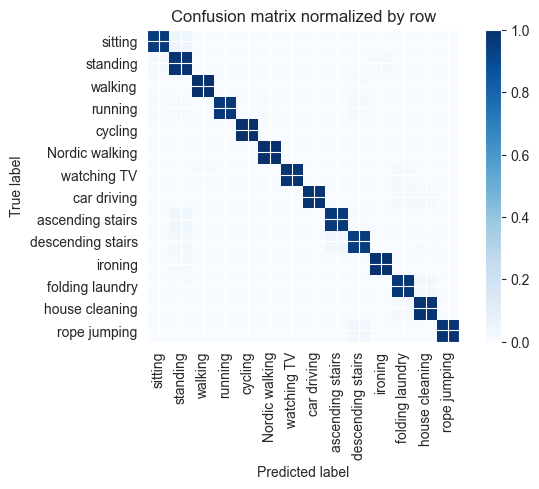

Overall accuracy: 0.980




unseen: 100%|██████████| 111/111 [00:08<00:00, 12.87batch/s]


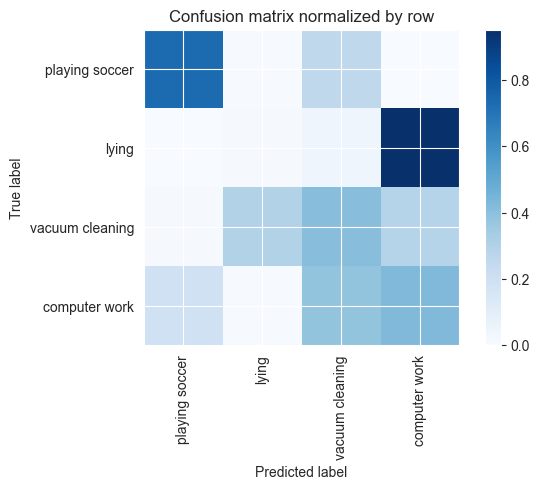

Overall accuracy: 0.330

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.364      0.424      0.392      0.432       3070|	 vacuum cleaning: 0.379,	playing soccer: 0.193,	
          lying       0.032      0.009      0.014      0.264       1873|	 computer work: 0.951,	vacuum cleaning: 0.040,	
vacuum cleaning       0.337      0.405      0.368      0.240       1705|	 lying: 0.296,	computer work: 0.289,	
 playing soccer       0.355      0.735      0.479      0.064        456|	 vacuum cleaning: 0.259,	lying: 0.007,	

----------------------------------------------------------------------------------------------------
    avg / total       0.269      0.330      0.292        1.0       7104|	      

{'accuracy': 0.32995495495495497, 'precision': 0.2719357650245081, 'recall': 0.39319564122892336, 'f1': 0.3130996074179078}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic


seen: 100%|██████████| 69/69 [00:05<00:00, 13.06batch/s]


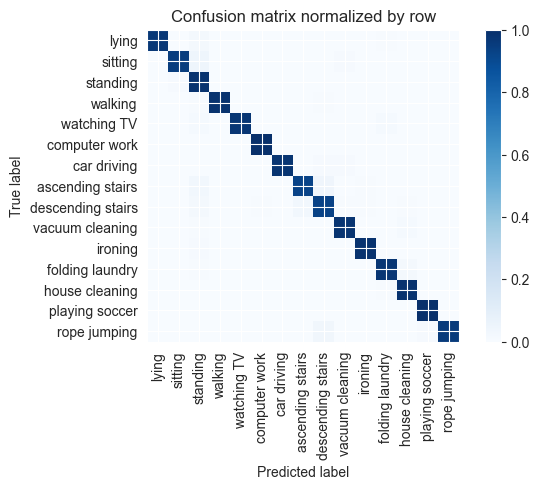

Overall accuracy: 0.976




unseen: 100%|██████████| 68/68 [00:05<00:00, 12.90batch/s]


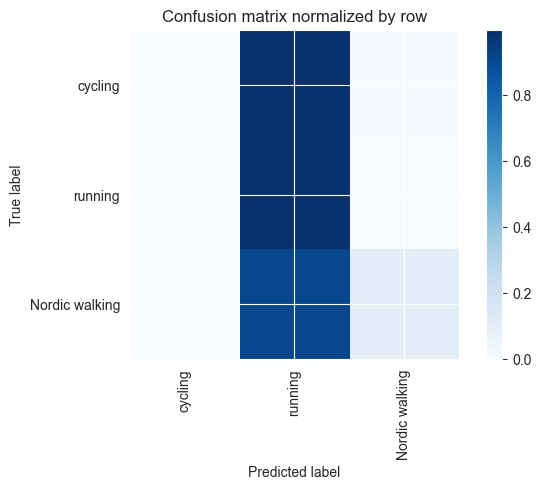

Overall accuracy: 0.255

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.930      0.095      0.172      0.421       1832|	 running: 0.905,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.363       1580|	 running: 0.994,	Nordic walking: 0.006,	
       running       0.225      0.997      0.367      0.216        940|	 Nordic walking: 0.003,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.440      0.255      0.152        1.0       4352|	      

{'accuracy': 0.25528492647058826, 'precision': 0.385150423805886, 'recall': 0.3639288921923875, 'f1': 0.17981788096336518}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 


seen: 100%|██████████| 70/70 [00:05<00:00, 12.89batch/s]


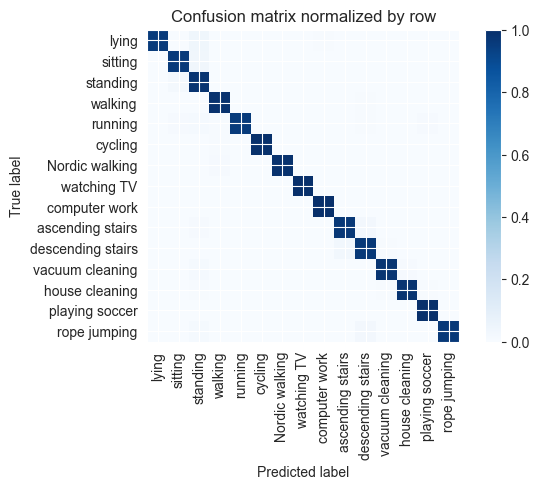

Overall accuracy: 0.981




unseen: 100%|██████████| 60/60 [00:04<00:00, 12.42batch/s]


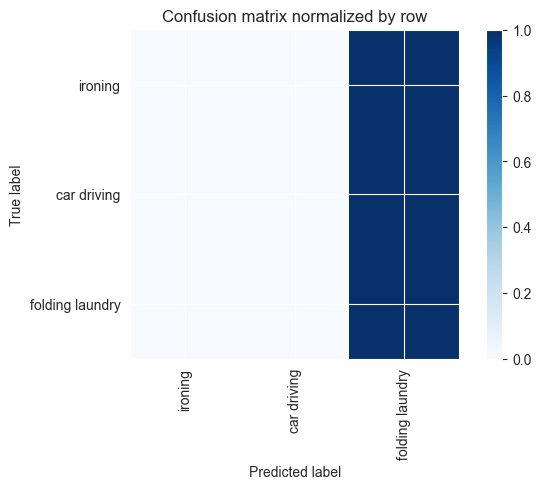

 84%|████████▍ | 16/19 [17:33<03:35, 71.99s/it]

Overall accuracy: 0.253

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.607       2331|	 folding laundry: 1.000,	car driving: 0.000,	
folding laundry       0.253      1.000      0.404      0.253        972|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.064      0.253      0.102        1.0       3840|	      

{'accuracy': 0.253125, 'precision': 0.08437499999999999, 'recall': 0.3333333333333333, 'f1': 0.13466334164588528}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 


seen: 100%|██████████| 65/65 [00:05<00:00, 12.82batch/s]


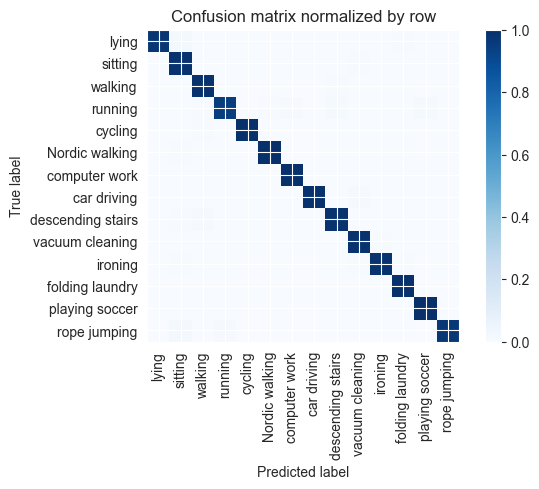

Overall accuracy: 0.987




unseen: 100%|██████████| 87/87 [00:06<00:00, 12.50batch/s]


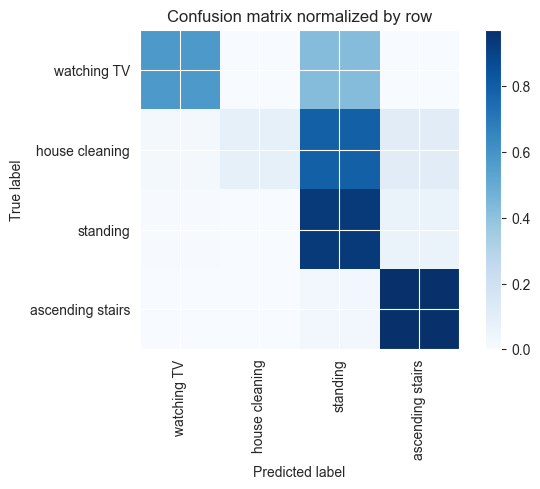

Overall accuracy: 0.609

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.486      0.934      0.639      0.332       1847|	 ascending stairs: 0.062,	watching TV: 0.004,	
  house cleaning       1.000      0.083      0.154      0.328       1828|	 standing: 0.793,	ascending stairs: 0.108,	
ascending stairs       0.768      0.971      0.857      0.192       1068|	 standing: 0.029,	house cleaning: 0.000,	
     watching TV       0.928      0.576      0.711      0.148        825|	 standing: 0.422,	ascending stairs: 0.002,	

----------------------------------------------------------------------------------------------------
     avg / total       0.774      0.609      0.532        1.0       5568|	      

{'accuracy': 0.6086566091954023, 'precision': 0.7952047881389537, 'recall': 0.6409573210493016, 'f1': 0.5900873307984388}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 65/65 [00:05<00:00, 12.70batch/s]


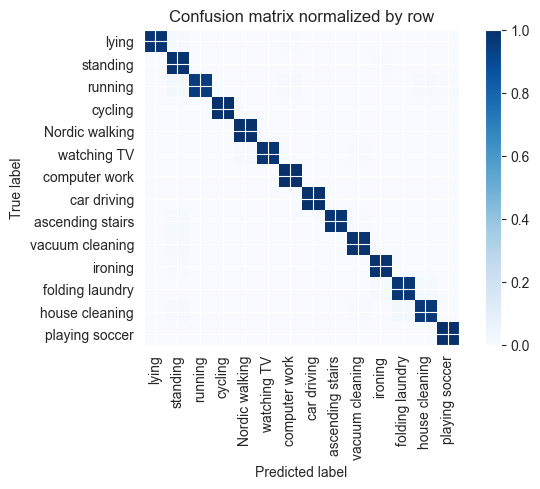

Overall accuracy: 0.986




unseen: 100%|██████████| 86/86 [00:06<00:00, 12.92batch/s]


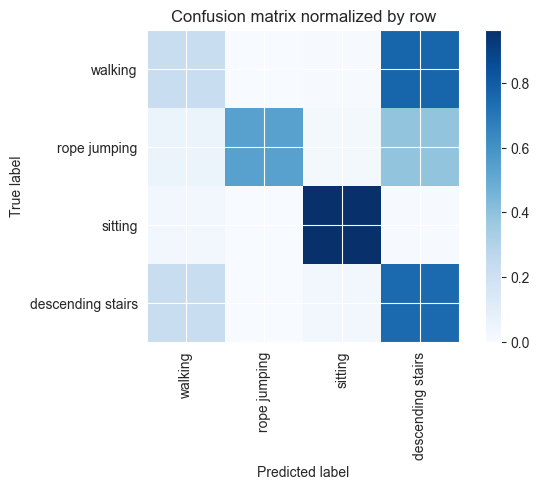

Overall accuracy: 0.582

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.644      0.226      0.335      0.420       2313|	 descending stairs: 0.769,	sitting: 0.005,	
          sitting       0.974      0.965      0.969      0.326       1792|	 walking: 0.029,	descending stairs: 0.006,	
descending stairs       0.264      0.748      0.390      0.171        942|	 walking: 0.224,	sitting: 0.028,	
     rope jumping       1.000      0.538      0.700      0.083        457|	 descending stairs: 0.385,	walking: 0.057,	

----------------------------------------------------------------------------------------------------
      avg / total       0.716      0.582      0.581        1.0       5504|	      

{'accuracy': 0.5821220930232558, 'precision': 0.7204458681480312, 'recall': 0.619553979615616, 'f1': 0.5986276344499203}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic


seen: 100%|██████████| 60/60 [00:04<00:00, 12.75batch/s]


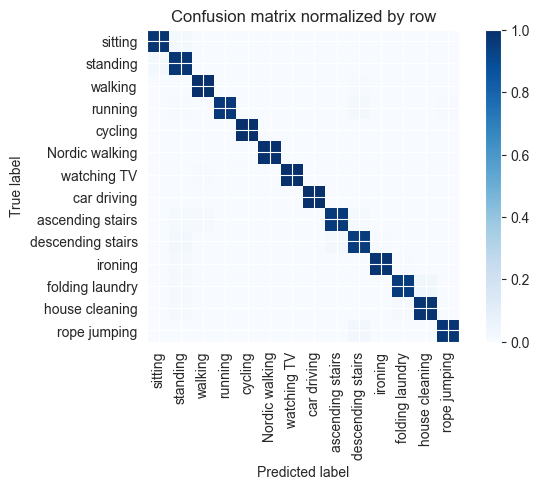

Overall accuracy: 0.980




unseen: 100%|██████████| 111/111 [00:08<00:00, 12.83batch/s]


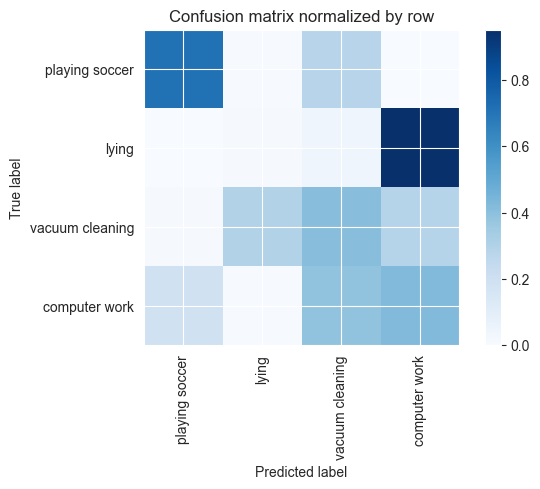

Overall accuracy: 0.329

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.365      0.424      0.392      0.432       3069|	 vacuum cleaning: 0.385,	playing soccer: 0.187,	
          lying       0.031      0.009      0.014      0.263       1869|	 computer work: 0.951,	vacuum cleaning: 0.040,	
vacuum cleaning       0.335      0.407      0.367      0.241       1709|	 lying: 0.300,	computer work: 0.284,	
 playing soccer       0.356      0.713      0.475      0.064        457|	 vacuum cleaning: 0.280,	lying: 0.007,	

----------------------------------------------------------------------------------------------------
    avg / total       0.269      0.329      0.292        1.0       7104|	      

{'accuracy': 0.3292511261261261, 'precision': 0.27173867925234046, 'recall': 0.38832253640704684, 'f1': 0.31218826776444314}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 69/69 [00:05<00:00, 12.68batch/s]


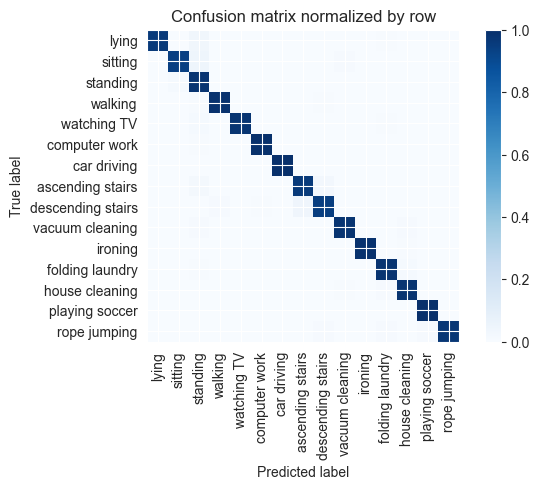

Overall accuracy: 0.977




unseen: 100%|██████████| 68/68 [00:05<00:00, 12.77batch/s]


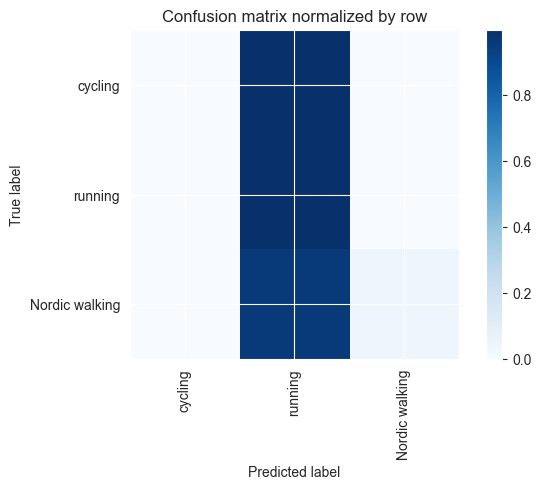

Overall accuracy: 0.233

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.907      0.043      0.082      0.418       1821|	 running: 0.957,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1590|	 running: 0.997,	Nordic walking: 0.003,	
       running       0.220      0.997      0.360      0.216        941|	 Nordic walking: 0.003,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.427      0.233      0.112        1.0       4352|	      

{'accuracy': 0.23345588235294118, 'precision': 0.3756182833800339, 'recall': 0.34654850337980386, 'f1': 0.14736270440135663}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning'


seen: 100%|██████████| 70/70 [00:05<00:00, 12.81batch/s]


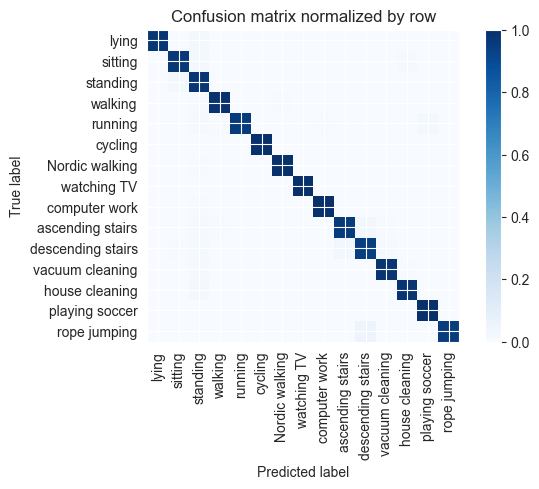

Overall accuracy: 0.980




unseen: 100%|██████████| 60/60 [00:04<00:00, 12.86batch/s]


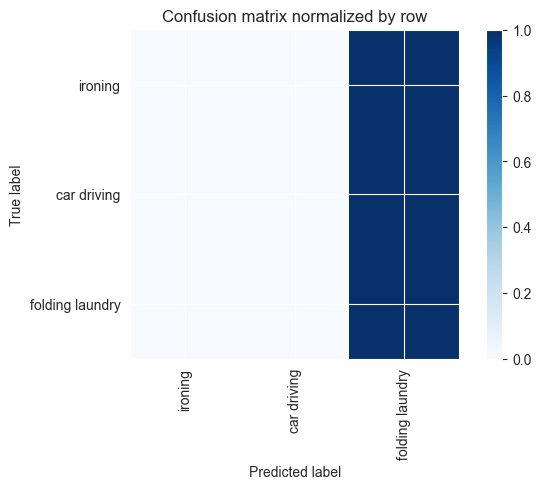

 89%|████████▉ | 17/19 [18:49<02:26, 73.37s/it]

Overall accuracy: 0.253

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.607       2332|	 folding laundry: 1.000,	car driving: 0.000,	
folding laundry       0.253      1.000      0.404      0.253        972|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        536|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.064      0.253      0.102        1.0       3840|	      

{'accuracy': 0.253125, 'precision': 0.08437499999999999, 'recall': 0.3333333333333333, 'f1': 0.13466334164588528}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 


seen: 100%|██████████| 65/65 [00:04<00:00, 13.07batch/s]


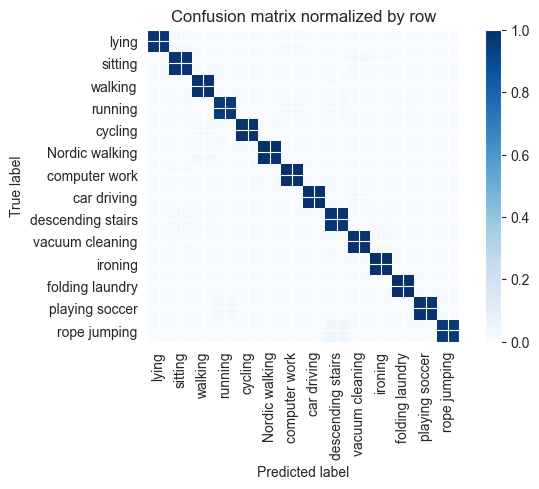

Overall accuracy: 0.987




unseen: 100%|██████████| 87/87 [00:07<00:00, 12.11batch/s]


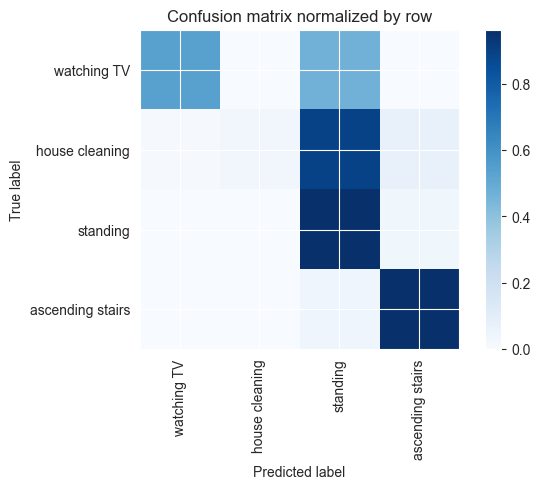

Overall accuracy: 0.593

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.463      0.961      0.625      0.331       1842|	 ascending stairs: 0.036,	watching TV: 0.003,	
  house cleaning       1.000      0.031      0.060      0.328       1829|	 standing: 0.891,	ascending stairs: 0.069,	
ascending stairs       0.842      0.962      0.898      0.193       1076|	 standing: 0.038,	house cleaning: 0.000,	
     watching TV       0.955      0.537      0.687      0.147        821|	 standing: 0.463,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.785      0.593      0.502        1.0       5568|	      

{'accuracy': 0.5932112068965517, 'precision': 0.8150110819405227, 'recall': 0.6227805877494079, 'f1': 0.5677912913748859}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 65/65 [00:05<00:00, 12.85batch/s]


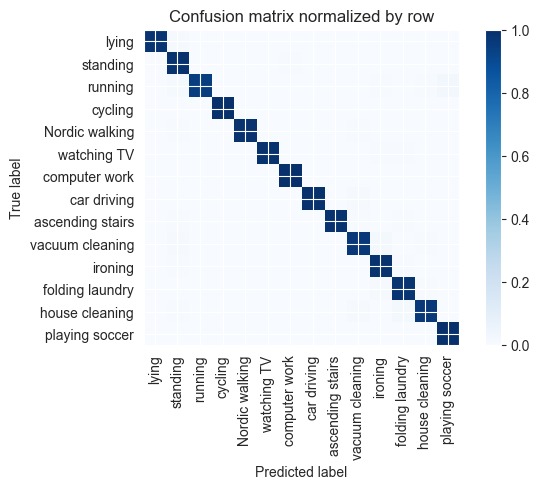

Overall accuracy: 0.983




unseen: 100%|██████████| 86/86 [00:06<00:00, 12.79batch/s]


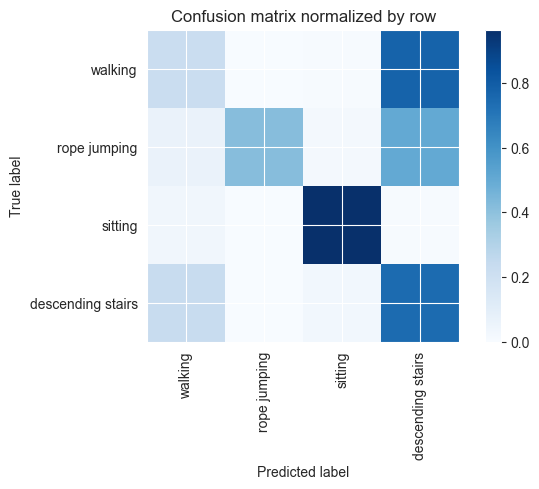

Overall accuracy: 0.568

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.632      0.221      0.327      0.421       2315|	 descending stairs: 0.774,	sitting: 0.006,	
          sitting       0.972      0.964      0.968      0.325       1790|	 walking: 0.031,	descending stairs: 0.006,	
descending stairs       0.258      0.745      0.383      0.172        945|	 walking: 0.226,	sitting: 0.029,	
     rope jumping       1.000      0.416      0.588      0.082        454|	 descending stairs: 0.502,	walking: 0.062,	

----------------------------------------------------------------------------------------------------
      avg / total       0.709      0.568      0.567        1.0       5504|	      

{'accuracy': 0.5684956395348837, 'precision': 0.7155992342126422, 'recall': 0.5864236491338998, 'f1': 0.5664872545628732}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:04<00:00, 12.78batch/s]


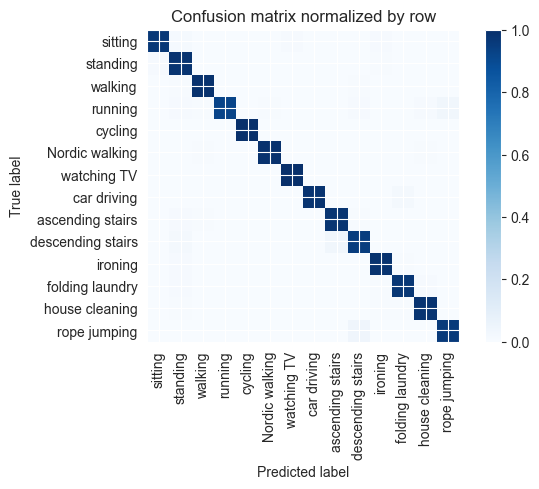

Overall accuracy: 0.979




unseen: 100%|██████████| 111/111 [00:08<00:00, 12.82batch/s]


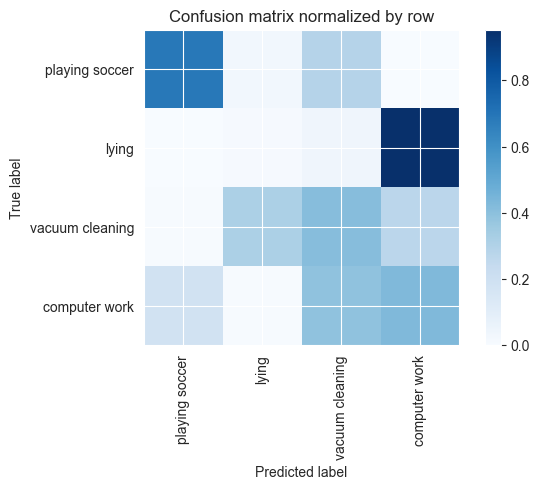

Overall accuracy: 0.329

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.368      0.426      0.395      0.432       3069|	 vacuum cleaning: 0.390,	playing soccer: 0.179,	
          lying       0.026      0.008      0.012      0.264       1875|	 computer work: 0.952,	vacuum cleaning: 0.040,	
vacuum cleaning       0.333      0.411      0.368      0.240       1704|	 lying: 0.313,	computer work: 0.268,	
 playing soccer       0.358      0.686      0.471      0.064        456|	 vacuum cleaning: 0.287,	lying: 0.026,	

----------------------------------------------------------------------------------------------------
    avg / total       0.269      0.329      0.292        1.0       7104|	      

{'accuracy': 0.32882882882882886, 'precision': 0.27136365410680985, 'recall': 0.38291502617943945, 'f1': 0.3114938957176963}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 69/69 [00:05<00:00, 12.91batch/s]


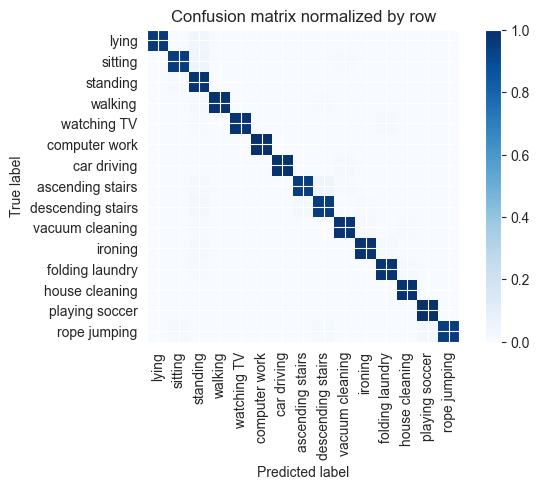

Overall accuracy: 0.977




unseen: 100%|██████████| 68/68 [00:05<00:00, 12.67batch/s]


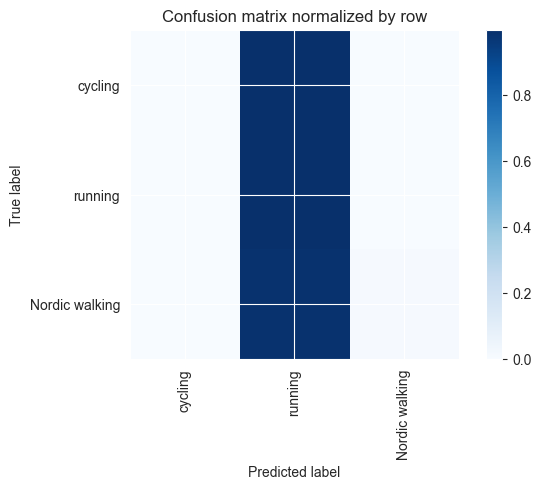

Overall accuracy: 0.219

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.808      0.011      0.023      0.420       1828|	 running: 0.989,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.365       1587|	 running: 0.999,	Nordic walking: 0.001,	
       running       0.216      0.997      0.355      0.215        937|	 Nordic walking: 0.003,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.386      0.219      0.086        1.0       4352|	      

{'accuracy': 0.21943933823529413, 'precision': 0.3411987149851228, 'recall': 0.3360954191372281, 'f1': 0.12586145653409517}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning':


seen: 100%|██████████| 70/70 [00:05<00:00, 13.02batch/s]


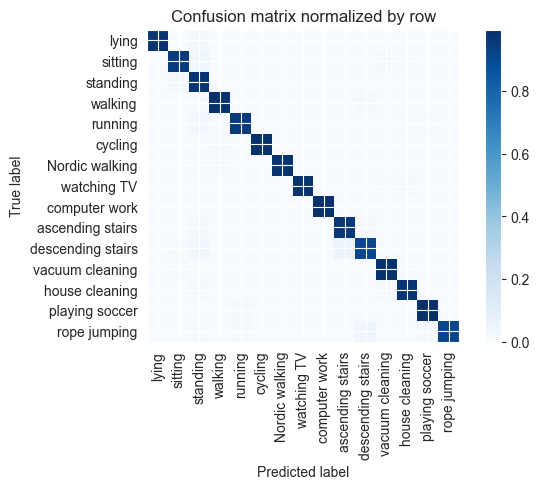

Overall accuracy: 0.975




unseen: 100%|██████████| 60/60 [00:04<00:00, 12.73batch/s]


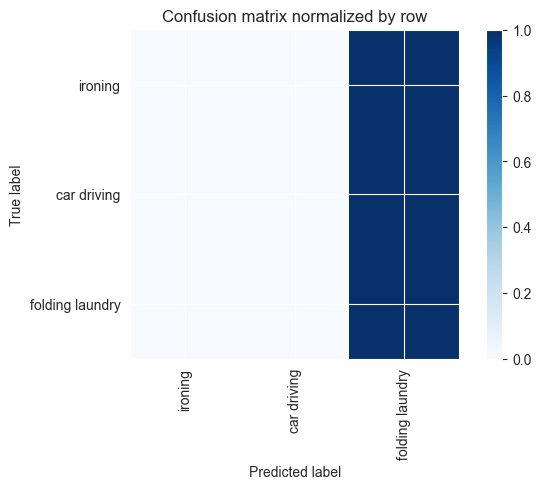

 95%|█████████▍| 18/19 [20:06<01:14, 74.39s/it]

Overall accuracy: 0.253

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.607       2332|	 folding laundry: 1.000,	car driving: 0.000,	
folding laundry       0.253      1.000      0.404      0.253        971|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.064      0.253      0.102        1.0       3840|	      

{'accuracy': 0.25286458333333334, 'precision': 0.08428819444444445, 'recall': 0.3333333333333333, 'f1': 0.1345527610337421}
============== Overall Unseen Classes Performance ==============
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car 


seen: 100%|██████████| 65/65 [00:05<00:00, 12.88batch/s]


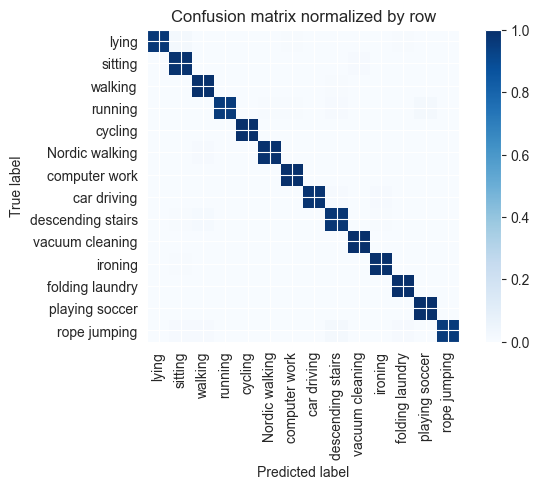

Overall accuracy: 0.988




unseen: 100%|██████████| 87/87 [00:06<00:00, 12.90batch/s]


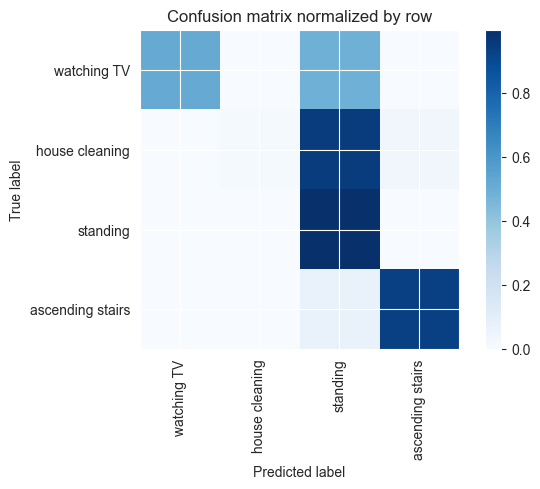

Overall accuracy: 0.591

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.455      0.998      0.625      0.331       1844|	 watching TV: 0.002,	ascending stairs: 0.000,	
  house cleaning       1.000      0.013      0.025      0.328       1826|	 standing: 0.950,	ascending stairs: 0.035,	
ascending stairs       0.941      0.933      0.937      0.193       1076|	 standing: 0.067,	house cleaning: 0.000,	
     watching TV       0.981      0.511      0.672      0.148        822|	 standing: 0.489,	ascending stairs: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.805      0.591      0.495        1.0       5568|	      

{'accuracy': 0.5905172413793104, 'precision': 0.8442080659286877, 'recall': 0.6137508367043865, 'f1': 0.5646464000518526}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, '


seen: 100%|██████████| 65/65 [00:05<00:00, 12.80batch/s]


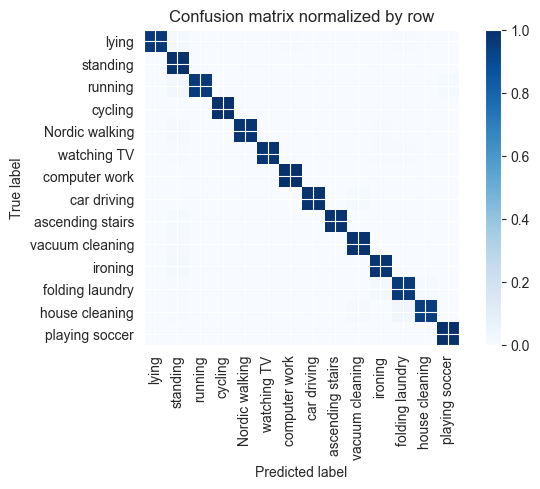

Overall accuracy: 0.980




unseen: 100%|██████████| 86/86 [00:06<00:00, 12.82batch/s]


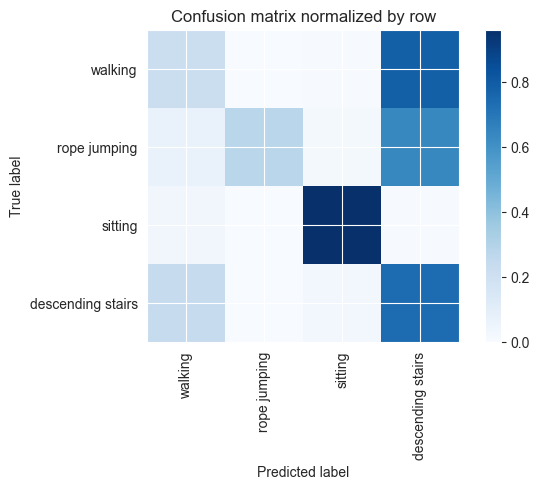

Overall accuracy: 0.551

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.614      0.212      0.315      0.421       2315|	 descending stairs: 0.782,	sitting: 0.006,	
          sitting       0.972      0.961      0.967      0.326       1792|	 walking: 0.032,	descending stairs: 0.007,	
descending stairs       0.247      0.736      0.370      0.171        941|	 walking: 0.236,	sitting: 0.028,	
     rope jumping       1.000      0.276      0.433      0.083        456|	 descending stairs: 0.636,	walking: 0.066,	

----------------------------------------------------------------------------------------------------
      avg / total       0.700      0.551      0.546        1.0       5504|	      

{'accuracy': 0.5510537790697675, 'precision': 0.7081520084768256, 'recall': 0.5465892355174923, 'f1': 0.5212132659223881}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordi


seen: 100%|██████████| 60/60 [00:04<00:00, 12.87batch/s]


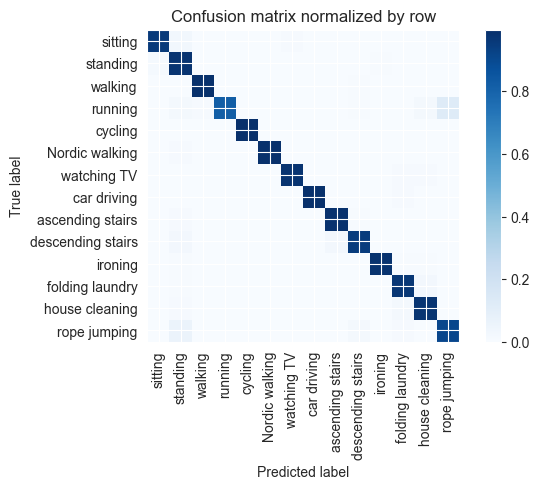

Overall accuracy: 0.971




unseen: 100%|██████████| 111/111 [00:08<00:00, 12.58batch/s]


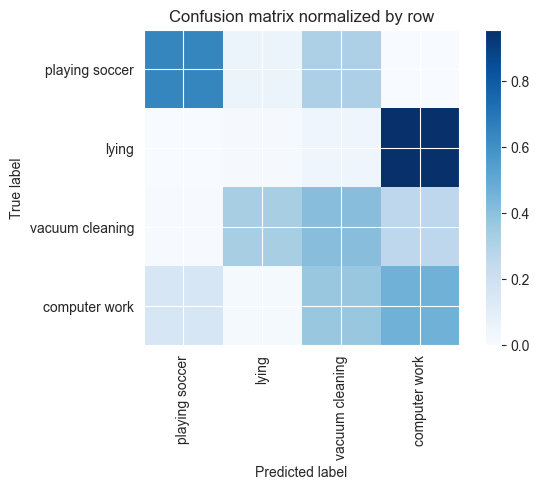

Overall accuracy: 0.342

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.390      0.465      0.424      0.432       3068|	 vacuum cleaning: 0.367,	playing soccer: 0.154,	
          lying       0.022      0.007      0.011      0.264       1875|	 computer work: 0.954,	vacuum cleaning: 0.039,	
vacuum cleaning       0.342      0.408      0.372      0.240       1705|	 lying: 0.326,	computer work: 0.261,	
 playing soccer       0.377      0.640      0.474      0.064        456|	 vacuum cleaning: 0.309,	lying: 0.050,	

----------------------------------------------------------------------------------------------------
    avg / total       0.281      0.342      0.306        1.0       7104|	      

{'accuracy': 0.3420608108108108, 'precision': 0.28274080014332337, 'recall': 0.38036962299687976, 'f1': 0.3205498501220365}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic


seen: 100%|██████████| 69/69 [00:05<00:00, 12.87batch/s]


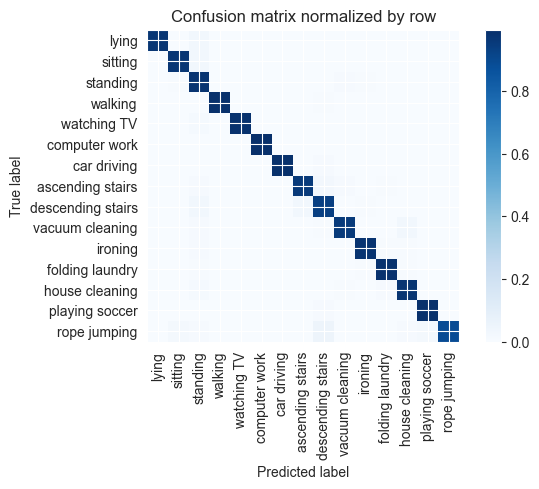

Overall accuracy: 0.973




unseen: 100%|██████████| 68/68 [00:05<00:00, 12.79batch/s]


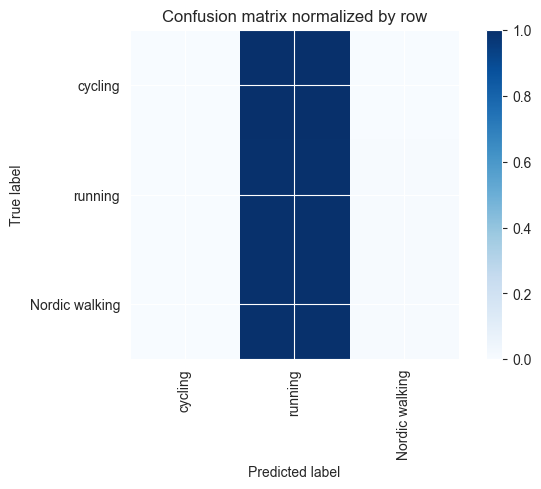

Overall accuracy: 0.216

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.615      0.004      0.009      0.419       1823|	 running: 0.996,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.366       1591|	 running: 1.000,	Nordic walking: 0.000,	
       running       0.215      0.995      0.354      0.216        938|	 Nordic walking: 0.005,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.304      0.216      0.080        1.0       4352|	      

{'accuracy': 0.21622242647058823, 'precision': 0.2768037063957783, 'recall': 0.33301929347073894, 'f1': 0.12077486754497979}
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning'


seen: 100%|██████████| 70/70 [00:05<00:00, 12.72batch/s]


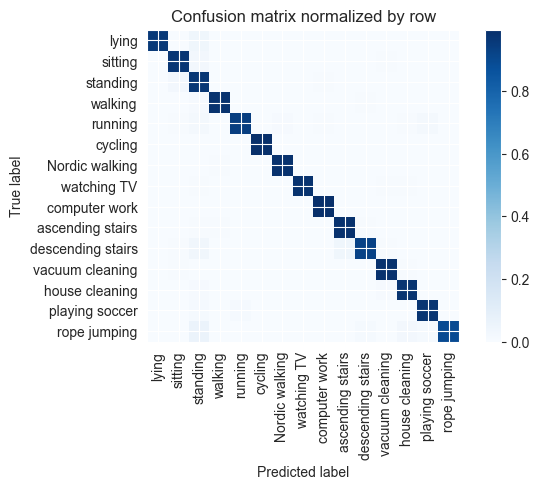

Overall accuracy: 0.975




unseen: 100%|██████████| 60/60 [00:04<00:00, 12.54batch/s]


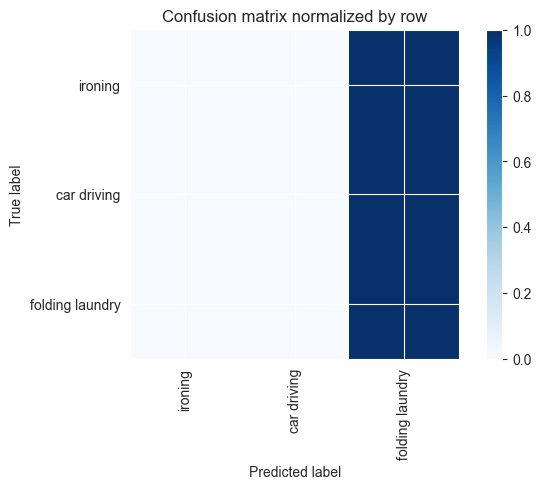

100%|██████████| 19/19 [21:23<00:00, 67.55s/it]

Overall accuracy: 0.253

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.607       2332|	 folding laundry: 1.000,	car driving: 0.000,	
folding laundry       0.253      1.000      0.404      0.253        971|	 car driving: 0.000,	ironing: 0.000,	
    car driving       0.000      0.000      0.000      0.140        537|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.064      0.253      0.102        1.0       3840|	      

{'accuracy': 0.25286458333333334, 'precision': 0.08428819444444445, 'recall': 0.3333333333333333, 'f1': 0.1345527610337421}
============== Overall Unseen Classes Performance ==============


In [37]:
results_with_alpha = {}
for alp in tqdm(range(5,100,5)):
    alp = alp/100

    results_with_alpha[alp] = run_5fold(alp)

In [38]:
results_with_alpha.keys()

dict_keys([0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95])

In [39]:
complete_json = {
    "alpha":[],
    "accuracy":[],
    "precision":[],
    "recall":[],
    "f1":[]
}
for k,v in results_with_alpha.items():
    complete_json["alpha"].append(k)
    complete_json["accuracy"].append(v.to_dict()["accuracy"])
    complete_json["precision"].append(v.to_dict()["precision"])
    complete_json["recall"].append(v.to_dict()["recall"])
    complete_json["f1"].append(v.to_dict()["f1"])

In [40]:
complete_json

{'alpha': [0.05,
  0.1,
  0.15,
  0.2,
  0.25,
  0.3,
  0.35,
  0.4,
  0.45,
  0.5,
  0.55,
  0.6,
  0.65,
  0.7,
  0.75,
  0.8,
  0.85,
  0.9,
  0.95],
 'accuracy': [0.5146948850399411,
  0.5112397981838979,
  0.5076980861646117,
  0.5027280348299619,
  0.5016022792938346,
  0.49883044810990995,
  0.49524573589757975,
  0.4833833062758145,
  0.47829405670323144,
  0.4689571959985364,
  0.45867284005460485,
  0.4529854915575866,
  0.4422468725550755,
  0.43171229724523813,
  0.4233857447593355,
  0.4136437227432749,
  0.4013221421395451,
  0.39256791936577834,
  0.39054376821276204],
 'precision': [0.5428896681353839,
  0.5421525395390738,
  0.5357911604217005,
  0.5356434547228651,
  0.5372451147000785,
  0.5378609384070879,
  0.5393330534000228,
  0.5325312044498148,
  0.5318299666909724,
  0.5259177556364114,
  0.5161254810660055,
  0.513492379882386,
  0.5104975774065716,
  0.5100276296578703,
  0.5135453161629011,
  0.44935570945385067,
  0.4494765237838719,
  0.44549217593790835,

In [41]:
alpha_df = pd.DataFrame.from_dict(complete_json)

In [42]:
alpha_df

,alpha,accuracy,precision,recall,f1
0,0.05,0.514695,0.542890,0.581496,0.483066
1,0.10,0.511240,0.542153,0.579059,0.480291
2,0.15,0.507698,0.535791,0.576308,0.477325
3,0.20,0.502728,0.535643,0.572794,0.473363
4,0.25,0.501602,0.537245,0.572060,0.472714
5,0.30,0.498830,0.537861,0.570333,0.470556
6,0.35,0.495246,0.539333,0.568296,0.467823
7,0.40,0.483383,0.532531,0.558779,0.455834
8,0.45,0.478294,0.531830,0.554422,0.450564
9,0.50,0.468957,0.525918,0.547103,0.440732


In [43]:
alpha_df.to_csv("alpha_analysis.csv",index=False)

<AxesSubplot: xlabel='alpha', ylabel='accuracy'>

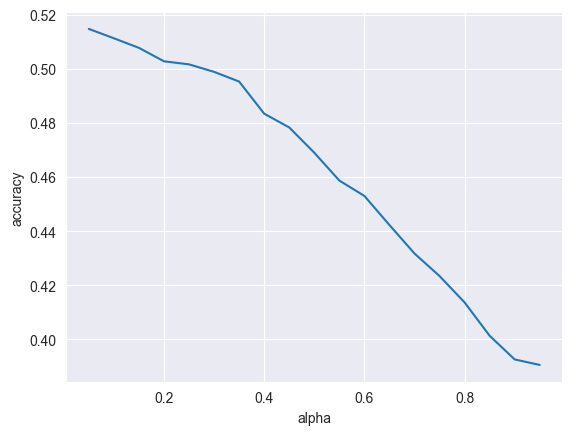

In [44]:
import seaborn as sns

sns.lineplot(data=alpha_df,x="alpha",y="accuracy")

<AxesSubplot: xlabel='alpha', ylabel='f1'>

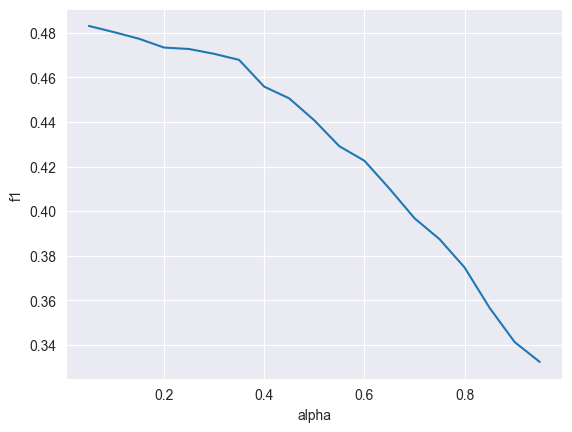

In [45]:
sns.lineplot(data=alpha_df,x="alpha",y="f1")